# Mining the Papers Past

---

Ben Faulks - bmf43@uclive.ac.nz

Xiandong Cai - xca24@uclive.ac.nz

Yujie Cui - ycu23@uclive.ac.nz
<br>
<br>

**After 3 weeks work (23/11 - 16/12), we generally scratched several methods and tools for NLP and topic modeling, and built pipe line to process text and training topic models, in both Python and Spark environment. It is time to organize what we have about topic modeling and what we can do about topic models.**

**The ["Mining the Dispatch"](http://dsl.richmond.edu/dispatch/) project is a great reference for the papers past project. This notebook will try to simulate ["Mining the Dispatch"](http://dsl.richmond.edu/dispatch/), and will present our thinking in the journey of exploration.**

## 0 Environment

### 0.1 Software and package version

Software | Version
--- | ---
Ubuntu | 16.04.5
Python | 3.5.2
Jupyter Lab | 0.35.4  
PySpark | 2.4.0
MALLET | 2.0.8
gensim | 3.4.0

### 0.2 Directory Structure

```
data601                   # project
├── data                  # save all dataset
│   ├── papers_past       # save raw dataset
│   ├── mining            # save dataset after wrangling
└── scripts               # save all notebook files
    └── mining            # this notebook directory
        ├── mining.ipynb  # this notebook
        ├── gensim_mallet # save mallet with gensim files
        ├── wwi_mallet    # save mallet with gensim files for WWI
        ├── mallet        # save mallet with command line files
        ├── subset        # save subset
        └── temp          # save other intermediate files
```

## 1 The Papers Past Dataset Files

In [1]:
path = r'../../data/papers_past'

In [2]:
! du -h $path # check size of dataset

33G	../../data/papers_past


In [3]:
import glob, os
from pprint import pprint
import pandas as pd

import matplotlib.pyplot as plt
plt.style.use('seaborn-darkgrid')
%matplotlib inline

%load_ext memory_profiler

In [4]:
files = glob.glob(path + '/*.txt') # list of each file path
names = [os.path.splitext(os.path.basename(f))[0] for f in files] # list of each file name
lines = [sum(1 for line in open(f)) for f in files] # list of each file line number
info = dict(zip(names, lines)) # dictionary of each file path and line number
print('Total files:', len(files))
print('Total lines:', sum(lines))

Total files: 68
Total lines: 16731578


In [5]:
# transform dict of dataset files to dataframe for statistic and ploting.
df_info = pd.DataFrame.from_dict(info, orient='index').reset_index()
df_info.columns = ['publisher', 'lines']
df_info = df_info.sort_values('lines', ascending=False)
df_info.describe().round(1)

,lines
count,68.0
mean,246052.6
std,412172.6
min,112.0
25%,16055.8
50%,100107.0
75%,328842.0
max,3007465.0


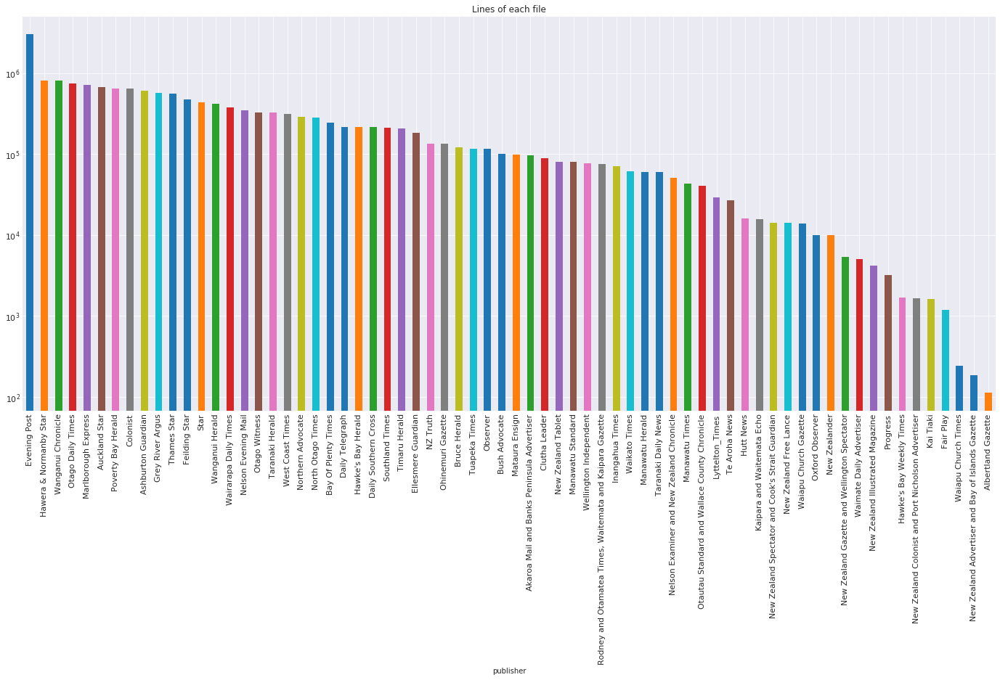

In [6]:
# plot dataset files size info
df_info.plot(kind='bar', 
             x='publisher', 
             y='lines', 
             logy=True, 
             figsize=(24,10), 
             title='Lines of each file', 
             fontsize=11, 
             legend=False)

**The Papers Past dataset has:**
* total 33 GB,
* total 68 files, 
* total 16,731,578 lines(samples), 
* mean 246,052 lines per file,
* each file contains lines from 3,007,465 (Evening Post) to 112 (Albertland Gazette).

## 2 Loading the Dataset

**The dataset comprise TSV data in txt files, there are several ways to load TSV data, in this notebook, we have two choices, Pandas or PySpark. Let's try them respectively.**

### 2.1 Using Pandas

In [7]:
%%time
%%memit

# load into pandas dataframe
df = pd.concat(map(
                   lambda file: pd.read_table(file, 
                                              header=None, 
                                              index_col=None, 
                                              encoding='utf8', 
                                              error_bad_lines=False), 
                   files), 
               ignore_index=True) # read all files in one dataframe.

b'Skipping line 88233: expected 6 fields, saw 7\n'
b'Skipping line 529265: expected 6 fields, saw 7\n'
b'Skipping line 45692: expected 6 fields, saw 7\nSkipping line 50660: expected 6 fields, saw 7\nSkipping line 68241: expected 6 fields, saw 7\n'
b'Skipping line 40187: expected 6 fields, saw 7\n'
b'Skipping line 13415: expected 6 fields, saw 7\n'
b'Skipping line 8556: expected 6 fields, saw 7\nSkipping line 23496: expected 6 fields, saw 7\nSkipping line 39803: expected 6 fields, saw 7\nSkipping line 44282: expected 6 fields, saw 7\nSkipping line 44503: expected 6 fields, saw 7\nSkipping line 47508: expected 6 fields, saw 7\n'
b'Skipping line 44: expected 6 fields, saw 7\n'
b'Skipping line 65298: expected 6 fields, saw 7\n'
b'Skipping line 260877: expected 6 fields, saw 7\n'
b'Skipping line 301373: expected 6 fields, saw 7\nSkipping line 354037: expected 6 fields, saw 7\n'
b'Skipping line 12698: expected 6 fields, saw 7\nSkipping line 20034: expected 6 fields, saw 7\nSkipping line 2070

peak memory: 60615.08 MiB, increment: 60500.82 MiB
CPU times: user 5min 24s, sys: 22 s, total: 5min 46s
Wall time: 5min 57s


In [8]:
df.columns = ['id', 'url', 'publisher', 'time', 'title', 'content']
print('Shape of dataframe:', df.shape)
print('Bad line number:', sum(lines) - df.shape[0])
df.sample(3)

Shape of dataframe: (16716568, 6)
Bad line number: 15010


,id,url,publisher,time,title,content
5407284,7808718,http://api.digitalnz.org/records/7808718/source,Marlborough Express,1890-04-18T00:00:00.000Z,"PORT OF WAIRAU. (Marlborough Express, 18 April...",PORT OF WAIRAU.ARRIVALS. ■-. . -?■ - April 17-...
14047148,18644616,http://api.digitalnz.org/records/18644616/source,Evening Post,1942-02-17T00:00:00.000Z,"TERRACE TUNNEL SITES (Evening Post, 17 Februar...","TERRACE TUNNEL SITES(To the Editor.) Sir,—Atte..."
3931498,7637711,http://api.digitalnz.org/records/7637711/source,Ashburton Guardian,1900-11-03T00:00:00.000Z,Weather Report for October. (Ashburton Guardia...,Weather Report for October.Wr A. IS. Peaebe su...


In [9]:
# count null
print('Print Null:')
print(df.isnull().sum())

Print Null:
id               0
url              0
publisher        0
time             0
title            0
content      56077
dtype: int64


In [10]:
df = df.dropna()

print('Shape after drop na:', df.shape)
print('usable line percentage:', df.shape[0]/16731578)
print('removed line number:', 16731578 - df.shape[0])

Shape after drop na: (16660491, 6)
usable line percentage: 0.9957513272208993
removed line number: 71087


**To load full dataset, it takes:**
* Run time 6 minutes,
* Memory 60 GB. 

**After removing bad lines, there are:**
* 16,660,491 (99.575%) lines text usable, 
* 71,087 lines text was removed.

### 2.2 Using PySpark

In [1]:
import glob, os, gc, re
import gzip
import pickle
from pprint import pprint
import pandas as pd
from bs4 import BeautifulSoup

pd.options.display.max_rows = 10

%load_ext memory_profiler

In [2]:
#print(pd.get_option('display.width'))
#print(pd.get_option('display.max_rows'))
#print(pd.get_option('display.max_columns'))
#print(pd.get_option('display.max_colwidth'))
#print(pd.get_option('display.precision'))

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
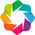

In [2]:
# for ploting
import seaborn as sns
from matplotlib import pyplot as plt
import holoviews as hv
from holoviews import opts
hv.extension('bokeh','matplotlib')
plt.style.use('seaborn-darkgrid')
sns.axes_style("darkgrid")
#sns.set_palette("deep")
%matplotlib inline

In [3]:
# for topic modeling

# Sklearn preprocessing for transforming MALLET result data
import sklearn.preprocessing

# Sklearn train_test_split for subset
from sklearn.model_selection import train_test_split

# Gensim
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
#from gensim.models import CoherenceModel

# NLTK for stop words
import nltk
#nltk.download('stopwords')
from nltk.corpus import stopwords

# Spacy for lemmatization
#! python3 -m spacy download en
import spacy

# pyLDAvis
import pyLDAvis
import pyLDAvis.gensim
pyLDAvis.enable_notebook()

# wordclowd
from wordcloud import WordCloud

INFO:summarizer.preprocessing.cleaner:'pattern' package not found; tag filters are not available for English
INFO:root:Generating grammar tables from /usr/lib/python3.5/lib2to3/Grammar.txt
INFO:root:Generating grammar tables from /usr/lib/python3.5/lib2to3/PatternGrammar.txt


In [4]:
# for PySpark
import findspark
import pyspark
from pyspark import SparkContext, SparkConf
from pyspark.sql import functions as F
from pyspark.sql.types import *
from pyspark.sql.session import SparkSession
#from pyspark.ml import Pipeline
#from pyspark.ml.feature import RegexTokenizer, \
                               #Tokenizer, \
                               #StopWordsRemover 
                               #CountVectorizer 
                               #IDF
                               #NGram 
                               #HashingTF 
#from pyspark.ml.clustering import LDA, \
#                                  LDAModel

In [5]:
findspark.init()
# start a Spark context and session
conf = SparkConf()
conf.setAppName('local')
conf.set('spark.driver.cores', 6) # set processor number
conf.set('spark.driver.memory', '62g') # set memory size
conf.set('spark.driver.maxResultSize', '4g')

try:
    sc.stop()
    sc = SparkContext(conf=conf)
except:
    sc = SparkContext(conf=conf)

# passing spark context ot sql module
spark = SparkSession(sc)

# print configurations
pprint(spark.sparkContext._conf.getAll())

[('spark.driver.port', '37257'),
 ('spark.app.name', 'local'),
 ('spark.app.id', 'local-1547356659155'),
 ('spark.rdd.compress', 'True'),
 ('spark.serializer.objectStreamReset', '100'),
 ('spark.driver.host', '192.168.1.207'),
 ('spark.driver.memory', '62g'),
 ('spark.master', 'local[*]'),
 ('spark.executor.id', 'driver'),
 ('spark.submit.deployMode', 'client'),
 ('spark.ui.showConsoleProgress', 'true'),
 ('spark.driver.cores', '6'),
 ('spark.driver.maxResultSize', '4g')]


In [7]:
# check context
sc

<SparkContext master=local[*] appName=local>

In [133]:
%%time
%%memit

path = r'../../data/papers_past'

data_schema = StructType([
    StructField('id', IntegerType()),
    StructField('url', StringType()),
    StructField('publisher', StringType()),
    StructField('time', StringType()),
    StructField('title', StringType()),
    StructField('content', StringType())
])

df = (
    spark.read.format("com.databricks.spark.csv")
    .option("header", "false")
    .option("inferSchema", "false")
    .option("delimiter", "\t")
    .schema(data_schema)
    .load(path)
)

#df.cache()

peak memory: 17296.13 MiB, increment: 0.00 MiB
CPU times: user 368 ms, sys: 472 ms, total: 840 ms
Wall time: 1.37 s


In [9]:
print('Shape of dataframe: ({}, {})'.format(df.count(), len(df.columns)))
#print(df.rdd.takeSample(False, 3))
df.sample(False, 0.00001).limit(3).show()

Shape of dataframe: (16731578, 6)
+--------+--------------------+------------------+--------------------+--------------------+--------------------+
|      id|                 url|         publisher|                time|               title|             content|
+--------+--------------------+------------------+--------------------+--------------------+--------------------+
|16114190|http://api.digita...|Poverty Bay Herald|1914-06-18T00:00:...|Untitled (Poverty...|For Chronic' Ches...|
|16375427|http://api.digita...|Poverty Bay Herald|1915-03-17T00:00:...|Untitled (Poverty...|Users of famous u...|
| 3556452|http://api.digita...|     Tuapeka Times|1871-10-19T00:00:...|Page 3 Advertisem...|mO TRAVEL THIS SE...|
+--------+--------------------+------------------+--------------------+--------------------+--------------------+



In [10]:
# Count null
print('Print Null:')
df.select([F.count(F.when(F.col(c).isNull() | (F.col(c) == ''), c)).alias(c) for c in df.columns]).show()

Print Null:
+---+---+---------+----+-----+-------+
| id|url|publisher|time|title|content|
+---+---+---------+----+-----+-------+
|  0|  0|        0|   0|    0|  56232|
+---+---+---------+----+-----+-------+



In [134]:
# Clean NA to avoid nonetype.
df = df.na.drop(subset=['content'])

In [12]:
nrow = df.count()
ncol = len(df.columns)

print('Shape after drop na: ({}, {})'.format(nrow, ncol))
print('usable line percentage:', nrow/16731578)
print('removed line number:', 16731578 - nrow)    

Shape after drop na: (16675346, 6)
usable line percentage: 0.9966391693598775
removed line number: 56232


**To load full dataset, it takes:**
* Run time 2 s,
* Memory 216 MB. 

**After removing bad lines, there are:**
* 16,675,346 (99.664%) lines text usable, 
* 56,232 lines text was removed.

### 2.3 Pandas vs. PySpark

**From above we see that PySpark use less memory and has better performance, while Pandas is easy to use. In fact, it is not correct comparing them by only simply using a magic command (all transformations in Spark are lazy, it takes more memory than Pandas while run tasks), but basically the direction of the previous conclusion is correct. Due to the advantages of the parallel computing of Spark, the performance of PySpark is much better than Python. And for unknown reasons, loading data by PySpark did not meet the parsing issue that Pandas does, so there are more usable lines with PySpark than with Pandas (99664% vs 99.575%). For above reasons, we select PySpark as our data process platform in the data loading and data exploring part.**

## 3 Exploring the Dataset

**After loading the full dataset, we are eager to know more detail about the dataset, let's do some wrangling and visualization works on it.**

### 3.1 Data wrangling

**We will analyize the columns of the dataset one by one, except the "url" and "content" column.**

#### 3.1.1 "id" column

In [13]:
print('Duplicated id number: ', df.count() - df.select('id').distinct().count())

Duplicated id number:  543700


**We expected "id" is unique, but we see there are 543,700 ids are not unique.**

In [14]:
df.groupBy('id').count().where(F.col('count')>1).show(3)

+--------+-----+
|      id|count|
+--------+-----+
|10036037|    2|
|10059447|    2|
|10099968|    2|
+--------+-----+
only showing top 3 rows



**Let's select one id to check the duplicates.**

In [15]:
df.filter(df.id == 10036037).show()

+--------+--------------------+------------------+--------------------+--------------------+--------------------+
|      id|                 url|         publisher|                time|               title|             content|
+--------+--------------------+------------------+--------------------+--------------------+--------------------+
|10036037|http://api.digita...|Poverty Bay Herald|1898-01-06T00:00:...|THE EASTERN SITUA...|THE EASTERN SITUA...|
|10036037|http://api.digita...|Poverty Bay Herald|1898-01-06T00:00:...|THE EASTERN SITUA...|THE EASTERN SITUA...|
+--------+--------------------+------------------+--------------------+--------------------+--------------------+



**Check difference of content.**

In [16]:
import difflib

str1 = df.filter(df.id == 10036037).select('content').collect()[0]['content']
#print(str1 + '\n')

str2 = df.filter(df.id == 10036037).select('content').collect()[1]['content']
#print(str2 + '\n')

diff = difflib.SequenceMatcher(None, str1, str2).ratio()

print('Similarity: ', diff)

Similarity:  0.9994846688997681


**Unfortunately, the content of duplicated id is different (very close though), it might because that the papers past website update some data but forget to delete the old version. We have three choices to deal with the duplicates:**

* remove all duplicates;
* remove one of the two duplicates;
* add an unique id for each of row.

**Since the content of duplicates is very close, to avoid increasing or decreasing words, we decide to remove one of the two duplicates.**

<!-- **To keep the integrity of the dataset, we decide add unique ids.** -->

In [135]:
df = df.drop_duplicates(subset=['id'])

In [18]:
print('Row number after deduplication:', df.count())
df.sample(False, 0.00001).limit(3).show()

Row number after deduplication: 16131646
+--------+--------------------+-------------------+--------------------+--------------------+--------------------+
|      id|                 url|          publisher|                time|               title|             content|
+--------+--------------------+-------------------+--------------------+--------------------+--------------------+
|17929510|http://api.digita...|       Evening Post|1928-07-06T00:00:...|KHANDALLAH AFFAIR...|KHANDALLAH AFFAIR...|
|24836281|http://api.digita...|Bay Of Plenty Times|1915-11-10T00:00:...|French Steamer Af...|French Steamer Af...|
|32670798|http://api.digita...|  Otago Daily Times|1913-07-11T12:00:00Z|RAILWAY DISASTER....|RAILWAY DISASTER....|
+--------+--------------------+-------------------+--------------------+--------------------+--------------------+



#### 3.1.2 "publisher" column

**Let's check the unique number of publisher to ensure accuracy.**

In [19]:
df.select('publisher').distinct().count()

68

**There are 68 files from each publisher so the publisher column is good.**

#### 3.1.3 "time" column

**In the dataframe schema, time column set to string type, so our first job is to convert it to date type.**

In [136]:
df = df.withColumn('date', df['time'].cast(DateType()))

In [21]:
df.printSchema()

root
 |-- id: integer (nullable = true)
 |-- url: string (nullable = true)
 |-- publisher: string (nullable = true)
 |-- time: string (nullable = true)
 |-- title: string (nullable = true)
 |-- content: string (nullable = true)
 |-- date: date (nullable = true)



**Check the start and end of date.**

In [22]:
start, end = df.select(F.min('date'), F.max('date')).first()
start, end

(datetime.date(1839, 8, 21), datetime.date(1945, 12, 31))

**We see the dataset collected papers from 21/8/1839 to 31/12/1945.**

#### 3.1.4 "title" column

**Let's randomly print 10 lines of title, to see what it look like.**

In [23]:
df.sample(False, 0.00001).limit(10).select('id', 'publisher', 'date', 'title').show(10, False)

+--------+----------------------+----------+-------------------------------------------------------------------+
|id      |publisher             |date      |title                                                              |
+--------+----------------------+----------+-------------------------------------------------------------------+
|28982711|Daily Telegraph       |1886-03-01|TELEGRAMS. (Daily Telegraph, 01 March 1886)                        |
|11553054|Southland Times       |1894-02-13|Page 1 Advertisements Column 6 (Southland Times, 13 February 1894) |
|4040048 |Grey River Argus      |1875-10-18|Page 2 Advertisements Column 1 (Grey River Argus, 18 October 1875) |
|6499274 |Taranaki Herald       |1881-09-19|Page 1 Advertisements Column 1 (Taranaki Herald, 19 September 1881)|
|7431538 |Poverty Bay Herald    |1889-04-26|Page 3 Advertisements Column 3 (Poverty Bay Herald, 26 April 1889) |
|15245659|Star                  |1902-10-25|FOR MERIT." (Star, 25 October 1902)                 

**We see that a title consists of three parts: "real title" ("publisher", "date").**

**Since we already has publisher and date columns, we could remove publisher and date parts from title.**

**And we see that titles also explicitly indicate "advertisements", which means we could utilize it to extract a new feature to mark a row is advertisements or not.**

**Let's extract a new column "ads" and remove redandunt parts of titles.**

In [137]:
# extract a new feature
df = df.withColumn('ads', df.title.contains('dvertisement'))
#df = df.withColumn('ads', df.title.contains('Advertisements')) # safer in above code

# remove redandunt parts
df = df.withColumn('title_', F.regexp_extract(F.col('title'), '(.*)(\s\(.*\))', 1))

**Check if some titles are not the form "title ("publisher", "date"), which will lead to "title_" column is empty string.**

In [25]:
df.where(F.col('title_') == '').select(['id', 'title_', 'title']).show(10, False)

+--------+------+---------------------+
|id      |title_|title                |
+--------+------+---------------------+
|3656781 |      |Untitled Illustration|
|4832017 |      |Untitled Illustration|
|5417742 |      |Untitled Illustration|
|12676570|      |Untitled Illustration|
|12777321|      |Untitled Illustration|
|13040196|      |Untitled Illustration|
|13185780|      |Untitled Illustration|
|13571791|      |Untitled Illustration|
|13743606|      |Untitled Illustration|
|15711631|      |Untitled Illustration|
+--------+------+---------------------+
only showing top 10 rows



**Change empty string in "title_" column to "Untitled Illustration".**

In [139]:
df = df.withColumn(
    'title_',
    F.when(
        F.col('title_') == '',
        F.lit('Untitled Illustration')
    ).otherwise(
        F.col('title_')
    )
)

In [27]:
#check if contain empty string
#df.where(F.col('title_') == '').select(['id', 'title_', 'title']).show(10, False)

**To save space, we drop the redundant and useless columns (url, time, title), keep the left columns (id, publisher, date, title_, ads, content), and rename "title_" column to "title".**

In [140]:
df = df.select(F.col('id'), 
               F.col('publisher'), 
               F.col('date'), 
               F.col('ads'), 
               F.col('title_').alias('title'), 
               F.col('content'))

**Print sample size, schema and random 10 rows:**

In [141]:
print('Shape of dataframe: ({}, {})'.format(df.count(), len(df.columns)))
df.printSchema()
df.sample(False, 0.00001).limit(10).show()

Shape of dataframe: (16131646, 6)
root
 |-- id: integer (nullable = true)
 |-- publisher: string (nullable = true)
 |-- date: date (nullable = true)
 |-- ads: boolean (nullable = true)
 |-- title: string (nullable = true)
 |-- content: string (nullable = true)

+--------+-----------------+----------+-----+--------------------+--------------------+
|      id|        publisher|      date|  ads|               title|             content|
+--------+-----------------+----------+-----+--------------------+--------------------+
|14564561|      Thames Star|1908-02-13|false|             DURBAR.|DURBAR.Driving op...|
| 7728910|Otago Daily Times|1870-03-04|false|      THE SUEZ MAIL,|THE SUEZ MAIL,ARR...|
|28240380|    Auckland Star|1891-02-02|false|     OUR GOLDFIELDS.|OUR GOLDFIELDS.Tf...|
| 8113290|  Southland Times|1883-06-12|false|NOTICE TO CORRESP...|b'NOTICE TO CORRE...|
|27602814|         Observer|1920-08-21|false|         THE KITCHEN|THE KITCHENBaked ...|
| 9248486|      Thames Star|1889-0

#### 3.1.5 Region Column

**Based on [this](https://paperspast.natlib.govt.nz/newspapers/all#region) publisher-region relationship, we could add region feature to dataset. First we scrape the relationship table from the webpage, then map publishers with the regions in the dataset.**

(It is difficult download data from [paperspat](https://paperspast.natlib.govt.nz) directly due to its elaborate anti-crawling mechanism, we saved files we need from [paperspat](https://paperspast.natlib.govt.nz) in a temp space on github.)

In [30]:
!wget --no-check-certificate \
      --content-disposition \
      https://github.com/xandercai/temp/raw/master/Papers%20Past%20_%20Explore%20all%20newspapers.html \
      -O ./temp/region.html

--2019-01-10 12:41:52--  https://github.com/xandercai/temp/raw/master/Papers%20Past%20_%20Explore%20all%20newspapers.html
Resolving github.com (github.com)... 192.30.255.112, 192.30.255.113
Connecting to github.com (github.com)|192.30.255.112|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/xandercai/temp/master/Papers%20Past%20_%20Explore%20all%20newspapers.html [following]
--2019-01-10 12:41:53--  https://raw.githubusercontent.com/xandercai/temp/master/Papers%20Past%20_%20Explore%20all%20newspapers.html
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.164.133
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.164.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 36028 (35K) [text/plain]
Saving to: ‘./temp/region.html’

./temp/region.html  100%[===================>]  35.18K  --.-KB/s    in 0.02s   

2019-01-10 12:41:53 (1.74 MB/s) - ‘./temp/reg

In [142]:
# read webpage
path = r'./temp/region.html'
with open(path, 'r') as f:
    html = f.read()

# get table 
soup = BeautifulSoup(html, "html.parser")
table = soup.find('table', attrs={'class':'table datatable'})
table_rows = table.find_all('tr')
res = []
for tr in table_rows:
    td = tr.find_all('td')
    row = [tr.text.strip() for tr in td if tr.text.strip()]
    if row:
        res.append(row)

# transform table to pandas dataframe
df_region = pd.DataFrame(res, columns=['publisher_', 'region', 'start_', 'end_']) # column_ means it will be drop later

# transform pandas dataframe to pyspark dataframe
df_region = spark.createDataFrame(df_region).orderBy('region')

In [32]:
df_region.printSchema()
print('Shape of dataframe: ({}, {})'.format(df_region.count(), len(df_region.columns)))
df_region.show(200, False)

root
 |-- publisher_: string (nullable = true)
 |-- region: string (nullable = true)
 |-- start_: string (nullable = true)
 |-- end_: string (nullable = true)

Shape of dataframe: (148, 4)
+--------------------------------------------------------+-----------------+------+----+
|publisher_                                              |region           |start_|end_|
+--------------------------------------------------------+-----------------+------+----+
|Daily Southern Cross                                    |Auckland         |1843  |1876|
|Auckland Times                                          |Auckland         |1842  |1846|
|Albertland Gazette                                      |Auckland         |1862  |1864|
|Auckland Chronicle and New Zealand Colonist             |Auckland         |1842  |1845|
|Auckland Star                                           |Auckland         |1870  |1945|
|Pukekohe & Waiuku Times                                 |Auckland         |1912  |1924|
|Kaipara a

**Add region column.**

In [33]:
# use another dataframe name to delete it later because this dataframe is not correct.
df_ = (df.join(df_region, df.publisher == df_region.publisher_, how='left')
       .orderBy('id')
       .select(F.col('id'), 
               F.col('publisher'), 
               F.col('region'), 
               F.col('date'), 
               F.col('ads'), 
               F.col('title'), 
               F.col('content')))

**Check if miss any region:**

In [34]:
print('Print Null:')
#df_.select([F.count(F.when(F.col(c).isNull(), c)).alias(c) for c in df.columns]).show()
df_.select([F.count(F.when(F.col(c).isNull() | (F.col(c) == ''), c)).alias(c) for c in ['publisher', 'region']]).show()

Print Null:
+---------+------+
|publisher|region|
+---------+------+
|        0|353333|
+---------+------+



In [35]:
df_.filter(F.col('region').isNull()).select('publisher').distinct().show(20, False)

+--------------------------------+
|publisher                       |
+--------------------------------+
|Bay Of Plenty Times             |
|New Zealand Free Lance          |
|Kai Tiaki                       |
|New Zealand Illustrated Magazine|
|Progress                        |
|Waiapu Church Times             |
|Waiapu Church Gazette           |
|Fair Play                       |
|New Zealand Tablet              |
+--------------------------------+



In [36]:
# delet useless dataframe to save memory
del df_
gc.collect()

465

**There are 353,333 rows data without the region. After checking the publisher-region table, we found "Bay Of Plenty Times" mismatch by "of", "New Zealand Free Lance" mismatch by "New Zeland", others do not appear in the publisher-region table.**

In [37]:
df_region.filter((df_region.publisher_ == 'Bay of Plenty Times') | (df_region.publisher_ == 'Free Lance')).show(10, False)

+-------------------+-------------+------+----+
|publisher_         |region       |start_|end_|
+-------------------+-------------+------+----+
|Bay of Plenty Times|Bay of Plenty|1872  |1949|
|Free Lance         |Wellington   |1900  |1920|
+-------------------+-------------+------+----+



**We modify the publisher-region table to fit the mismatch of "Bay Of Plenty Times" and "New Zealand Free Lance", while others we have to fill it's region column with "unknown".**

In [143]:
# update df_region for Bay Of Plenty Times and New Zealand Free Lance
df_region = df_region.withColumn(
    'publisher_',
    F.when(
        F.col('publisher_') == 'Bay of Plenty Times',
        F.lit('Bay Of Plenty Times')
    ).otherwise(
        F.col('publisher_')
    )
).withColumn(
    'publisher_',
    F.when(
        F.col('publisher_') == 'Free Lance',
        F.lit('New Zealand Free Lance')
    ).otherwise(
        F.col('publisher_')
    )
)

**Check if values were modified, and add region column to the dataframe.**

In [39]:
df_region.filter((df_region.publisher_ == 'Bay Of Plenty Times') | (df_region.publisher_ == 'New Zealand Free Lance')).show(10, False)

+----------------------+-------------+------+----+
|publisher_            |region       |start_|end_|
+----------------------+-------------+------+----+
|Bay Of Plenty Times   |Bay of Plenty|1872  |1949|
|New Zealand Free Lance|Wellington   |1900  |1920|
+----------------------+-------------+------+----+



In [144]:
df = (df.join(df_region, df.publisher == df_region.publisher_, how='left')
      .select(F.col('id'), 
              F.col('publisher'), 
              F.col('region'), 
              F.col('date'), 
              F.col('ads'), 
              F.col('title'), 
              F.col('content'))
      )

**Fill null in region column with "unknwon".**

In [145]:
df = df.na.fill({'region':'unknown'})

**Check if miss any field or element:**

In [42]:
print('Print Null and empty string:')
df.select([F.count(F.when(F.col(c).isNull() | (F.col(c) == ''), c)).alias(c) for c in df.columns]).show()

Print Null and empty string:
+---+---------+------+----+---+-----+-------+
| id|publisher|region|date|ads|title|content|
+---+---------+------+----+---+-----+-------+
|  0|        0|     0|   0|  0|    0|      0|
+---+---------+------+----+---+-----+-------+



**Check sample szie, schema and print random 20 rows:**

In [146]:
df = df.orderBy('id')

In [147]:
print('Shape of dataframe: ({}, {})'.format(df.count(), len(df.columns)))
df.printSchema()
df.sample(False, 0.00001).limit(20).show()

Shape of dataframe: (16131646, 7)
root
 |-- id: integer (nullable = true)
 |-- publisher: string (nullable = true)
 |-- region: string (nullable = false)
 |-- date: date (nullable = true)
 |-- ads: boolean (nullable = true)
 |-- title: string (nullable = true)
 |-- content: string (nullable = true)

+-------+--------------------+-----------------+----------+-----+--------------------+--------------------+
|     id|           publisher|           region|      date|  ads|               title|             content|
+-------+--------------------+-----------------+----------+-----+--------------------+--------------------+
|2036173|  Hawke's Bay Herald|      Hawke's Bay|1863-07-25| true|Page 1 Advertisem...|EX "ROYAL BRIDE,"...|
|2665266|New Zealand Spect...|       Wellington|1844-11-30|false|To the Editor of ...|To the Editor of ...|
|2669786| Nelson Evening Mail|           Nelson|1887-09-23|false|THIS DAY'S TELEGR...|THIS DAY'S TELEGR...|
|2879616|       Otago Witness|            Otago|187

### 3.2 Saving Dataset

**This dataframe would be our final dataset to deal with, let's save it as compressed csv file to save time for later processes.**

In [148]:
df.write.csv('../../data/mining', mode='overwrite', compression='gzip')

In [6]:
!du -sh ../../data/papers_past
!du -sh ../../data/mining

33G	../../data/papers_past
14G	../../data/mining


**After processing and compressing, the dataset reduce from 33GB to 14GB.**

### 3.3 Dataset Analysis and Visualization

**We will analyze and visualize a column or columns to find features or patterns.**

#### 3.3.1 Loading Data

**Load data from csv file:**

In [6]:
# load data if start the process from here.

path = r'../../data/mining'

data_schema = StructType([
    StructField('id', IntegerType()),
    StructField('publisher', StringType()),
    StructField('region', StringType()),
    StructField('date', DateType()),
    StructField('ads', BooleanType()),
    StructField('title', StringType()),
    StructField('content', StringType())
])
df = (
    spark.read.format("com.databricks.spark.csv")
    .option("header", "false")
    .option("inferSchema", "false")
    .schema(data_schema)
    .load(path)
    .orderBy('id')
)

In [7]:
print('Shape of dataframe: ({}, {})'.format(df.count(), len(df.columns)))
df.sample(False, 0.00001).limit(10).show()

Shape of dataframe: (16131646, 7)
+-------+--------------------+----------+----------+-----+--------------------+--------------------+
|     id|           publisher|    region|      date|  ads|               title|             content|
+-------+--------------------+----------+----------+-----+--------------------+--------------------+
|1872067|        Bruce Herald|     Otago|1866-07-26|false|            Untitled|(To the Editor of...|
|2050984|  Ashburton Guardian|Canterbury|1888-05-04|false|RAKAIA AND ASHBUR...|RAKAIA AND ASHBUR...|
|2118616|     Lyttelton Times|Canterbury|1858-01-02| true|Page 2 Advertisem...|NOTICE. MRS. CARD...|
|2300089|    Grey River Argus|West Coast|1870-01-15|false|   THEATRICAL NOTES.|THEATRICAL NOTES....|
|2507978|     Inangahua Times|West Coast|1888-12-12| true|Page 3 Advertisem...|EXCURSION FARES. ...|
|2523268|        Bruce Herald|     Otago|1880-08-20| true|Page 3 Advertisem...|b'/ NbTIFICATION....|
|2665421|New Zealand Spect...|Wellington|1844-12-07| true

In [8]:
# check null and empty string
df.select([F.count(F.when(F.col(c).isNull() | (F.col(c) == ''), c)).alias(c) for c in df.columns]).show()

+---+---------+------+----+---+-----+-------+
| id|publisher|region|date|ads|title|content|
+---+---------+------+----+---+-----+-------+
|  0|        0|     0|   0|  0|    0|      0|
+---+---------+------+----+---+-----+-------+



#### 3.3.2 Advertisements

**How many advertisements in total? What is the ratio?**

ADs number:4416034
ADs proportion:27.37497463061116



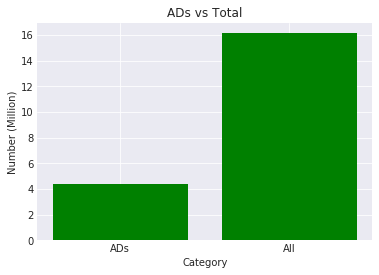

In [9]:
n_ads = df.where(F.col('ads') == True).count()
n_all = df.count()
print('ADs number:{0}\nADs proportion:{1}\n'.format(n_ads, 100*n_ads/n_all))

x = ['ADs', 'All']
value = [n_ads/1000000, n_all/1000000]
x_pos = [i for i, _ in enumerate(x)]
plt.bar(x_pos, value, color='green')
plt.xlabel('Category')
plt.ylabel('Number (Million)')
plt.title("ADs vs Total")
plt.xticks(x_pos, x)
plt.show()

**There are 4,416,034 advertisements in total samples, accounting for 27.4%. Since one paper was sliced to several samples, each slice of paper may take several advertisememts, so the number of advertisements is the count of advertisement slices (samples), not individual advertisement.**

#### 3.3.3 Papers

**Considering each row in the dataset is a sample (or observer), each paper consisting multiple samples, assuming each publisher publishs at most one paper in the same day, we could group publisher and date columns to get the real number of papers of each day.**

In [13]:
# transform to pandas dataframe for ploting
df_paper = (df.groupBy('publisher', 'date').count()
            .join(df_region, df.publisher == df_region.publisher_, how='left')
            .select('publisher', 'region', 'date')
            .toPandas().sort_values('date', ascending=True).reset_index(drop=True))

In [14]:
df_paper.region = df_paper.region.fillna('unknown')

In [15]:
# display random 5 row
df_paper.sample(5)

,publisher,region,date
97648,Hawera & Normanby Star,Taranaki,1883-07-07
221720,Hawera & Normanby Star,Taranaki,1899-10-07
93308,West Coast Times,West Coast,1882-12-07
127244,Hawke's Bay Herald,Hawke's Bay,1887-06-20
63089,Timaru Herald,Canterbury,1878-03-05


**Plot total paper number of each publisher:**

In [16]:
df_paper_count = (df_paper.groupby('publisher').size()
                  .reset_index(name='count')
                  .sort_values('count', ascending=False))

In [17]:
df_paper_count.T

,12,44,15,8,64,30,56,67,27,65,...,62,33,18,21,36,49,13,32,1,60
publisher,Evening Post,Otago Daily Times,Grey River Argus,Colonist,Wanganui Chronicle,Nelson Evening Mail,Thames Star,West Coast Times,Marlborough Express,Wanganui Herald,...,Waimate Daily Advertiser,New Zealand Colonist and Port Nicholson Advert...,Hawke's Bay Weekly Times,Kai Tiaki,New Zealand Illustrated Magazine,Progress,Fair Play,New Zealand Advertiser and Bay of Islands Gazette,Albertland Gazette,Waiapu Church Times
count,23557,16519,14669,13562,12341,12238,11953,11869,11739,11587,...,231,105,90,88,51,36,27,27,11,9


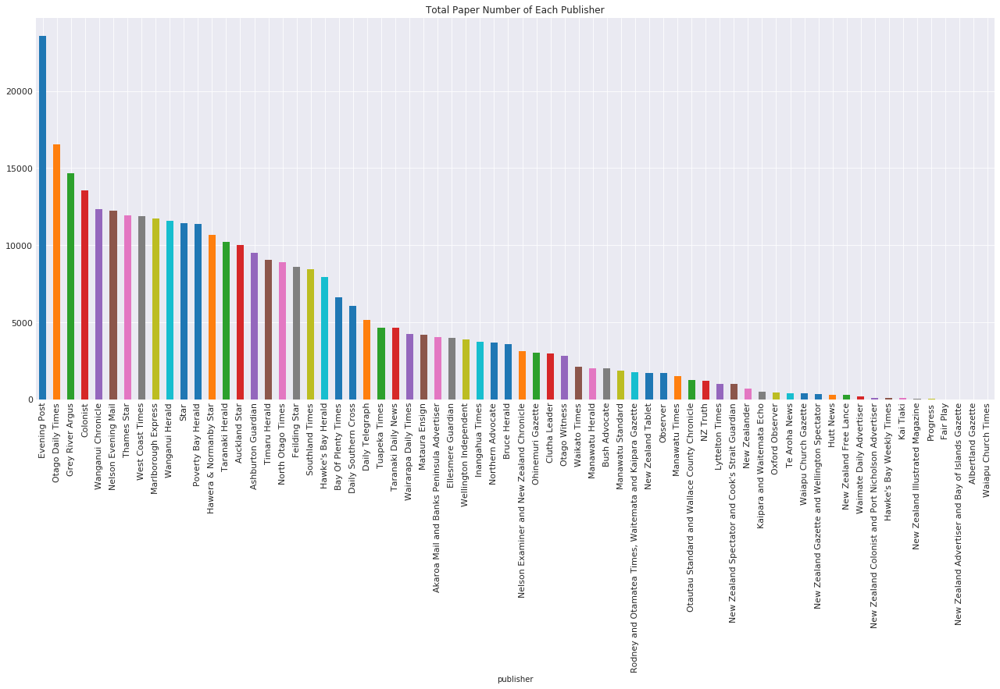

In [18]:
df_paper_count.plot(kind='bar', 
                    x='publisher', 
                    y='count', 
                    logy=False, 
                    figsize=(22,9), 
                    title='Total Paper Number of Each Publisher', 
                    fontsize=11, 
                    legend=False)

**Plot total paper number of each region:**

In [19]:
df_region_count = (df_paper.groupby('region').size()
                   .reset_index(name='count')
                   .sort_values('count', ascending=False))

In [20]:
df_region_count.T

,10,2,5,13,14,8,11,0,12,4,6,3,1,9,15,7
region,Otago,Canterbury,Manawatu-Wanganui,Wellington,West Coast,Nelson,Taranaki,Auckland,Waikato,Hawke's Bay,Marlborough,Gisborne,Bay of Plenty,Northland,unknown,National
count,53485,39754,37955,33785,30303,28962,25553,20826,17560,15237,11739,11366,6616,3747,2326,1201


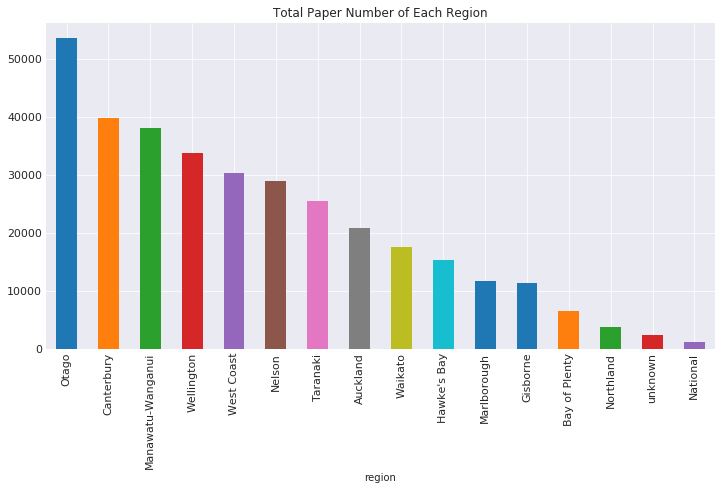

In [21]:
df_region_count.plot(kind='bar', 
                     x='region', 
                     y='count', 
                     logy=False, 
                     figsize=(12, 6), 
                     title='Total Paper Number of Each Region', 
                     fontsize=11, 
                     legend=False)

**It shows that the most prosperous region is Otago, that was unexpected.**

#### 3.3.4 Sample vs. Year

**What's the sample distribution based on years?**

In [22]:
# transform to pandas dataframe for ploting
df_sample_year_count = (df.select(F.date_format('date', 'yyyy').alias('year')).groupBy('year').count()
                        .toPandas().sort_values('year', ascending=True).reset_index(drop=True))

In [23]:
df_sample_year_count.T

,0,1,2,3,4,5,6,7,8,9,...,94,95,96,97,98,99,100,101,102,103
year,1839,1840,1841,1842,1843,1844,1845,1846,1847,1848,...,1936,1937,1938,1939,1940,1941,1942,1943,1944,1945
count,29,806,1091,2579,3625,2319,2586,3768,4596,5430,...,92210,85978,84551,93133,78890,65953,46800,44443,51313,59109


**Histogram:**

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fbc75dbbf28>]],
      dtype=object)

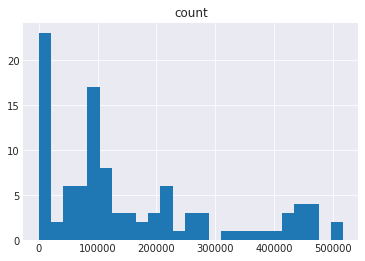

In [24]:
df_sample_year_count.hist(column='count', bins=25)

**Line Chart:**

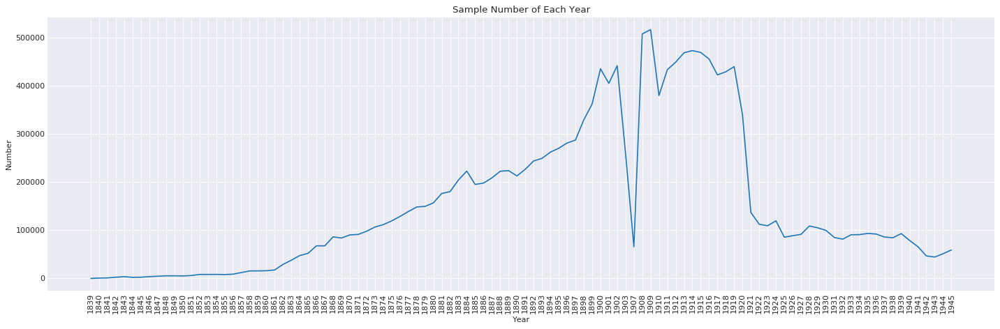

In [25]:
plt.figure(figsize=(18, 6), dpi=80)
plt.plot('year', 'count', data=df_sample_year_count)
plt.xlabel('Year')
plt.ylabel('Number')
plt.xticks(rotation='90')
plt.title('Sample Number of Each Year')
plt.tight_layout()
plt.show()
#df_sample_year_count.plot(kind='bar', x='year', y='count', figsize=(24,10), title='Sample Number of Each Year', fontsize=11, legend=False)

**From above histogram and line chart we see the distribution of samples, but it is not enough. We should plot real number of papers of each year.**

#### 3.3.5 Paper vs. Year

**What's the papers distribution based on years?**

In [26]:
df_paper['date'] = pd.to_datetime(df_paper['date'])

In [27]:
df_paper_year_count = (df_paper
                       .groupby([df_paper['date'].dt.year.rename('year')]).size()
                       .reset_index(name='count').sort_values('year', ascending=True))
df_paper_year_count.year = df_paper_year_count.year.astype(str)
df_paper_year_count.T

,0,1,2,3,4,5,6,7,8,9,...,94,95,96,97,98,99,100,101,102,103
year,1839,1840,1841,1842,1843,1844,1845,1846,1847,1848,...,1936,1937,1938,1939,1940,1941,1942,1943,1944,1945
count,2,64,69,192,253,166,195,271,366,416,...,448,424,421,470,473,473,462,472,469,471


**Histogram:**

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fbc75431748>]],
      dtype=object)

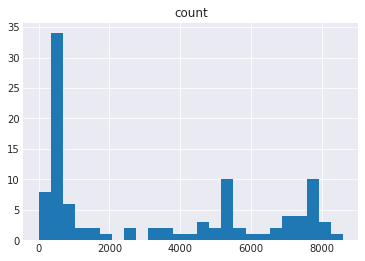

In [28]:
df_paper_year_count.hist(column='count', bins=25)

**Line Chart:**

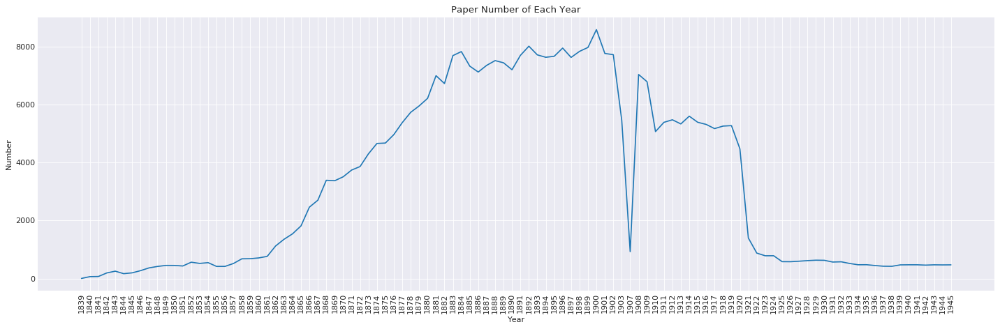

In [29]:
plt.figure(figsize=(18, 6), dpi=80)
plt.plot('year', 'count', data=df_paper_year_count)
plt.xlabel('Year')
plt.ylabel('Number')
plt.xticks(rotation='90')
plt.title('Paper Number of Each Year')
plt.tight_layout()
plt.show()

**Why is there a gap in 1907?**

**Why is there a booming era between 1863 to 1919?**

#### 3.3.6 Paper vs. Region vs. Year

**What's the papers distribution based on years and region?**

In [30]:
df_paper_region_year_count = (df_paper
                              .groupby([df_paper['date'].dt.year.rename('year'), df_paper['region']])
                              .size().reset_index(name='count').sort_values('year', ascending=True))
df_paper_region_year_count['year'] = df_paper_region_year_count['year'].apply(str)
df_paper_region_year_count.T

,0,1,2,3,4,5,6,7,8,9,...,945,946,947,948,949,950,953,951,952,954
year,1839,1840,1840,1841,1842,1842,1843,1843,1843,1844,...,1943,1943,1944,1944,1944,1944,1945,1945,1945,1945
region,Wellington,Northland,Wellington,Wellington,Nelson,Wellington,Auckland,Nelson,Wellington,Auckland,...,Wellington,unknown,Auckland,Canterbury,Wellington,unknown,Wellington,Auckland,Canterbury,unknown
count,2,27,37,69,43,149,36,52,165,51,...,310,12,47,101,309,12,309,51,100,11


**Histogram:**

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fbc75cf1940>]],
      dtype=object)

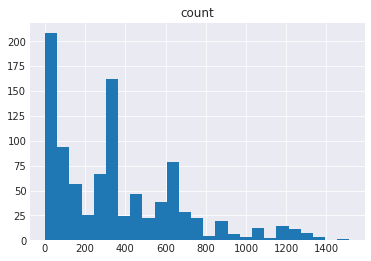

In [31]:
df_paper_region_year_count.hist(column=['count'], bins=25)

**Point chart:**

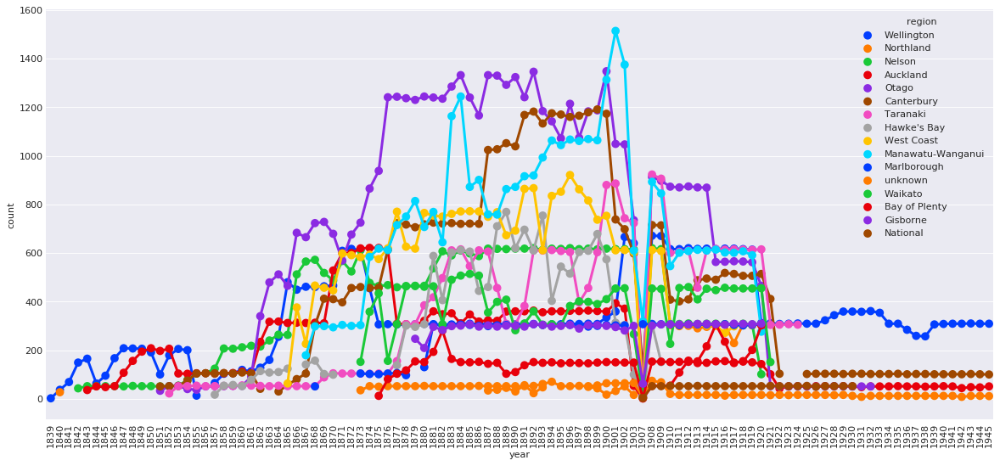

In [32]:
plt.figure(figsize=(18, 8), dpi=80)
plt.xticks(rotation=90)
palette=sns.color_palette('bright', n_colors=16)
sns.pointplot(x='year', y='count',
              hue='region',
              palette=palette,
              data=df_paper_region_year_count)

**Bar chart:**

In [33]:
key =  [('year', 'Year'), ('region', 'Region')]
value = [('count', 'Count')]
table = hv.Table(df_paper_region_year_count, key, value)
bars = table.to.bars(['Year', 'Region'], 'Count', []).sort(['year', 'region'])

bars.opts(
    opts.Bars(color=hv.Cycle('Category20c'), show_legend=True, stacked=True, 
              tools=['hover'], width=1024, height=600, xrotation=90))

:Bars   [year,region]   (count)

**Too many regions make it hard to interpret, below plot only show 4 big cities nowadays (Auckland, Wellington, Canterbury and Otago), we still see the trend:**

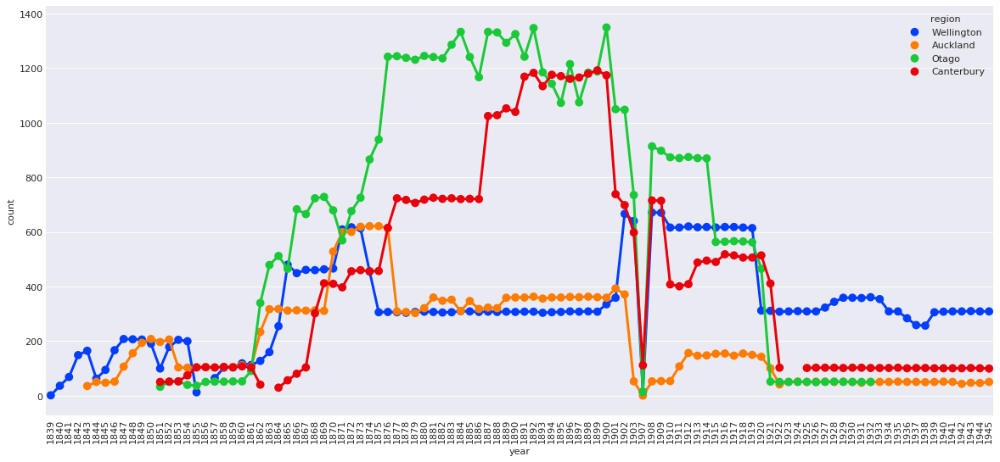

In [34]:
big4 = df_paper_region_year_count.region.isin(['Auckland', 'Wellington', 'Canterbury', 'Otago'])

plt.figure(figsize=(18, 8), dpi=80)
plt.xticks(rotation=90)
palette=sns.color_palette('bright', n_colors=4)
sns.pointplot(x='year', y='count',
              hue='region',
              palette=palette,
              data=df_paper_region_year_count[big4])

**Bar chart:**

In [35]:
key =  [('year', 'Year'), ('region', 'Region')]
value = [('count', 'Count')]
table = hv.Table(df_paper_region_year_count[big4], key, value)
bars = table.to.bars(['Year', 'Region'], 'Count', []).sort(['year', 'region'])

bars.opts(
    opts.Bars(color=hv.Cycle('Category10'), show_legend=True, stacked=True, 
              tools=['hover'], width=1024, height=500, xrotation=90))

:Bars   [year,region]   (count)

## 4 OCR Quality

**The most important factor for topic modeling is the quality of corpus/corpora. Let us check the quality of the text in the dataset to see if there any space to improve.** 

**We select the first article of Lyttelton Times as the experiment object, the image looks like below.**

(It is difficult download data from [paperspat](https://paperspast.natlib.govt.nz) directly due to its elaborate anti-crawling mechanism, we saved files we need from [paperspat](https://paperspast.natlib.govt.nz) in a temp space on github.)

In [6]:
#!wget https://paperspast.natlib.govt.nz/imageserver/newspapers/P29pZD1MVDE4NTEwODA5LjIuMi4xJmNvbG9yPTMyJmV4dD1naWYmYXJlYT0x -O img.gif
!wget --no-check-certificate \
      --content-disposition \
      https://github.com/xandercai/temp/raw/master/P29pZD1MVDE4NTEwODA5LjIuMi4xJmNvbG9yPTMyJmV4dD1naWYmYXJlYT0x.gif \
      -O ./temp/img/img.gif
!convert ./temp/img/img.gif -resize 20% ./temp/img/img.jpg #downsize image

--2019-01-10 15:08:09--  https://github.com/xandercai/temp/raw/master/P29pZD1MVDE4NTEwODA5LjIuMi4xJmNvbG9yPTMyJmV4dD1naWYmYXJlYT0x.gif
Resolving github.com (github.com)... 192.30.255.112, 192.30.255.113
Connecting to github.com (github.com)|192.30.255.112|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/xandercai/temp/master/P29pZD1MVDE4NTEwODA5LjIuMi4xJmNvbG9yPTMyJmV4dD1naWYmYXJlYT0x.gif [following]
--2019-01-10 15:08:10--  https://raw.githubusercontent.com/xandercai/temp/master/P29pZD1MVDE4NTEwODA5LjIuMi4xJmNvbG9yPTMyJmV4dD1naWYmYXJlYT0x.gif
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.164.133
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.164.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 150531 (147K) [image/gif]
Saving to: ‘./temp/img/img.gif’

./temp/img/img.gif  100%[===================>] 147.00K  --.-KB/s    in 0.05s   

2019-

![](./temp/img/img.jpg)

**Now we use [tesseract](https://github.com/tesseract-ocr/tesseract) to do OCR job on the image.**

>Tesseract was developed as a proprietary software by Hewlett Packard Labs. In 2005, it was open sourced by HP in collaboration with the University of Nevada, Las Vegas. Since 2006 it has been actively developed by Google and many open source contributors.

In [37]:
! tesseract ./temp/img/img.gif ./temp/ocr -l eng --oem 1 --psm 3 # save OCR result to output.txt

Tesseract Open Source OCR Engine v4.0.0-115-ge3a3 with Leptonica
Estimating resolution as 366


In [38]:
path = r'./temp/ocr.txt'
with open(path) as f:
    content_ocr = ' '.join([x.strip() for x in f.readlines()])

print(content_ocr)

HE price of Advertisements in this Paper is, threepence a line for the first insertion,  and a penny a line for every subsequent one. All communications to the Editor are re- quested to be addressed to the Office of the LyrrerroN Trams, Section 2, Norwich Quay, Lyttelton, where the Paper may be obtained. Advertisements must be left at this Office before Thursday evening, for insertion of the same week, and must be paid for at the time of  insertion.    NOTICE,  IS EXCELLENCY SIR GEORGE GREY having declared that he will raise no objection to the erection of Canterbury into a separate Province, if the power be left in his hands, and if the settlers in Canterbury desire it, we, the undersigned, Magistrates of the dis- trict, think it right that opportunities should be given of ascertaining the wishes of the people on this important subject. For this purpose Public Meetings will be held at the Mitre Hotel, Lyttelton, on Wednesday, Aug. 13, at Two o'clock, p.M.; and at the Golden Fleece Hot

**Comparing above text to the same article in the dataset shown below, we see both of text are high quality, only slight differences. So the dataset should be the best we can get from the raw images, if the topics quality is not as good as we expected, the dataset reason is out of our considering.**

In [7]:
content_df = df.where(df.id == 1911291).select('content').collect()[0]['content']
print(content_df)

fTIHE price of Advertisements in this Paper ■A- is, threepence a line for the first insertion, and a penny a line for every subsequent one. All communications to the Editor are requested to be addressed to the Office of the Lyttelton Times, Section 2, Norwich Quay, Lyttelton, where the Paper may be obtained. Advertisements must be left at this Office before Thursday evening, for insertion of the same week, and must be paid for at the time of insertion. NOTICE. ~ HIS EXCELLENCY SIR GEORGE GREY having declared that he will raise no objection to the erection of Canterbury into a separate Province, if the power be left in his hands, and if the settlers in Canterbury desire it, we, the undersigned, Magistrates of the district, think it right that opportunities should be given of ascertaining the wishes of the people on this important subject. For this purpose Public Meetings will be held at the Mitre Hotel, Lyttelton, on Wednesday, Aug. 13, at Two o'clock, p.m.; and at the Golden Fleece Hot

**We should quantitatively measure the quality of OCR (error rate), but it takes time and we do not focus on this field. Below are the related works:**
>The first method is used by Simon Tanner, Trevor Muñoz, and Pich Hemy Ros in their evaluation of the OCR quality of the British Library’s 19th Century Online Newspaper Archive. Working with a sample of 1% of the 2 million pages digitized by the British Library, the team calculated the highest rates of OCR accuracy achieved by comparing the generated XML text to a “double re-keyed” ground-truth version. Having a verified ground-truth document enabled the team to provide accurate results about the quality of generated texts (which were generally disappointing, particularly for proper nouns and “significant” or content words). Their approach, however, is labor and time intensive – more than can be taken on by most individual scholars with limited financial resources. (Tanner, Simon, Trevor Muñoz, and Pich Hemy Ros. “Measuring Mass Text Digitization Quality and Usefulness: Lessons Learned From Assessing the OCR Accuracy of the British Library’s 19th Century Online Newspaper Archive.” D-Lib Magazine 15, no. 7/8 (2009): §5. doi: http://dx.doi.org/10.1045/july2009-munoz)    
The second approach, which the Mapping Texts team used for their analysis of the OCR accuracy of the Texas newspapers in Chronicling America, is to compare the generated text to an authoritative wordlist and compute the number of words outside the approved set. This approach is easier to implement, as it takes much less time to compile a list of relevant words than to re-key even a 1% sample of the text. However, the results are less accurate. The method is blind to places where the OCR engine produced a word that, while in the wordlist, does not match the text on the page or where spelling variations that occur on the page are flagged as OCR errors because they are not included in the word list. (Torget, Andrew J., Mihalcea, Rada, Christensen, Jon, and McGhee, Geoff. “Mapping Texts: Combining Text-Mining and Geo-Visualization to Unlock the Research Potential of Historical Newspapers.” Mapping Texts (2011): Accessed March 29, 2017. http://mappingtexts.org/whitepaper/MappingTexts_WhitePaper.pdf.)

## 5 Spelling Correction

**Although the OCR text quality is high, the OCR text are still full of errors. If we could correct at least part of errors, the quality of text will be better, thus the quality of topics will be better. Let's try a spelling correction tool.**

**We use [SymSpell](https://github.com/wolfgarbe/SymSpell) to do the spelling correction job.**

> SymSpell is an algorithm (implementations are available in many programming languages) to be used by developers to add fast approximate string search or spelling correction to their products, rather than being a consumer-ready turnkey product itself.

In [10]:
from symspellpy.symspellpy import SymSpell, Verbosity
!wget https://raw.githubusercontent.com/wolfgarbe/SymSpell/master/SymSpell/frequency_dictionary_en_82_765.txt \
    -O ./temp/frequency_dictionary_en_82_765.txt

--2019-01-10 15:15:37--  https://raw.githubusercontent.com/wolfgarbe/SymSpell/master/SymSpell/frequency_dictionary_en_82_765.txt
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.164.133
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.164.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1331889 (1.3M) [text/plain]
Saving to: ‘./temp/frequency_dictionary_en_82_765.txt’

./temp/frequency_di 100%[===================>]   1.27M  7.78MB/s    in 0.2s    

2019-01-10 15:15:37 (7.78 MB/s) - ‘./temp/frequency_dictionary_en_82_765.txt’ saved [1331889/1331889]



In [12]:
def correct_spelling(input_term, 
                     initial_capacity=83000, 
                     max_edit_distance_dictionary=2, 
                     max_edit_distance_lookup=2, 
                     prefix_length=7):
    ''' correct spelling of input text
    '''
    # create object
    #initial_capacity = 83000
    # maximum edit distance per dictionary precalculation
    #max_edit_distance_dictionary = 2
    #prefix_length = 7
    sym_spell = SymSpell(initial_capacity, max_edit_distance_dictionary,
                         prefix_length)
    # load dictionary
    dictionary_path = os.path.join(os.path.dirname("./temp/"),
                                   "frequency_dictionary_en_82_765.txt")
    term_index = 0  # column of the term in the dictionary text file
    count_index = 1  # column of the term frequency in the dictionary text file
    if not sym_spell.load_dictionary(dictionary_path, term_index, count_index):
        print("Dictionary file not found")
        return -1
    
    # lookup suggestions for multi-word input strings (supports compound
    # splitting & merging)
    # max edit distance per lookup (per single word, not per whole input string)
    #max_edit_distance_lookup = 2
    suggestions = sym_spell.lookup_compound(input_term,
                                            max_edit_distance_lookup)
    # display suggestion term, edit distance, and term frequency
    #for suggestion in suggestions:
    #    print("{}, {}, {}".format(suggestion.term, suggestion.count,
    #                              suggestion.distance))

    return suggestions[0].term # risk: we suppose len(suggestions) == 1

In [13]:
%%time
%%memit
content_cs = correct_spelling(content_df)
print('Spelling Correction Result:\n', content_cs, '\n')

Spelling Correction Result:
 ﻿the price of advertisements in this paper a is threepence a line for ﻿the first insertion and a penny a line for every subsequent one all communications to ﻿the editor are requested to be addressed to ﻿the office of ﻿the let elton times section a norwich quay let elton where ﻿the paper may be obtained advertisements must be left at this office before thursday evening for insertion of ﻿the same week and must be paid for at ﻿the time of insertion notice his excellency sir george grey having declared that he will raise no objection to ﻿the erection of canterbury into a separate province if ﻿the power be left in his hands and if ﻿the settlers in canterbury desire it we ﻿the undersigned magistrates of ﻿the district think it right that opportunities should be given of ascertaining ﻿the wishes of ﻿the people on this important subject for this purpose public meetings will be held at ﻿the mitre hotel let elton on wednesday aug of at two clock pm and at ﻿the golden 

**We compare the original text and corrected text sentence by sentence shown as below, and found that the spelling correction tool corrected few unimportant words but moved out most special noun words such as name and location. The spelling correction job could improve the fluency of sentences but does not contribute to extracting representative words for topic modeling, plus it takes time to compute, those draw backs cannot resolve by tuning parameters. Furthermore, the dictionary it used for spelling check is modern English, which may consider some 100 year ago correct words as incorrect, and currently we did not have the time to find dictionaries for English of that era. Thus, we will not use spelling correction tools in the following steps.**

```
fTIHE price of Advertisements in this Paper ■A- is, threepence a line for the first insertion, and a penny a line for every subsequent one.
the   price of advertisements in this paper  a  is  threepence a line for the first insertion  and a penny a line for every subsequent one

All communications to the Editor are requested to be addressed to the Office of the Lyttelton Times, Section 2, Norwich Quay, Lyttelton, where the Paper may be obtained.
all communications to the editor are requested to be addressed to the office of the let elton times  section a  norwich quay  let elton  where the paper may be obtained

Advertisements must be left at this Office before Thursday evening, for insertion of the same week, and must be paid for at the time of insertion.
advertisements must be left at this office before thursday evening  for insertion of the same week  and must be paid for at the time of insertion

NOTICE. ~ HIS EXCELLENCY SIR GEORGE GREY having declared that he will raise no objection to the erection of Canterbury into a separate Province, 
notice    his excellency sir george grey having declared that he will raise no objection to the erection of canterbury into a separate province

if the power be left in his hands, and if the settlers in Canterbury desire it, we, the undersigned, Magistrates of the district, 
if the power be left in his hands  and if the settlers in canterbury desire it  we  the undersigned  magistrates of the district 

think it right that opportunities should be given of ascertaining the wishes of the people on this important subject. 
think it right that opportunities should be given of ascertaining the wishes of the people on this important subject 

For this purpose Public Meetings will be held at the Mitre Hotel, Lyttelton, on Wednesday, Aug. 13, 
for this purpose public meetings will be held at the mitre hotel  let elton  on wednesday  aug  of 

at Two o'clock, p.m.; and at the Golden Fleece Hotel, Christchurch, on Thursday, Aug. 14, at 12 o'clock, noon.
at two clock    pm    and at the golden fleece hotel  christchurch  on thursday  aug  of  at of   clock  noon

J. R. Godley, R. M. W. G. Beittan, J.P. H. G. Gouland, J.P. H. Phillips, J. P. H. J. Tancrbd, J.P. J. C. "W. Russell, J.P. Wm. Deans, J.P. R. Rhodes, J .P. E. J. Wakisfield, J. P. Lyttelton, July 28,1851.
a  a  go ley  a  a  a  a  be than  a a  a  a  go land  a a  a  phillips  a  a  a  a  tancred  a a  a  a   a  russell  a a  we  deans  a a  a  rhodes  a  a  a  a  wiki field  a a  let elton  july of of of

A PUBLIC DINNER WILL be held at the MITRE HOTEL, Lyttelton, on Wednesday, the 13th inst., to commemorate the holding of the First Public Meeting in the Canterbury Settlement.
a public dinner will be held at the mitre hotel  let elton  on wednesday  the with inst   to commemorate the holding of the first public meeting in the canterbury settlement

The Chair will be taken by J. R. Godley, Esq., at half-past six o'clock precisely.
the chair will be taken by a  a  go ley  esq   at half past six   clock precisely

Tickets, price 12s. 6d. each, may be obtained at the Mitre Hotel, and from the following Gentlemen, who have consented to act as Stewards on the occasion.
tickets  price is   cd  each  may be obtained at the mitre hotel  and from the following gentlemen  who have consented to act as stewards on the occasion

PUBLIC NOTICE. NOTICE IS HEREBY GIVEN, that all parties squatting on any of the town reserves, or unappropriated town sections of Christchurch or Lyttelton, will be required to remove from off the land, on or before the first of September next.
public notice  notice is hereby given  that all parties squatting on any of the town reserves  or unappropriated town sections of christchurch or let elton  will be required to remove from off the land  on or before the first of september next

Parties will be allowed to remove the materials of any buildings which they may have erected on such land, or should ..£hey prefer it, the Association will take them from them at a valuation. By order of the Agent of the Canterbury Association. W. G. Bhittan.
parties will be allowed to remove the materials of any buildings which they may have erected on such land  or should    hey prefer it  the association will take them from them at a valuation  by order of the agent of the canterbury association  a  a  bit tan 

£5 REWARD. TX^HEREAS many of the boundary " * marks and pegs of the Town and Country sections have been wantonly removed or destroyed, 
a  reward  to her as many of the boundary     marks and pegs of the town and country sections have been wantonly removed or destroyed 

This is to give notice that the above reward will be given to any person who will give such information at the Land-Office, Christchurch, 
this is to give notice that the above reward will be given to any person who will give such information at the land office  christchurch 

as will lead to the conviction of parties removing, obliterating, or destroying Trigonometrical Stations, Boundary Pegs of Sections, 
as will lead to the conviction of parties removing  obliterating  or destroying trigon metrical stations  boundary pegs of sections 

or any other marks connected with the surveys. By order of the Agent of the Canterbury Association, W . G . Biuttan. Land-Office, Christchnrch, July 17,1851.
or any other marks connected with the surveys  by order of the agent of the canterbury association  a   a   button   land office  christchurch  july of of of 
```

## 6 Subset

**The most slow process is topic modeling, training the full dataset will take 2 or 3 days, for efficency reason, we have to downsize the bag of words and use a subset to continue our job.**

* Random subset: the easiest way is using `sample()` of dataframe randomly sampling specific percentage of samples to build subset.

* Years based subset: group by a year or years.

* Region based subset: group by a region or regions.

* Publisher based subset: group by a publisher or publishers.

* Ads based subset: filter advertisements or not.

* Combined subset: group by above labels.

**We also could training topic models using full dataset or random subset at first then find targets (based on years/regions/publishers/ads) by processing the document-topics matrix from topic models.**

**In this case, we remove advertisements at first, then sample a random subset with constraint.**

In [13]:
# load data if start the process from here.

path = r'../../data/mining'

data_schema = StructType([
    StructField('id', IntegerType()),
    StructField('publisher', StringType()),
    StructField('region', StringType()),
    StructField('date', DateType()),
    StructField('ads', BooleanType()),
    StructField('title', StringType()),
    StructField('content', StringType())
])
df = (
    spark.read.format("com.databricks.spark.csv")
    .option("header", "false")
    .option("inferSchema", "false")
    .schema(data_schema)
    .load(path)
    .orderBy('id')
)

In [8]:
# constraint for random sampling
PROPORTION = 0.01 # the proportion of sampling
SEED = 1 # set seed to reproduce
subset_path = r'./subset/p{}_s{}_'.format(PROPORTION, SEED) # mark proprostion and seed

In [16]:
# remove advertisements, sampling subset, and select columns.
df_sub = (
    df.filter(df['ads'] == False)
    .sample(False, PROPORTION, SEED)
).toPandas()
print('Shape of dataframe:', df_sub.shape)
df_sub.head()

Shape of dataframe: (116184, 7)


,id,publisher,region,date,ads,title,content
0,1854238,Albertland Gazette,Auckland,1863-08-01,False,PUBLIC MEETING.,PUBLIC MEETING.MISSION TO AUCKLAND. On Wednesd...
1,1854255,Albertland Gazette,Auckland,1863-09-01,False,Monthly Notes for September,Monthly Notes for September1. Tu. English Mail...
2,1854282,Albertland Gazette,Auckland,1863-11-04,False,THE KIAPARA ROAD.,"THE KIAPARA ROAD.Provincial Council, October S..."
3,1854307,Albertland Gazette,Auckland,1864-01-06,False,PORT ALBERT AGRICULTURAL UNION.,"PORT ALBERT AGRICULTURAL UNION.On Dec. 16, by ..."
4,1854847,Ashburton Guardian,Canterbury,1887-01-13,False,THE ELECTION FOR LIVERPOOL.,"THE ELECTION FOR LIVERPOOL.Mr Neville, Liberal..."


**We get a subset of 116,184 samples.**

In [17]:
df_sub_mallet = df_sub[['id', 'title', 'content']] # MALLET take 3 columns.
df_sub_meta = df_sub[['id', 'publisher', 'region', 'date']] # # Meta data for later use
print('\nShape of df_sub_mallet:', df_sub_mallet.shape)
print('\nShape of df_sub_meta:', df_sub_meta.shape)


Shape of df_sub_mallet: (116184, 3)

Shape of df_sub_meta: (116184, 4)


In [18]:
df_sub_mallet.head()

,id,title,content
0,1854238,PUBLIC MEETING.,PUBLIC MEETING.MISSION TO AUCKLAND. On Wednesd...
1,1854255,Monthly Notes for September,Monthly Notes for September1. Tu. English Mail...
2,1854282,THE KIAPARA ROAD.,"THE KIAPARA ROAD.Provincial Council, October S..."
3,1854307,PORT ALBERT AGRICULTURAL UNION.,"PORT ALBERT AGRICULTURAL UNION.On Dec. 16, by ..."
4,1854847,THE ELECTION FOR LIVERPOOL.,"THE ELECTION FOR LIVERPOOL.Mr Neville, Liberal..."


In [19]:
df_sub_meta.head()

,id,publisher,region,date
0,1854238,Albertland Gazette,Auckland,1863-08-01
1,1854255,Albertland Gazette,Auckland,1863-09-01
2,1854282,Albertland Gazette,Auckland,1863-11-04
3,1854307,Albertland Gazette,Auckland,1864-01-06
4,1854847,Ashburton Guardian,Canterbury,1887-01-13


**We save the subset to feed MALLET in next step. Since MALLET can take one instance per file or one file one instance per line, the only choice for us is one file one instance per line, we transform PySpark subset dataframe (**`df_sub`**) to Pandas dataframe after sampling, for two reasons:**
* Pandas dataframe is easy to save dataframe in a sigle file.
* Row number may be different using PySpark dataframe `Select()` method to `split df_sub` to `df_sub_mallet` and `df_sub_meta`.

In [20]:
%%time

df_sub_mallet.to_csv(subset_path+'mallet.csv', sep='\t', header=False, index=False, encoding='utf-8')
df_sub_meta.to_csv(subset_path+'meta.csv', header=False, index=False, encoding='utf-8')

CPU times: user 3.81 s, sys: 80 ms, total: 3.89 s
Wall time: 3.9 s


## 7 Topic Modeling

### 7.1 Command Line

**The first method using MALLET to perform topic modeling is its command line, which is simple, clean and efficient to use. However, it need further work to utilize the result files for analysis and visualization.**

#### 7.1.1 Text Pre-processing

**Since MALLET can perform text pre-processing itself, normally we do not have to do pre-processing separately.**

#### 7.1.2 Training and Inferring

**We use MALLET command line to train and infer topic models.**

In [9]:
%%time
%%bash -s "$subset_path"

# set path
INPUT=$1'mallet.csv'
OUTPUT='./mallet'

# set arg
SEED1=$RANDOM
SEED2=$RANDOM

# configure mallet train-topics parameters:

#--num-top-docs INTEGER
#  When writing topic documents with --output-topic-docs, report this number of top documents.
#  Default is 100
TOPICS=250

#--num-iterations INTEGER
#  The number of iterations of Gibbs sampling.
#  Default is 1000
ITERATION=2000
#ITERATION=500

#--optimize-interval INTEGER
#  The number of iterations between reestimating dirichlet hyperparameters.
#  Default is 0
INTERVAL=20

#--optimize-burn-in INTEGER
#  The number of iterations to run before first estimating dirichlet hyperparameters.
#  Default is 200
BURNIN=50

echo 'SEED1='$SEED1
echo 'SEED2='$SEED2
echo 'TOPICS='$TOPICS
echo 'ITERATION='$ITERATION
echo 'INTERVAL='$INTERVAL
echo 'BURNIN='$BURNIN


# Import corpus
if [ ! -f $OUTPUT/model.mallet ]; then
    mallet import-file --input $INPUT \
                       --output $OUTPUT/model.mallet \
                       --remove-stopwords \
                       --token-regex '\p{L}[\p{L}\p{P}]\p{L}+' \
                       --keep-sequence
                       #--token-regex '\p{L}[\p{L}\p{P}]+\p{L}'
                       #--token-regex '[a-zA-Z]{4,15}'
                       #--keep-sequence-bigrams \
    echo 'NEW'
fi
echo 'Imported.'


# Train model
mallet train-topics --input $OUTPUT/model.mallet \
                    --num-topics $TOPICS \
                    --optimize-interval $INTERVAL \
                    --optimize-burn-in $BURNIN \
                    --random-seed $SEED1 \
                    --num-threads 12 \
                    --num-iterations $ITERATION \
                    --output-state $OUTPUT/$SEED1.$TOPICS.state.gz \
                    --output-model $OUTPUT/$SEED1.$TOPICS.model \
                    --output-doc-topics $OUTPUT/$SEED1.$TOPICS.docTopics.txt \
                    --output-topic-keys $OUTPUT/$SEED1.$TOPICS.topicKeys.txt \
                    --diagnostics-file $OUTPUT/$SEED1.$TOPICS.diagnostics.xml \
                    --inferencer-filename $OUTPUT/$SEED1.$TOPICS.inferencer
echo 'Trained.'



# Infer topics
mallet infer-topics --inferencer $OUTPUT/$SEED1.$TOPICS.inferencer \
                    --input $OUTPUT/model.mallet \
                    --random-seed $SEED2 \
                    --output-doc-topics $OUTPUT/$SEED1.$SEED2.$TOPICS.docTopics.txt 
echo 'Inferred.'

SEED1=13628
SEED2=13674
TOPICS=250
ITERATION=2000
INTERVAL=20
BURNIN=50
NEW
Imported.
Trained.
Inferred.


Mallet LDA: 250 topics, 8 topic bits, 11111111 topic mask
Data loaded.
max tokens: 6481
total tokens: 15500229
<10> LL/token: -12.40609
<20> LL/token: -11.24683
<30> LL/token: -10.85126
<40> LL/token: -10.64903

0	0.02	sellers buyers waihi auckland stock exchange quotations sales queen junction insurance extended shares wellington talisman national market zealand gas share 
1	0.02	witness room house door hotel night bed prisoner told back found deceased o'clock mrs jim heard john time shop graham 
2	0.02	church rev bishop sunday service catholic mission god churches christ services work presbyterian religious christian synod congregation bible evening methodist 
3	0.02	feilding palmerston wanganui north manawatu marton foxton oroua rangitikei wellington otaki kiwitea halcombe district star bulls manchester o-morrow counties pirani 
4	0.02	p.m a.m office post tuesday monday saturday thursday mail letters friday mails close wednesday united chief day notices notice daily 
5	0.02	pvt john

CPU times: user 72 ms, sys: 48 ms, total: 120 ms
Wall time: 38min 38s


#### 7.1.3 Visulize Topic Models using pyLDAvis

**pyLDAvis is a very useful tool for visualize topic models. But it is hard to directly feed pyLDAvis with MALLET topic modeling resualt files, we need transfer and reform the MALLET result to a data type that pyLDAvis can take.**

(fail in this part, memory overflow.)

In [22]:
def extract_params(statefile):
    """Extract the alpha and beta values from the statefile.

    Args:
        statefile (str): Path to statefile produced by MALLET.
    Returns:
        tuple: alpha (list), beta    
    """
    with gzip.open(statefile, 'r') as state:
        params = [x.decode('utf8').strip() for x in state.readlines()[1:3]]
    return (list(params[0].split(":")[1].split(" ")), float(params[1].split(":")[1]))


def state_to_df(statefile):
    """Transform state file into pandas dataframe.
    The MALLET statefile is tab-separated, and the first two rows contain the alpha and beta hypterparamters.
    
    Args:
        statefile (str): Path to statefile produced by MALLET.
    Returns:
        datframe: topic assignment for each token in each document of the model
    """
    return pd.read_csv(statefile,
                       compression='gzip',
                       sep=' ',
                       skiprows=[1,2]
                       )


def find_statefile(path):
    """search statefile in path.
    Args:
        path: path to statefile produced by MALLET.
    Returns:
        string: state file name.
    """
    try:
        statefile = glob.glob(path + '*.state.gz')[0]
    except:
        statefile = ''
        print('find_statefile::file does not exist.')
    return statefile

In [23]:
path = './mallet/'
params = extract_params(find_statefile(path))
alpha = [float(x) for x in params[0][1:]]
beta = params[1]
#print("{}, {}".format(alpha, beta))

In [24]:
df = state_to_df(find_statefile(path))
df['type'] = df.type.astype(str)
#df.head()

In [25]:
# Get document lengths from statefile
docs = df.groupby('#doc')['type'].count().reset_index(name ='doc_length')
#docs.head()

In [26]:
# Get vocab and term frequencies from statefile
vocab = df['type'].value_counts().reset_index()
vocab.columns = ['type', 'term_freq']
vocab = vocab.sort_values(by='type', ascending=True)
#vocab.head()

In [27]:
# Topic-term matrix from state file
def pivot_and_smooth(df, smooth_value, rows_variable, cols_variable, values_variable):
    """
    Turns the pandas dataframe into a data matrix.
    Args:
        df (dataframe): aggregated dataframe 
        smooth_value (float): value to add to the matrix to account for the priors
        rows_variable (str): name of dataframe column to use as the rows in the matrix
        cols_variable (str): name of dataframe column to use as the columns in the matrix
        values_variable(str): name of the dataframe column to use as the values in the matrix
    Returns:
        dataframe: pandas matrix that has been normalized on the rows.
    """
    matrix = df.pivot(index=rows_variable, columns=cols_variable, values=values_variable).fillna(value=0)
    matrix = matrix.values + smooth_value
    
    normed = sklearn.preprocessing.normalize(matrix, norm='l1', axis=1)
    
    return pd.DataFrame(normed)

In [28]:
df_phi = df.groupby(['topic', 'type'])['type'].count().reset_index(name ='token_count')
df_phi = df_phi.sort_values(by='type', ascending=True)
phi = pivot_and_smooth(df_phi, beta, 'topic', 'type', 'token_count')
#df_phi.head()
#phi.head()

In [29]:
df_theta = df.groupby(['#doc', 'topic'])['topic'].count().reset_index(name ='topic_count')
theta = pivot_and_smooth(df_theta, alpha , '#doc', 'topic', 'topic_count')
#df_theta.head()
#theta.head()

In [30]:
data = {'topic_term_dists': phi, 
        'doc_topic_dists': theta,
        'doc_lengths': list(docs['doc_length']),
        'vocab': list(vocab['type']),
        'term_frequency': list(vocab['term_freq'])
       }

In [31]:
vis_data = pyLDAvis.prepare(**data)

TerminatedWorkerError: A worker process managed by the executor was unexpectedly terminated. This could be caused by a segmentation fault while calling the function or by an excessive memory usage causing the Operating System to kill the worker. The exit codes of the workers are {SIGKILL(-9)}

In [ ]:
pyLDAvis.display(vis_data)

**We can not resolve the memory overflow issue while pyLDAvis prepare data, this subset is small and we have at lease 40 GB free memory but still over the memory limit, that is unreasonable, so we use gensim to bypass the issuse.**

### 7.2 Gensim

**The other method using MALLET to perform topic modeling is gensim, which wrap MALLET as one of its LDA models. Since it can filter and reduce bag of words, the memory overflow issue of pyLDAvis could be handled by reducing BoW dimension. Plus gensim has plenty of tools to process texts and models, we will also use gensim in other visualization works.**

#### 7.2.1 Text Pre-processing

**Gensim will not process text by just configuring parameters like MALLET command line scripts, so we need process the dataset step by step. We chose a simple way (the same with the first week's solution) which is slower than PySpark though, to generate data for topic modeling to save debug time.**

In [5]:
# load into pandas dataframe
df = pd.read_table(subset_path+'mallet.csv', 
                   header=None, 
                   index_col=None, 
                   names = ['id', 'title', 'content'],
                   encoding='utf8')

print('Shape of dataframe:', df.shape)
df.sample(3)

Shape of dataframe: (116184, 3)


,id,title,content
38551,12080512,South British Insurance Co.,South British Insurance Co.[By Telegraph.] Auc...
53366,15667508,A LATE SITTING.,A LATE SITTING.Per Press Association. ' WELLIN...
36725,11662518,PROPERTY SALE.,PROPERTY SALE.Messrs G. and A. W. Baxter have ...


In [6]:
# prepare stopwords.
stop_words = stopwords.words('english')

# customize
stop_words.extend(['from'])

#print(stop_words)

In [7]:
def sentences_to_words(sentences):
    for sentence in sentences:
        yield(simple_preprocess(str(sentence), deacc=True))  # deacc=True removes punctuations
        
def remove_stopwords(texts):
    return [[word for word in simple_preprocess(str(doc)) if word not in stop_words and len(word) > 2] for doc in texts]

def make_bigrams(texts):
    return [bigram_mod[doc] for doc in texts]


def lemmatization(texts, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV']):
    """https://spacy.io/api/annotation"""
    # Initialize spacy 'en' model, keeping only tagger component (for efficiency)
    nlp = spacy.load('en', disable=['parser', 'ner'])
    texts_out = []
    for sentence in texts:
        doc = nlp(" ".join(sentence)) 
        texts_out.append([token.lemma_ for token in doc if token.pos_ in allowed_postags])
    return texts_out

In [8]:
# row to list
data = df.content.values.tolist()

# tokenization
data_words = list(sentences_to_words(data))

# Build the bigram models
bigram = gensim.models.Phrases(data_words, min_count=10, threshold=200) # higher threshold fewer phrases.

# Get a sentence clubbed as a bigram
bigram_mod = gensim.models.phrases.Phraser(bigram)

# Remove Stop Words
data_words_nostops = remove_stopwords(data_words)

# Form Bigrams
data_words_bigrams = make_bigrams(data_words_nostops)

# Do lemmatization keeping only noun, adj, vb, adv
data_lemmatized = lemmatization(data_words_bigrams, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV'])

print(data_lemmatized[:1])

# save processed word list for later use
path = r'./gensim_mallet/data'
with open(path, 'wb') as f:
    pickle.dump(data, f)

INFO:gensim.models.phrases:collecting all words and their counts
INFO:gensim.models.phrases:PROGRESS: at sentence #0, processed 0 words and 0 word types
INFO:gensim.models.phrases:PROGRESS: at sentence #10000, processed 4255140 words and 1563766 word types
INFO:gensim.models.phrases:PROGRESS: at sentence #20000, processed 7599579 words and 2481765 word types
INFO:gensim.models.phrases:PROGRESS: at sentence #30000, processed 10385154 words and 3217822 word types
INFO:gensim.models.phrases:PROGRESS: at sentence #40000, processed 12881894 words and 3869001 word types
INFO:gensim.models.phrases:PROGRESS: at sentence #50000, processed 15094146 words and 4482868 word types
INFO:gensim.models.phrases:PROGRESS: at sentence #60000, processed 17080581 words and 5053983 word types
INFO:gensim.models.phrases:PROGRESS: at sentence #70000, processed 19707563 words and 5649985 word types
INFO:gensim.models.phrases:PROGRESS: at sentence #80000, processed 22042813 words and 6149998 word types
INFO:gens

[['public', 'meeting', 'mission', 'auckland', 'public', 'meeting', 'hold', 'usual', 'bell', 'preside', 'call', 'rev', 'edger', 'make', 'report', 'ference', 'visit', 'auckland', 'respect', 'affair', 'settlement', 'edger', 'state', 'take', 'council', 'advice', 'reference', 'balance', 'due', 'estate', 'late', 'brame', 'put', 'claim', 'advise', 'claim', 'perfectly', 'legitimate', 'trust', 'get', 'dividend', 'shortly', 'jalso', 'consult', 'solicitor', 'respect', 'trust', 'deed', 'assure', 'sale', 'town', 'allotment', 'already', 'make', 'quite', 'accord', 'ance', 'therewith', 'sale', 'auction', 'quite', 'unnecessary', 'believe', 'possible', 'obtain', 'moderate', 'loan', 'security', 'town', 'land', 'conclude', 'propose', 'loan', 'obtain', 'security', 'acre', 'town', 'land', 'bell', 'great', 'length', 'objected', 'loan', 'admit', 'port', 'albert', 'would', 'certainly', 'become', 'thriving', 'town', 'ultimately', 'centre', 'kiapara', 'district', 'government', 'determine', 'settle', 'whole', 'la

In [9]:
# Create Dictionary
id2word = corpora.Dictionary(data_lemmatized)
# reduce dimension, 
# ignore words that appear in less than 20 documents
# or more than 10% documents
id2word.filter_extremes(no_below=20, no_above=0.1)
path = r'./gensim_mallet/dictionary'
id2word.save(path)

# Create Corpus
texts = data_lemmatized

# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]
path = r'./gensim_mallet/corpus'
with open(path, 'wb') as f:
    pickle.dump(corpus, f)

# print corpus
# print(corpus[:1]) # unreadable
[[(id2word[id], freq) for id, freq in cp] for cp in corpus[:1]]

INFO:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:gensim.corpora.dictionary:adding document #10000 to Dictionary(152211 unique tokens: ['lieart', 'inbtance', 'ritli', 'dandolo', 'thsir']...)
INFO:gensim.corpora.dictionary:adding document #20000 to Dictionary(233788 unique tokens: ['inbtance', 'ritli', 'dandolo', 'sreditor', 'ameriky']...)
INFO:gensim.corpora.dictionary:adding document #30000 to Dictionary(307643 unique tokens: ['ashorj', 'triangl', 'inbtance', 'usuully', 'ritli']...)
INFO:gensim.corpora.dictionary:adding document #40000 to Dictionary(375522 unique tokens: ['jiliemfcrfch', 'inbtance', 'usuully', 'ritli', 'sreditor']...)
INFO:gensim.corpora.dictionary:adding document #50000 to Dictionary(444989 unique tokens: ['jiliemfcrfch', 'inbtance', 'usuully', 'ritli', 'sreditor']...)
INFO:gensim.corpora.dictionary:adding document #60000 to Dictionary(512645 unique tokens: ['jiliemfcrfch', 'inbtance', 'junwraic', 'usuully', 'ritli']...)
INFO:g

[[('accept', 1),
  ('accord', 1),
  ('account', 3),
  ('acre', 1),
  ('act', 1),
  ('adjourn', 2),
  ('admit', 1),
  ('adopt', 1),
  ('advert', 1),
  ('advice', 1),
  ('advise', 1),
  ('affair', 1),
  ('agree', 1),
  ('agricultural', 1),
  ('albert', 1),
  ('albertland', 5),
  ('allege', 1),
  ('allotment', 1),
  ('already', 3),
  ('ance', 1),
  ('annually', 1),
  ('apply', 1),
  ('appoint', 2),
  ('appointment', 1),
  ('arrival', 1),
  ('assist', 1),
  ('assure', 2),
  ('auction', 1),
  ('authority', 2),
  ('balance', 1),
  ('ballot', 1),
  ('become', 1),
  ('beform', 1),
  ('believe', 1),
  ('bell', 12),
  ('belong', 1),
  ('board', 4),
  ('book', 4),
  ('borrow', 2),
  ('buoy', 2),
  ('call', 2),
  ('campbell', 2),
  ('captain', 2),
  ('cask', 1),
  ('cease', 1),
  ('centre', 1),
  ('certain', 1),
  ('certainly', 1),
  ('chain', 1),
  ('claim', 2),
  ('club', 2),
  ('colleague', 1),
  ('collect', 1),
  ('comer', 1),
  ('commence', 1),
  ('committee', 3),
  ('communicate', 1),
  ('co

#### 7.2.2 Training

In [10]:
# Building LDA Mallet Model
mallet_path = '/usr/local/share/Mallet/bin/mallet' # the path is vary in a different server/computer.

TOPICS=250
ITERATION=2000
INTERVAL=20

ldamallet = gensim.models.wrappers.LdaMallet(mallet_path, 
                                             corpus=corpus, 
                                             num_topics=TOPICS, 
                                             id2word=id2word,
                                             workers=6,
                                             optimize_interval=INTERVAL,
                                             iterations=ITERATION)

path = r'./gensim_mallet/ldamallet'
ldamallet.save(path)

INFO:gensim.models.wrappers.ldamallet:serializing temporary corpus to /tmp/f46320_corpus.txt
INFO:gensim.models.wrappers.ldamallet:converting temporary corpus to MALLET format with /usr/local/share/Mallet/bin/mallet import-file --preserve-case --keep-sequence --remove-stopwords --token-regex "\S+" --input /tmp/f46320_corpus.txt --output /tmp/f46320_corpus.mallet
INFO:gensim.models.wrappers.ldamallet:training MALLET LDA with /usr/local/share/Mallet/bin/mallet train-topics --input /tmp/f46320_corpus.mallet --num-topics 250  --alpha 50 --optimize-interval 20 --num-threads 6 --output-state /tmp/f46320_state.mallet.gz --output-doc-topics /tmp/f46320_doctopics.txt --output-topic-keys /tmp/f46320_topickeys.txt --num-iterations 500 --inferencer-filename /tmp/f46320_inferencer.mallet --doc-topics-threshold 0.0
INFO:gensim.models.wrappers.ldamallet:loading assigned topics from /tmp/f46320_state.mallet.gz
INFO:gensim.utils:saving LdaMallet object under ./gensim_mallet/ldamallet, separately None
I

In [11]:
# Show Topics
pprint(ldamallet.show_topics(num_topics=TOPICS, num_words=10, formatted=False))

[(0,
  [('irish', 0.08269005847953216),
   ('ireland', 0.07524366471734893),
   ('home', 0.027719298245614036),
   ('dublin', 0.02311890838206628),
   ('rule', 0.02304093567251462),
   ('parnell', 0.017777777777777778),
   ('land', 0.013099415204678362),
   ('ulster', 0.01263157894736842),
   ('irishman', 0.010994152046783626),
   ('dillon', 0.010214424951267056)]),
 (1,
  [('minister', 0.08001805535608035),
   ('hon', 0.049980508422413264),
   ('sir', 0.04193766798662262),
   ('massey', 0.02669320256878475),
   ('prime_minister', 0.023246270953445905),
   ('premier', 0.02222039844888077),
   ('joseph_ward', 0.01793225137979852),
   ('reply', 0.016598617123863846),
   ('allen', 0.013356860009438027),
   ('parliament', 0.012310470054781591)]),
 (2,
  [('hall', 0.03003611938406945),
   ('club', 0.016581120757028493),
   ('lady', 0.013328263946095516),
   ('afternoon', 0.011796886551338107),
   ('committee', 0.011099845806138183),
   ('dance', 0.010962549901780623),
   ('programme', 0.010

#### 7.2.3 Visulize Topic Models using pyLDAvis

**The same with command line mode, pyLDAvis cannot read MALLET model directly, but with gensim, the transform works are easier since gensim provides a function transforming MALLET to LDA model. However, this function has a [bug](https://github.com/RaRe-Technologies/gensim/issues/2069) in the latest release version of gensim, we need manully modify the gensim source code with caution to fix the bug.**

In [12]:
# load models if start from here.
path = r'./gensim_mallet/dictionary'
id2word = corpora.Dictionary.load(path)

path = r'./gensim_mallet/corpus'
with open(path, 'rb') as f:
    corpus = pickle.load(f)

path = r'./gensim_mallet/ldamallet'
ldamallet = gensim.models.wrappers.LdaMallet.load(path)

INFO:gensim.utils:loading Dictionary object from ./gensim_mallet/dictionary
INFO:gensim.utils:loaded ./gensim_mallet/dictionary
INFO:gensim.utils:loading LdaMallet object from ./gensim_mallet/ldamallet
INFO:gensim.utils:loading id2word recursively from ./gensim_mallet/ldamallet.id2word.* with mmap=None
INFO:gensim.utils:loaded ./gensim_mallet/ldamallet


In [13]:
# transform models from MALLET to normal LDA model.
lda_model = gensim.models.wrappers.ldamallet.malletmodel2ldamodel(ldamallet)
#pprint(lda_model.show_topics(num_topics=TOPICS, num_words=10, formatted=False))

# save model
path = r'./gensim_mallet/ldamodel'
lda_model.save(path)

INFO:gensim.models.ldamodel:using serial LDA version on this node
INFO:gensim.utils:saving LdaState object under ./gensim_mallet/ldamodel.state, separately None
INFO:gensim.utils:saved ./gensim_mallet/ldamodel.state
INFO:gensim.utils:saving LdaModel object under ./gensim_mallet/ldamodel, separately ['expElogbeta', 'sstats']
INFO:gensim.utils:storing np array 'expElogbeta' to ./gensim_mallet/ldamodel.expElogbeta.npy
INFO:gensim.utils:not storing attribute state
INFO:gensim.utils:not storing attribute id2word
INFO:gensim.utils:not storing attribute dispatcher
INFO:gensim.utils:saved ./gensim_mallet/ldamodel


In [14]:
vis_data = pyLDAvis.gensim.prepare(lda_model, corpus, id2word, mds='tsne')
pyLDAvis.display(vis_data)

/usr/local/lib/python3.5/dist-packages/pyLDAvis/_prepare.py:223: RuntimeWarning: divide by zero encountered in log
  kernel = (topic_given_term * np.log((topic_given_term.T / topic_proportion).T))
/usr/local/lib/python3.5/dist-packages/pyLDAvis/_prepare.py:240: RuntimeWarning: divide by zero encountered in log
  log_lift = np.log(topic_term_dists / term_proportion)
/usr/local/lib/python3.5/dist-packages/pyLDAvis/_prepare.py:241: RuntimeWarning: divide by zero encountered in log
  log_ttd = np.log(topic_term_dists)
/usr/local/lib/python3.5/dist-packages/pyLDAvis/_prepare.py:257: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  return pd.concat([default_term_info] + list(topic_dfs))


#### 7.2.4 Visulize Topic Models using WordCloud

**With gensim topic models, we can easyly get topics with weights and plot the word cloud with weight of topic keys. Below plots show top 50 key words in first 4 topics in the default topic list of gensim LDA model.**

INFO:gensim.utils:loading LdaModel object from ./gensim_mallet/ldamodel
INFO:gensim.utils:loading expElogbeta from ./gensim_mallet/ldamodel.expElogbeta.npy with mmap=None
INFO:gensim.utils:setting ignored attribute state to None
INFO:gensim.utils:setting ignored attribute id2word to None
INFO:gensim.utils:setting ignored attribute dispatcher to None
INFO:gensim.utils:loaded ./gensim_mallet/ldamodel
INFO:gensim.utils:loading LdaState object from ./gensim_mallet/ldamodel.state
INFO:gensim.utils:loaded ./gensim_mallet/ldamodel.state


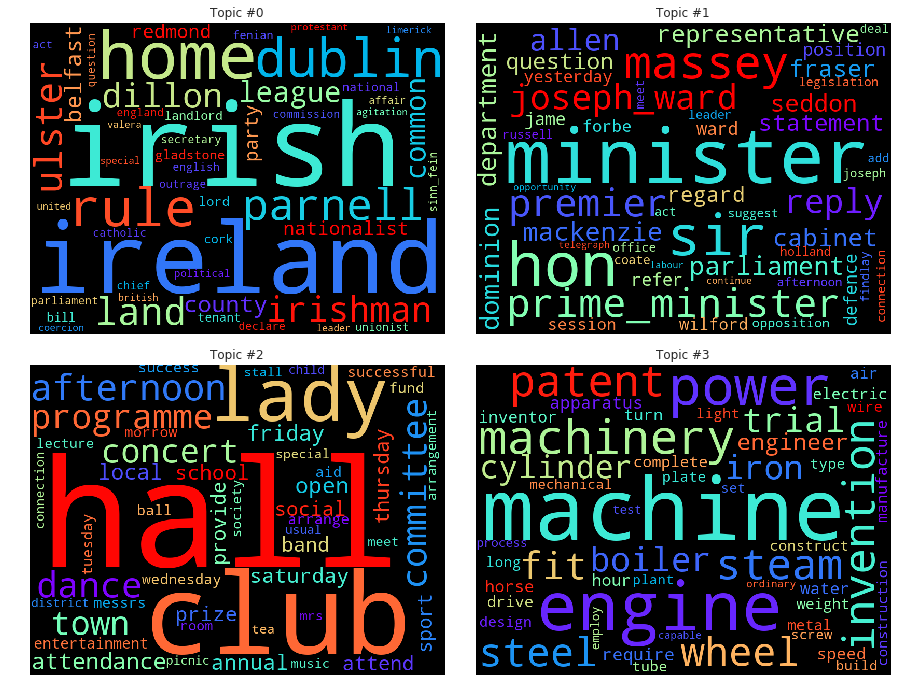

In [13]:
# load model if start here
#path = r'./gensim_mallet/ldamodel'
#lda_model = gensim.models.LdaModel.load(path)

show_num_topics = 4
show_num_word = 50

fig = plt.figure(figsize=(16, 12))
fig.subplots_adjust(hspace=0.1, wspace=0)

for i in range(1, show_num_topics+1):
    ax = fig.add_subplot(2, 2, i)
    ax.imshow(WordCloud(width=800, height=600, colormap="rainbow")
              .fit_words(dict(lda_model.show_topic(i-1, show_num_word-1))))
    ax.axis("off")
    plt.title("Topic #" + str(i-1))

## 8 Topics Over Time By Random Subset

**Althogh pyLDAvis give us a big picture of topics, we still need to further manipulate the data in order to track change over time across the different years. We use above trained topic model and random subset to analyze and visualize.**

**In this part we use gensim topic models for its flexibility, and we only use dominant topics of each article (sample) to visualize.**

### 8.1 Prepare Data

**Before we can analysis topics over time, we need infer topics of each article (sample) in the subset, and add the dominant topics and its weight in dataframe to analyze it.** 

In [16]:
# load data and model if start from here.
df_sub_meta = pd.read_csv(subset_path+'meta.csv', 
                          header=None, 
                          index_col=None, 
                          names = ['id', 'publisher', 'region', 'date'],
                          encoding='utf8')

#path = r'./gensim_mallet/data'
#with open(path, 'rb') as f:
#    data = pickle.load(f)

path = r'./gensim_mallet/dictionary'
id2word = corpora.Dictionary.load(path)

path = r'./gensim_mallet/corpus'
with open(path, 'rb') as f:
    corpus = pickle.load(f)

path = r'./gensim_mallet/ldamodel'
lda_model = gensim.models.LdaModel.load(path)
# check model loaded correctly
#pprint(lda_model.show_topics(num_topics=TOPICS, num_words=10, formatted=False))

INFO:gensim.utils:loading Dictionary object from ./gensim_mallet/dictionary
INFO:gensim.utils:loaded ./gensim_mallet/dictionary
INFO:gensim.utils:loading LdaModel object from ./gensim_mallet/ldamodel
INFO:gensim.utils:loading expElogbeta from ./gensim_mallet/ldamodel.expElogbeta.npy with mmap=None
INFO:gensim.utils:setting ignored attribute state to None
INFO:gensim.utils:setting ignored attribute id2word to None
INFO:gensim.utils:setting ignored attribute dispatcher to None
INFO:gensim.utils:loaded ./gensim_mallet/ldamodel
INFO:gensim.utils:loading LdaState object from ./gensim_mallet/ldamodel.state
INFO:gensim.utils:loaded ./gensim_mallet/ldamodel.state


In [17]:
%%time

def format_topics_doc(ldamodel=None, corpus=corpus):
    """
    https://www.machinelearningplus.com/nlp/topic-modeling-visualization-how-to-present-results-lda-models/
    """
    # Init output
    doc_topics_df = pd.DataFrame()

    # Get main topic in each document
    print('format_topics_doc::total {} docs.'.format(len(ldamodel[corpus])))
    for i, row_list in enumerate(ldamodel[corpus]): # very slow!!!!!!
        if (i%5000 == 0): 
            print('format_topics_doc::processing #{} doc...'.format(i))
            
        row = row_list[0] if ldamodel.per_word_topics else row_list            
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        
        # Get the Dominant topic, Perc Contribution and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
            if j == 0:  # => dominant topic
                wp = ldamodel.show_topic(topic_num)
                topic_keywords = ", ".join([word for word, prop in wp])
                doc_topics_df = doc_topics_df.append(
                    pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), 
                    ignore_index=True)
            else:
                break

    return(doc_topics_df)


# Format
df_dominant_topic = format_topics_doc(lda_model, corpus).reset_index()
df_dominant_topic.columns = ['index', 'topic', 'weight', 'keywords']

format_topics_doc::total 116184 docs.
format_topics_doc::processing #0 doc...
format_topics_doc::processing #5000 doc...
format_topics_doc::processing #10000 doc...
format_topics_doc::processing #15000 doc...
format_topics_doc::processing #20000 doc...
format_topics_doc::processing #25000 doc...
format_topics_doc::processing #30000 doc...
format_topics_doc::processing #35000 doc...
format_topics_doc::processing #40000 doc...
format_topics_doc::processing #45000 doc...
format_topics_doc::processing #50000 doc...
format_topics_doc::processing #55000 doc...
format_topics_doc::processing #60000 doc...
format_topics_doc::processing #65000 doc...
format_topics_doc::processing #70000 doc...
format_topics_doc::processing #75000 doc...
format_topics_doc::processing #80000 doc...
format_topics_doc::processing #85000 doc...
format_topics_doc::processing #90000 doc...
format_topics_doc::processing #95000 doc...
format_topics_doc::processing #100000 doc...
format_topics_doc::processing #105000 doc.

In [25]:
df_dominant_topic.head()

,index,topic,weight,keywords
0,0,101.0,0.1061,"committee, club, secretary, messrs, president,..."
1,1,26.0,0.3171,"moon, quarter, morrow, water, full, sun, set, ..."
2,2,87.0,0.2327,"province, provincial, council, superintendent,..."
3,3,101.0,0.2256,"committee, club, secretary, messrs, president,..."
4,4,91.0,0.3061,"election, vote, candidate, elector, seat, poll..."


In [26]:
df_sub_meta.head()

,id,publisher,region,date
0,1854238,Albertland Gazette,Auckland,1863-08-01
1,1854255,Albertland Gazette,Auckland,1863-09-01
2,1854282,Albertland Gazette,Auckland,1863-11-04
3,1854307,Albertland Gazette,Auckland,1864-01-06
4,1854847,Ashburton Guardian,Canterbury,1887-01-13


**Above dataframe** `df_dominant_topic` **and** `df_sub_meta` **dataframe have the same order/index, so use index to merge them into one dataframe and convert date to year.**

In [29]:
df_topic_meta = df_dominant_topic.merge(df_sub_meta, how='left', left_index=True, right_index=True)
df_topic_meta['year'] = pd.to_datetime(df_topic_meta['date']).dt.year.astype(str)
df_topic_meta['topic'] = df_topic_meta['topic'].astype(int)

print('Check Null:', df_topic_meta.isnull().any().any())

path = r'./gensim_mallet/topic_meta.csv'
df_topic_meta.to_csv(path, header=False, index=False, encoding='utf-8')

print('shape of dataframe:', df_topic_meta.shape)
df_topic_meta.head()

Check Null: False
shape of dataframe: (116184, 9)


,index,topic,weight,keywords,id,publisher,region,date,year
0,0,101,0.1061,"committee, club, secretary, messrs, president,...",1854238,Albertland Gazette,Auckland,1863-08-01,1863
1,1,26,0.3171,"moon, quarter, morrow, water, full, sun, set, ...",1854255,Albertland Gazette,Auckland,1863-09-01,1863
2,2,87,0.2327,"province, provincial, council, superintendent,...",1854282,Albertland Gazette,Auckland,1863-11-04,1863
3,3,101,0.2256,"committee, club, secretary, messrs, president,...",1854307,Albertland Gazette,Auckland,1864-01-06,1864
4,4,91,0.3061,"election, vote, candidate, elector, seat, poll...",1854847,Ashburton Guardian,Canterbury,1887-01-13,1887


### 8.2 Topics Over Year

In [14]:
# load data if start from here.
path = r'./gensim_mallet/topic_meta.csv'
df_topic_meta = pd.read_csv(path, 
                            header=None, 
                            index_col=None, 
                            names = ['index', 'topic', 'weight', 'keywords', 'id', 'publisher', 'region', 'date', 'year'],
                            encoding='utf8')

#### 8.2.1 First 10 Topics

**LDA model output the topics keywords list, here we plot first 10 topics in the list. We use scatter plot and bar chart to see the distribution of topics. We can find that the distribution is vary follow the year.**

In [79]:
# show first 10 topics, keywords and count number
df_topic_meta.groupby(['topic', 'keywords']).size().reset_index(name='count').sort_values('topic', ascending=True).head(10)

,topic,keywords,count
0,0,"irish, ireland, home, dublin, rule, parnell, l...",476
1,1,"minister, hon, sir, massey, prime_minister, pr...",449
2,2,"hall, club, lady, afternoon, committee, dance,...",1036
3,3,"machine, engine, power, machinery, patent, inv...",387
4,4,"otago, dunedin, canterbury, southland, oamaru,...",294
5,5,"home, service, provide, organisation, effort, ...",201
6,6,"increase, condition, continue, position, effec...",284
7,7,"water, add, put, hot, boil, sugar, half, egg, ...",337
8,8,"light, love, eye, long, bright, sun, beautiful...",487
9,9,"union, farmer, labour, branch, federation, cou...",455


In [65]:
# get and print dataframe to visualize
df_topics_10 = df_topic_meta[df_topic_meta['topic'].isin(range(10))].sort_values(by='topic', ascending=True)
print('Shape of dataframe:', df_topics_10.shape)
df_topics_10.sample(5)

Shape of dataframe: (4406, 9)


,index,topic,weight,keywords,id,publisher,region,date,year
45970,45970,0,0.2517,"irish, ireland, home, dublin, rule, parnell, l...",13771373,Wanganui Herald,Manawatu-Wanganui,1902-08-15,1902
71977,71977,3,0.3301,"machine, engine, power, machinery, patent, inv...",18817337,Evening Post,Wellington,1924-04-26,1924
18879,18879,8,0.4640,"light, love, eye, long, bright, sun, beautiful...",6809633,Tuapeka Times,Otago,1892-06-25,1892
106447,106447,2,0.3425,"hall, club, lady, afternoon, committee, dance,...",28401537,Auckland Star,Auckland,1896-01-10,1896
111897,111897,7,0.7645,"water, add, put, hot, boil, sugar, half, egg, ...",29610625,Wairarapa Daily Times,Wellington,1914-11-24,1914


**Scatter Plot**

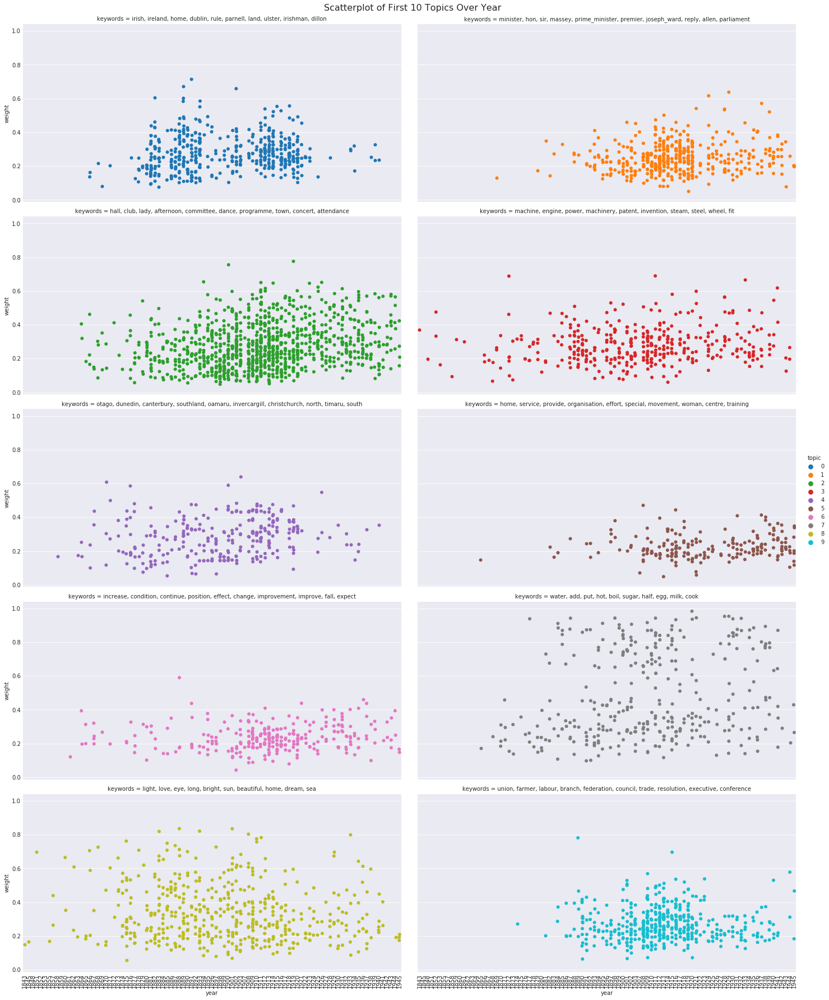

In [67]:
g = sns.catplot(x="year", y='weight', hue="topic", col='keywords', col_wrap=2, 
                kind='strip', height=5, aspect=2, jitter=1, dodge=False, s=6, legend=False,
                data=df_topics_10)
g.fig.subplots_adjust(top=0.96)
g.fig.suptitle("Scatterplot of First 10 Topics Over Year", fontsize=16)
g.set_xticklabels(rotation=90)

**Bar Chart**

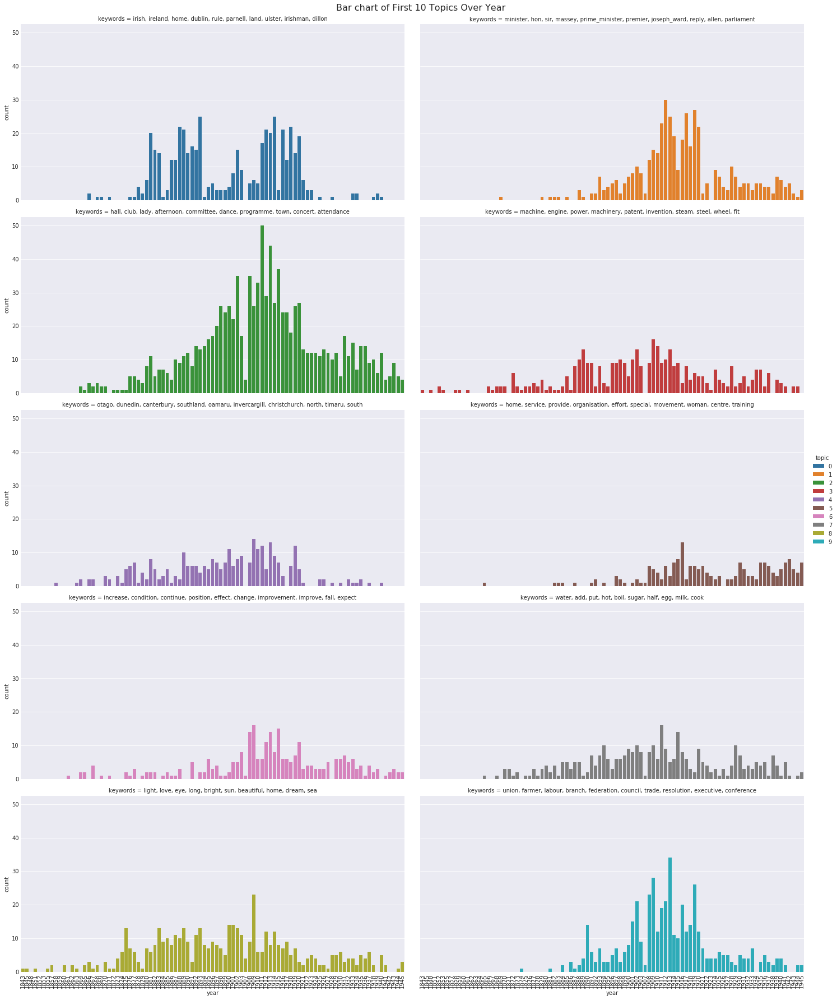

In [83]:
g = sns.catplot(x="year", hue="topic", col='keywords', col_wrap=2, 
                kind='count', height=5, aspect=2, dodge=False, legend=False, 
                data=df_topics_10)
g.fig.subplots_adjust(top=0.96)
g.fig.suptitle("Bar chart of First 10 Topics Over Year", fontsize=16)
g.set_xticklabels(rotation=90)

#### 8.2.2 By Specific Topics

**Here we select 4 typical topics which may vary with different era to visualize.**

* #11 strike
* #21 car
* #60 gold
* #62 war

In [68]:
topic_4 = [11, 21, 60, 62]
df_topics_4 = df_topic_meta[df_topic_meta['topic'].isin(topic_4)].sort_values(by='topic', ascending=True)
print('Shape of dataframe:', df_topics_4.shape)
df_topics_4.sample(5)

Shape of dataframe: (2496, 9)


,index,topic,weight,keywords,id,publisher,region,date,year
84729,84729,11,0.3662,"strike, union, dispute, arbitration, labour, e...",24272451,Hawera & Normanby Star,Taranaki,1912-06-28,1912
90575,90575,11,0.2905,"strike, union, dispute, arbitration, labour, e...",25379795,Marlborough Express,Marlborough,1913-09-18,1913
50006,50006,11,0.1892,"strike, union, dispute, arbitration, labour, e...",15006777,Poverty Bay Herald,Gisborne,1911-10-09,1911
97799,97799,62,0.1616,"war, soldier, army, british, fight, military, ...",26625046,Colonist,Nelson,1915-12-01,1915
105098,105098,11,0.1681,"strike, union, dispute, arbitration, labour, e...",28164262,Auckland Star,Auckland,1889-12-10,1889


**Scatter Plot**

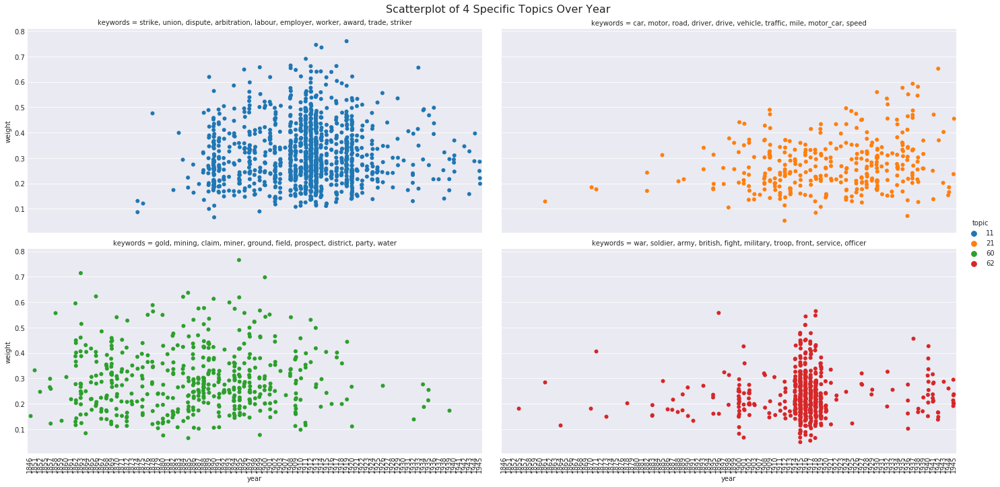

In [70]:
g = sns.catplot(x="year", y='weight', hue="topic", col='keywords', col_wrap=2, 
                kind='strip', height=5, aspect=2, jitter=1, dodge=False, s=6, legend=False,
                data=df_topics_4)
g.fig.subplots_adjust(top=0.93)
g.fig.suptitle("Scatterplot of 4 Specific Topics Over Year", fontsize=16)
g.set_xticklabels(rotation=90)

**Bar Chart**

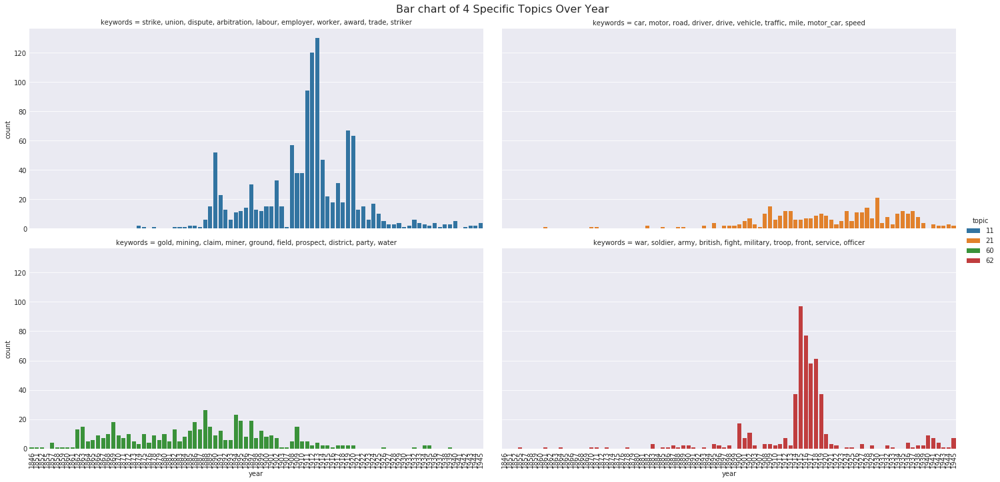

In [71]:
g = sns.catplot(x="year", hue="topic", col='keywords', col_wrap=2, 
                kind='count', height=5, aspect=2, dodge=False, legend=False,
                data=df_topics_4)
g.fig.subplots_adjust(top=0.93)
g.fig.suptitle("Bar chart of 4 Specific Topics Over Year", fontsize=16)
g.set_xticklabels(rotation=90)

**In this way, we see "strike" and "war" topics were upsurge in short period, which represents outburst emergencies, while "gold" and "car" topics increased and decreased constantly and slowly, which represents features of an era.**

#### 8.2.3 By Region

**There are two methods to get topics over time by region:**
1. In dataset level, collect all samples by region and infer topics by a trained full dataset topic model. This way can give us the most accuracy topics of a region, but it takes time.
1. In dataframe level, utilize existed dataframe of topics (`df_topics_meta`), classify topics by region and get the topics of a region. This way is very fast but the accuracy depend on the size and distribution of subset.

**Here we use the second method to get topics by region, we will try the first method (dataset level) for specific period years in next step: By Range of Year.**

**There are too many topics and regions, so we focus on the first 4 topics and regions of bigest 4 cities.**

In [61]:
big4 = ['Auckland', 'Wellington', 'Canterbury', 'Otago']

df_topics_4 = (df_topic_meta[(df_topic_meta['topic'].isin(range(4))) 
                            & (df_topic_meta['region'].isin(big4))]
               .sort_values(by=['region', 'topic'], ascending=True))

topic4 = df_topics_4.keywords.unique()

print('Shape of dataframe:', df_topics_4.shape)
df_topics_4.sample(5)

Shape of dataframe: (1205, 9)


,index,topic,weight,keywords,id,publisher,region,date,year
64687,64687,0,0.4968,"irish, ireland, home, dublin, rule, parnell, l...",17665421,Evening Post,Wellington,1914-02-11,1914
115237,115237,0,0.4862,"irish, ireland, home, dublin, rule, parnell, l...",33856281,Tuapeka Times,Otago,1912-10-01,1912
104417,104417,0,0.4102,"irish, ireland, home, dublin, rule, parnell, l...",28041696,Auckland Star,Auckland,1885-12-29,1885
52552,52552,1,0.2178,"minister, hon, sir, massey, prime_minister, pr...",15522160,Star,Canterbury,1903-03-03,1903
70617,70617,1,0.2721,"minister, hon, sir, massey, prime_minister, pr...",18596618,Evening Post,Wellington,1917-10-16,1917


**Scatter Plot**

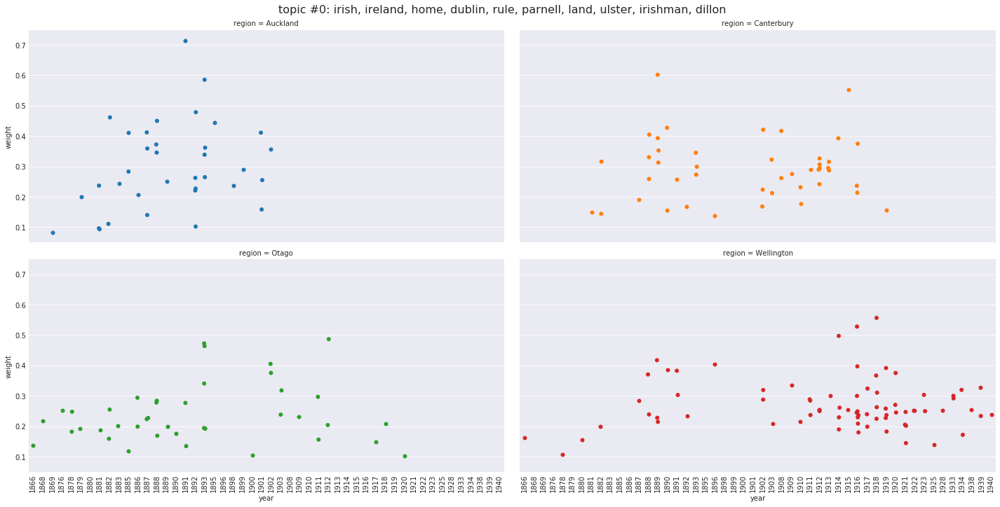

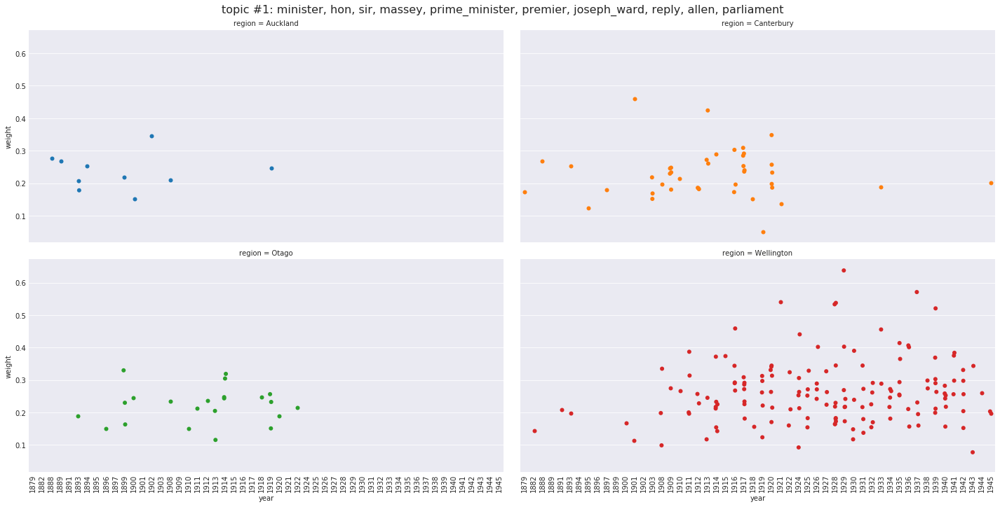

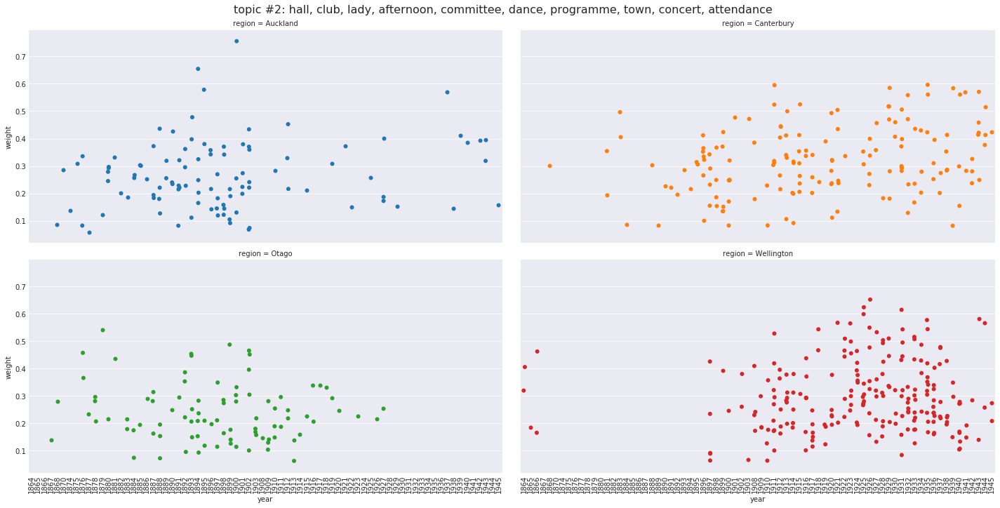

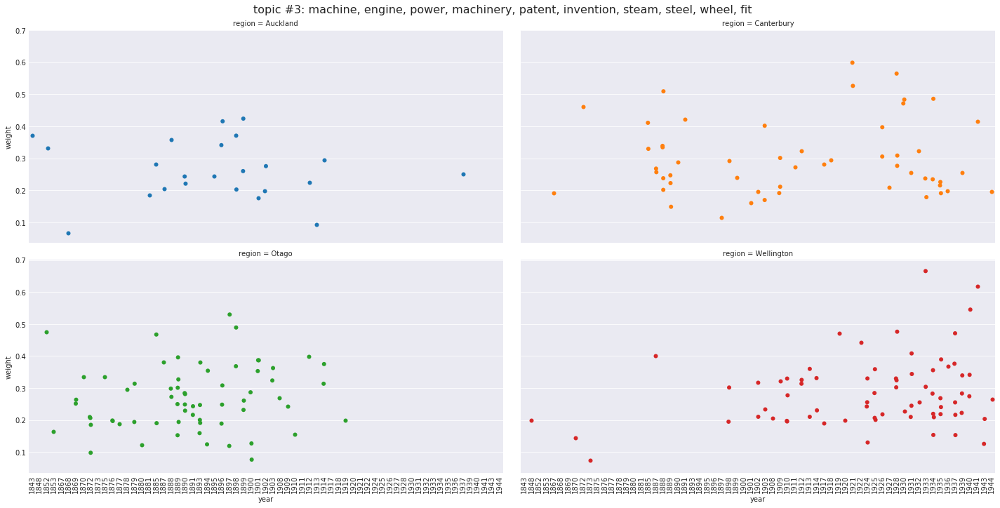

In [64]:
for i in range(4):
    g = sns.catplot(x='year', y='weight', hue='region', col='region', col_wrap=2, 
                    kind='strip', height=5, aspect=2, jitter=1, dodge=False, s=6,
                    data=df_topics_4[df_topics_4['topic'] == i])
    g.fig.subplots_adjust(top=0.93)
    g.fig.suptitle('topic #{}: {}'.format(i, topic4[i]), fontsize=16)
    g.set_xticklabels(rotation=90)

**Bar chart**

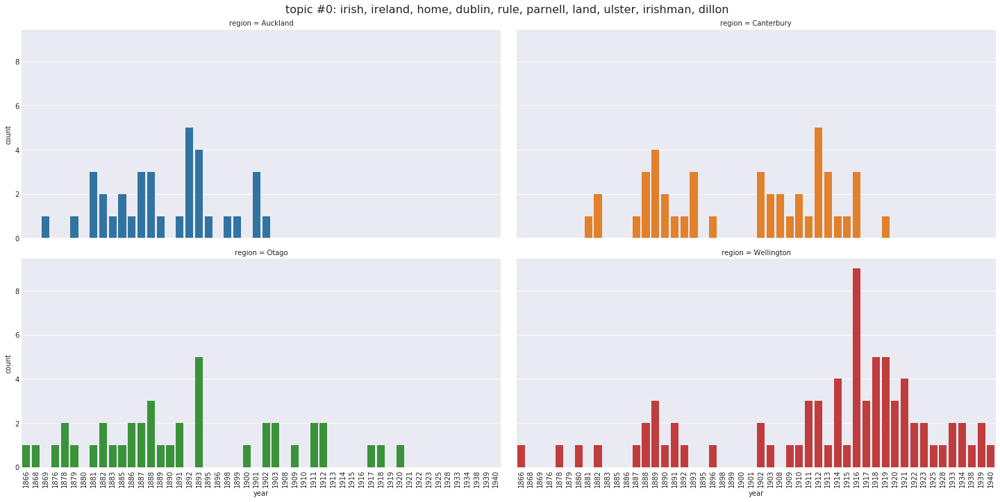

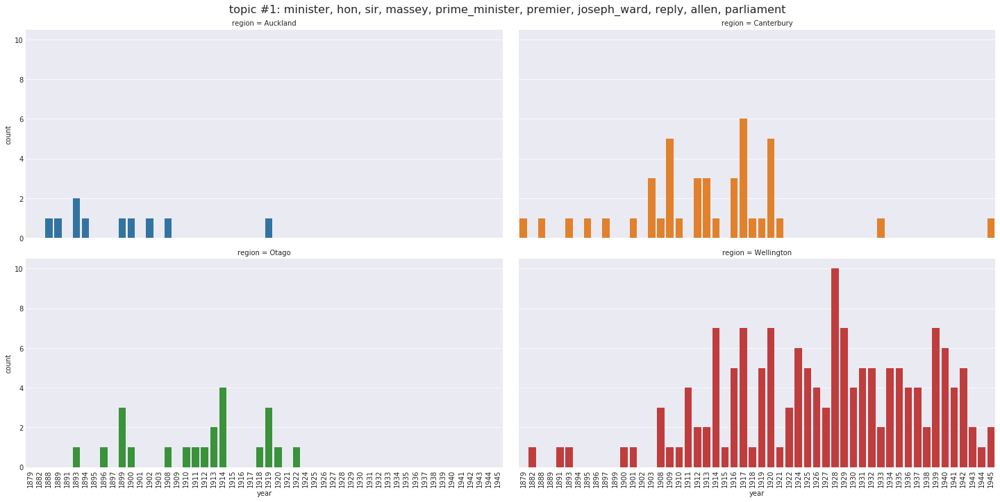

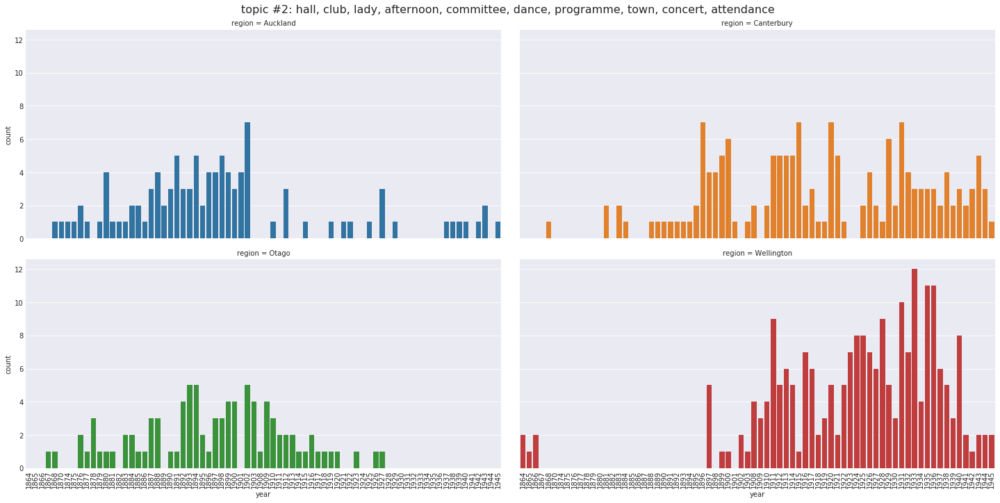

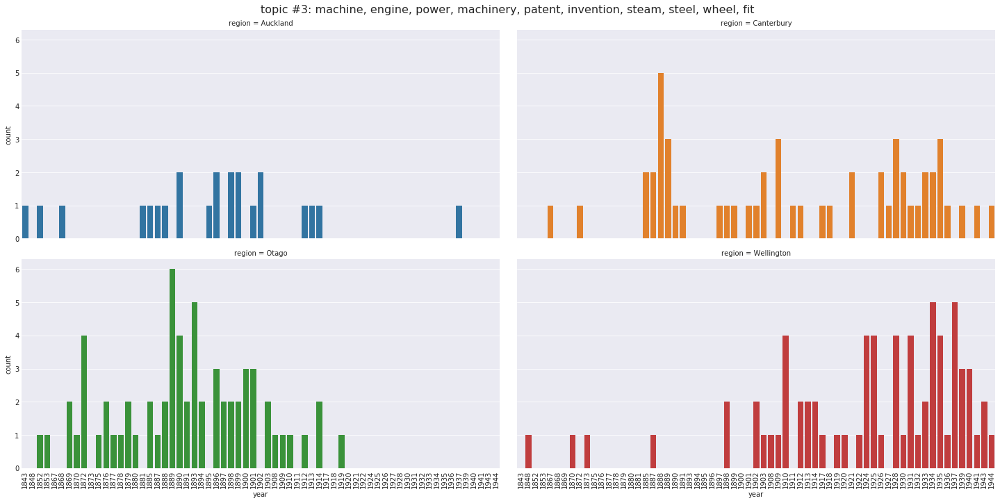

In [57]:
for i in range(4):
    g = sns.catplot(x='year', hue='region', col='region', col_wrap=2, 
                    kind='count', height=5, aspect=2, dodge=False, 
                    data=df_topics_4[df_topics_4['topic'] == i])
    g.fig.subplots_adjust(top=0.93)
    g.fig.suptitle('topic #{}: {}'.format(i, topic4[i]), fontsize=16)
    g.set_xticklabels(rotation=90)

**From above topics distribution, we see the differences in regions, e.g. Wellington papers have more political and entertainment stories, while Otago more industrial stories.**

#### 8.2.4 By Publisher

**We alse could visualize topics by publisher, here we analyze first 4 topics in 4 most prolific publishers, which is:**

In [73]:
# show 4 most prolific publishers
df_topic_meta.groupby(['publisher', 'region']).size().reset_index(name='count').sort_values('count', ascending=False).head(4)

,publisher,region,count
12,Evening Post,Wellington,22741
62,Wanganui Chronicle,Manawatu-Wanganui,5550
16,Hawera & Normanby Star,Taranaki,5387
3,Auckland Star,Auckland,5372


In [77]:
# show first 4 topics
df_topic_meta.groupby(['topic', 'keywords']).size().reset_index(name='count').sort_values('topic', ascending=True).head(4)

,topic,keywords,count
0,0,"irish, ireland, home, dublin, rule, parnell, l...",476
1,1,"minister, hon, sir, massey, prime_minister, pr...",449
2,2,"hall, club, lady, afternoon, committee, dance,...",1036
3,3,"machine, engine, power, machinery, patent, inv...",387


In [84]:
# get and show the dataframe to visualize
publisher4 = (df_topic_meta.groupby(['publisher', 'region'])
              .size().reset_index(name='count')
              .sort_values('count', ascending=False)
              .publisher.unique()[:4])

df_topics_4 = (df_topic_meta[(df_topic_meta['topic'].isin(range(4))) 
                            & (df_topic_meta['publisher'].isin(publisher4))]
               .sort_values(by=['region', 'topic'], ascending=True))

print('Shape of dataframe:', df_topics_4.shape)
df_topics_4.sample(5)

Shape of dataframe: (814, 9)


,index,topic,weight,keywords,id,publisher,region,date,year
71439,71439,3,0.4709,"machine, engine, power, machinery, patent, inv...",18717703,Evening Post,Wellington,1919-01-21,1919
85022,85022,2,0.2002,"hall, club, lady, afternoon, committee, dance,...",24315187,Hawera & Normanby Star,Taranaki,1913-02-01,1913
95867,95867,1,0.3030,"minister, hon, sir, massey, prime_minister, pr...",26338721,Wanganui Chronicle,Manawatu-Wanganui,1918-03-30,1918
87083,87083,0,0.2560,"irish, ireland, home, dublin, rule, parnell, l...",24650899,Hawera & Normanby Star,Taranaki,1922-03-02,1922
87637,87637,2,0.1215,"hall, club, lady, afternoon, committee, dance,...",24736679,Hawera & Normanby Star,Taranaki,1924-07-17,1924


**Scatter Plot**

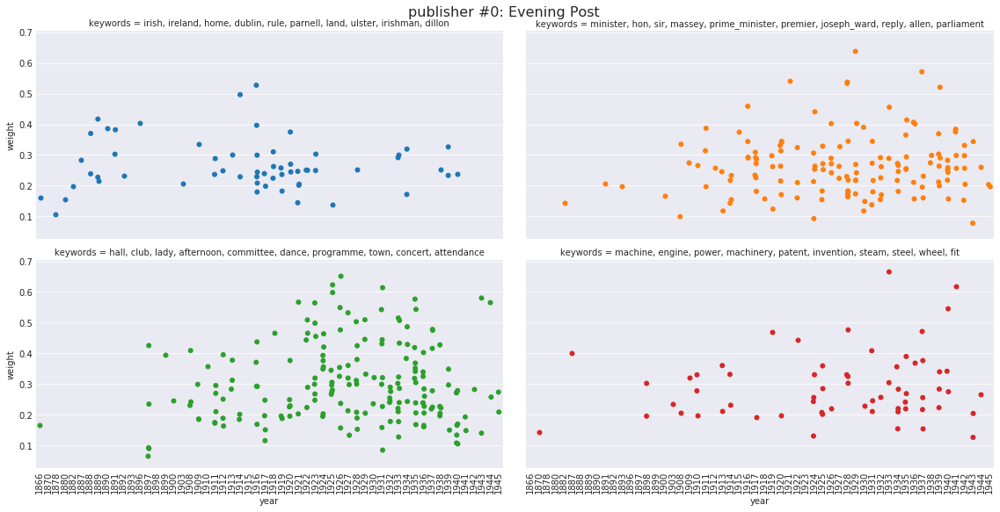

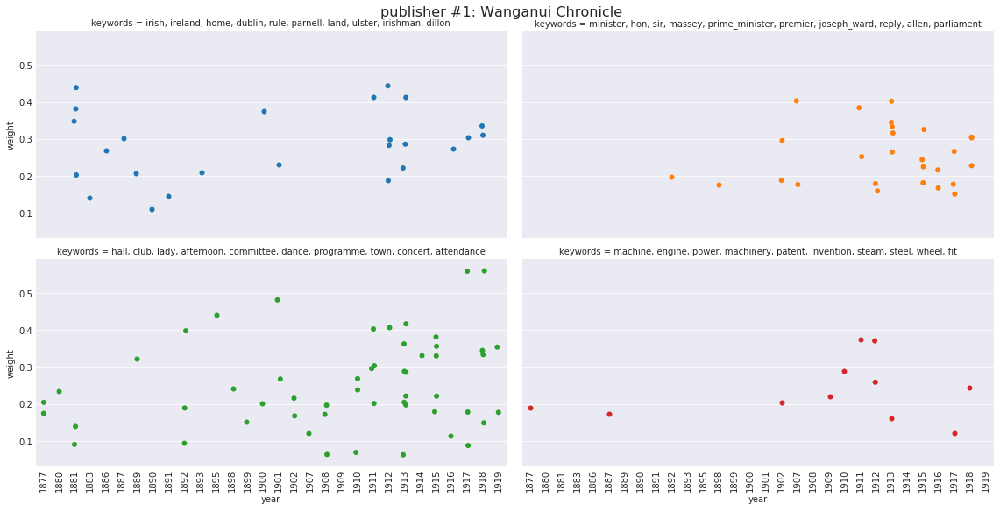

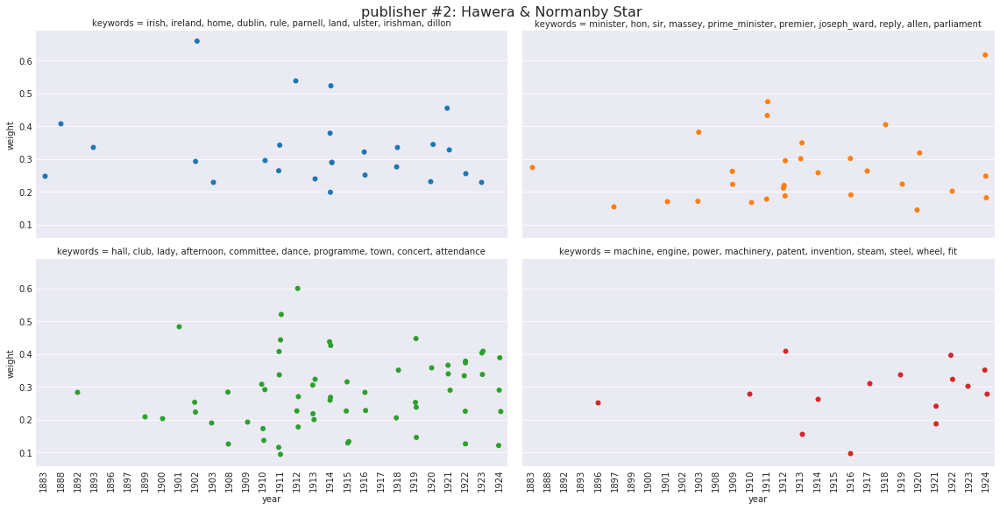

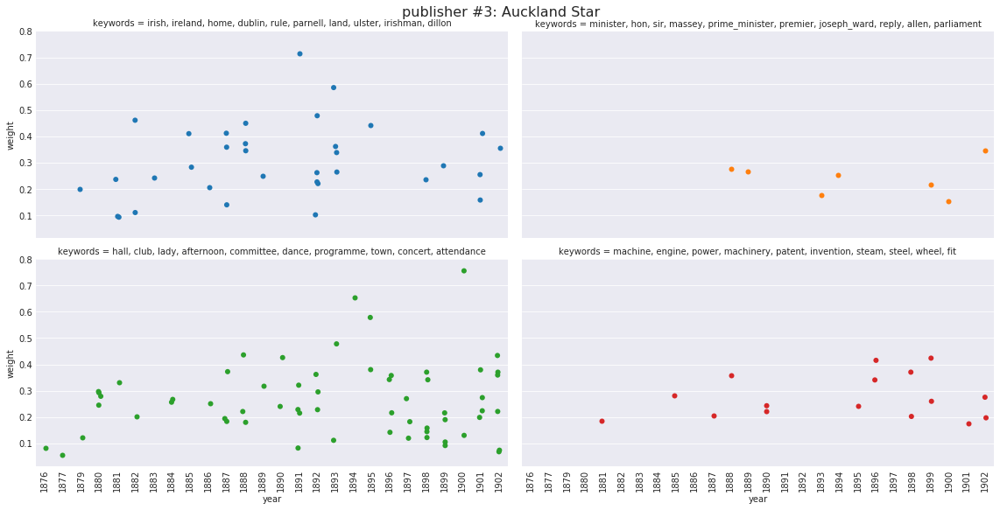

In [95]:
for i in range(4):
    g = sns.catplot(x='year', y='weight', hue='topic', col='keywords', col_wrap=2, 
                    kind='strip', height=4, aspect=2, jitter=1, dodge=False, s=6, legend=False,
                    data=df_topics_4[df_topics_4['publisher'] == publisher4[i]])
    g.fig.subplots_adjust(top=0.93)
    g.fig.suptitle('publisher #{}: {}'.format(i, publisher4[i]), fontsize=16)
    g.set_xticklabels(rotation=90)

**Bar chart**

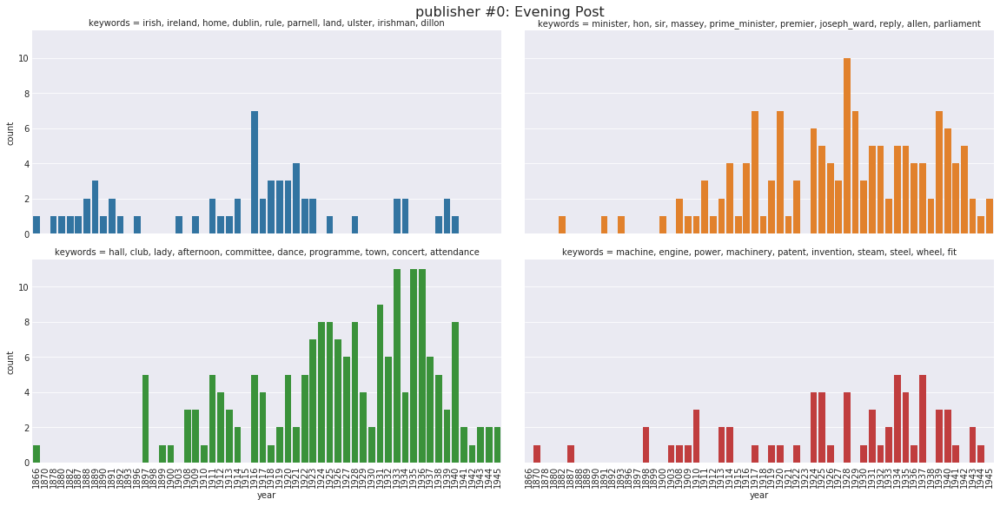

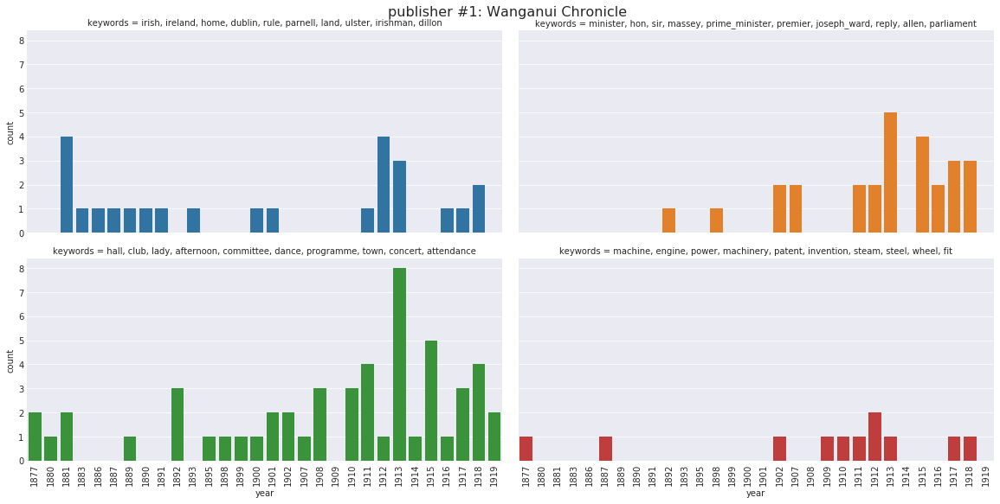

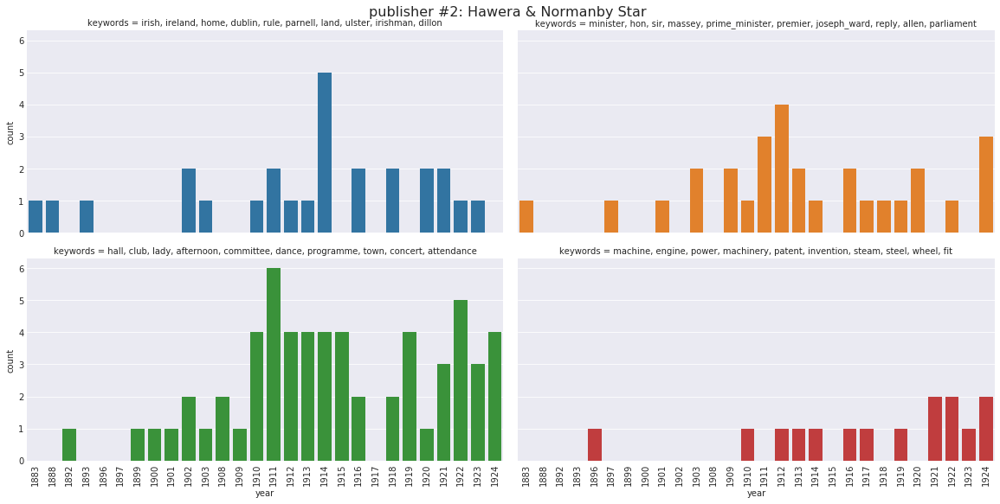

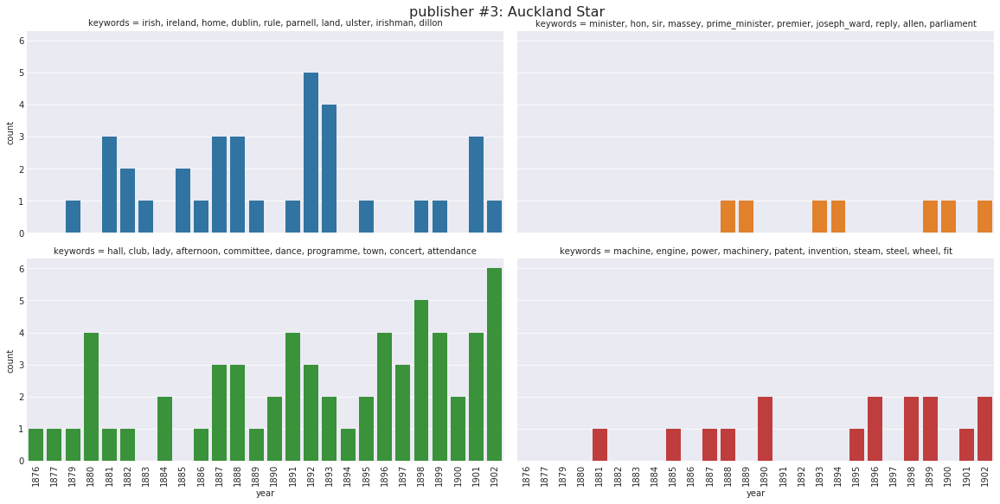

In [97]:
for i in range(4):
    g = sns.catplot(x='year', hue='topic', col='keywords', col_wrap=2, 
                    kind='count', height=4, aspect=2, dodge=False, legend=False,
                    data=df_topics_4[df_topics_4['publisher'] == publisher4[i]])
    g.fig.subplots_adjust(top=0.93)
    g.fig.suptitle('publisher #{}: {}'.format(i, publisher4[i]), fontsize=16)
    g.set_xticklabels(rotation=90)

**The data are sparse based on publishers, we may need more data to find patterns inside the data.**

## 9 Topics Over Time By Range of Year

**Privious part we use a random subset contains full range of year in raw dataset. In this part we use another strategy, we build a subset which contains all of data in a relatively small range of year, and build topic models from begining, then analyze and visualize the topics we get.** 

**For instance, we are interested in the topics in the papers during WWI, so we will research the topic models around the WWI date. As wikipedia define it was lasted from 28/7/1914 to 11/11/1918, we expand the time from 1912 to 1921 to analyze and visualize topics during these time.**

### 9.1 Subset By Range of Year

In [7]:
# load data if start the process from here.

path = r'../../data/mining'

data_schema = StructType([
    StructField('id', IntegerType()),
    StructField('publisher', StringType()),
    StructField('region', StringType()),
    StructField('date', DateType()),
    StructField('ads', BooleanType()),
    StructField('title', StringType()),
    StructField('content', StringType())
])
df = (
    spark.read.format("com.databricks.spark.csv")
    .option("header", "false")
    .option("inferSchema", "false")
    .schema(data_schema)
    .load(path)
    .orderBy('id')
)

**Filter out samples between start date and end date as subset:**

In [5]:
# constraint for range of year
START = '1912-01-01'
END = '1921-12-31'
subset_path = r'./subset/s{}_e{}_'.format(START, END) # mark start and end

In [9]:
# remove advertisements, sampling subset, and select columns.
df_sub = (
    df.filter((df['ads'] == False) & (df['date'] >= START) & (df['date'] <= END))
).toPandas()
print('Shape of dataframe:', df_sub.shape)
df_sub.sample(5)

Shape of dataframe: (3002271, 7)


,id,publisher,region,date,ads,title,content
1032535,18191975,Evening Post,Wellington,1915-10-16,False,COMMERCIAL & FINANCIAL,COMMERCIAL & FINANCIALBANK OF ENGLAND RETURN (...
1306232,23600347,Feilding Star,Manawatu-Wanganui,1913-07-15,False,TRAGIC.,TRAGIC.END TO A BOY'S CLIMBBY EI.EOTBIO TELEGB...
2344178,26636511,Colonist,Nelson,1915-05-10,False,PERSONAL.,"PERSONAL.Lieutenant -Fa-wet xi, ol Tadsiioi, '..."
2353340,26649867,Colonist,Nelson,1916-07-19,False,SUPREME COURT.,SUPREME COURT.$^^^iWN^iti^m--Si:Before Mr jrus...
478720,15970033,Poverty Bay Herald,Gisborne,1914-03-10,False,MAIL NOTICES.,"MAIL NOTICES.WEDNESDAY, MARCH 11. For Auckland..."


**We get a subset of 3 million samples. Then we check if the start and end date is correct:**

In [10]:
# check start and end date
start, end = (df_sub.date.min().strftime('%Y-%m-%d'), df_sub.date.max().strftime('%Y-%m-%d'))
start, end

('1912-01-01', '1921-12-31')

**The 3 million sample size subset is still too large for now, we randomly sample 10% of the subset to perform topic modeling.**

In [11]:
df_sub, _ = train_test_split(df_sub, test_size=0.9)
print('Shape of dataframe:', df_sub.shape)

Shape of dataframe: (300227, 7)


**Generate dataframe for topic modeling and dataframe of meta data, then save them for later use.**

In [12]:
df_sub_mallet = df_sub[['id', 'title', 'content']].sort_values(by='id', ascending=True) # MALLET take 3 columns.
df_sub_meta = df_sub[['id', 'publisher', 'region', 'date']].sort_values(by='id', ascending=True) # # Meta data for later use
print('\nShape of df_sub_mallet:', df_sub_mallet.shape)
print('\nShape of df_sub_meta:', df_sub_meta.shape)


Shape of df_sub_mallet: (300227, 3)

Shape of df_sub_meta: (300227, 4)


In [13]:
df_sub_mallet.head()

,id,title,content
1,3024489,Committee on Social Questions.,Committee on Social Questions.Archdeacon Willi...
7,3024712,The Blessed Sacrament,The Blessed Sacrament(By the Archdeacon of Lon...
28,3025551,Diocesan Library.,Diocesan Library.' Sermons for Lay- Readers. J...
30,3025612,Letter from the Bishop.,"Letter from the Bishop.My Dear People, Before ..."
45,3026663,CERTIFICATES.,CERTIFICATES.The following have been awarded C...


In [14]:
df_sub_meta.head()

,id,publisher,region,date
1,3024489,Waiapu Church Gazette,unknown,1912-01-01
7,3024712,Waiapu Church Gazette,unknown,1912-01-01
28,3025551,Waiapu Church Gazette,unknown,1912-02-01
30,3025612,Waiapu Church Gazette,unknown,1912-02-01
45,3026663,Waiapu Church Gazette,unknown,1912-03-01


In [15]:
%%time

df_sub_mallet.to_csv(subset_path+'mallet.csv', sep='\t', header=False, index=False, encoding='utf-8')
df_sub_meta.to_csv(subset_path+'meta.csv', header=False, index=False, encoding='utf-8')

CPU times: user 8.5 s, sys: 224 ms, total: 8.72 s
Wall time: 8.73 s


### 9.2 Topic Modeling By Gensim

**The same with part 7.2, get the LDA model. It's better using trained topic model of full dataset to infer the subset of years, in this way the topics may reflect features compair all years of full dataset. However, we did not have a topic model of full dataset for computing resource limitation, so currently we train and infer the subset of years not full dataset.**

In [7]:
# load into pandas dataframe
df = pd.read_table(subset_path+'mallet.csv', 
                   header=None, 
                   index_col=None, 
                   names = ['id', 'title', 'content'],
                   encoding='utf8')

print('Shape of dataframe:', df.shape)
df.sample(3)

Shape of dataframe: (300227, 3)


,id,title,content
101809,18169895,DEMAND FOR NATIONALISATION,DEMAND FOR NATIONALISATION(AUSTRALIAN - NEW ZE...
96288,17672920,ASSOCIATION FOOTBALL,ASSOCIATION FOOTBALLHOSPITAL v. CORINTHIANS. T...
170878,24813321,MASK BALL.,MASK BALL.j To step lightly and with rythm to ...


In [8]:
# prepare stopwords.
stop_words = stopwords.words('english')

# customize
stop_words.extend(['from'])

def sentences_to_words(sentences):
    for sentence in sentences:
        yield(simple_preprocess(str(sentence), deacc=True))  # deacc=True removes punctuations
        
def remove_stopwords(texts):
    return [[word for word in simple_preprocess(str(doc)) if word not in stop_words and len(word) > 2] for doc in texts]

def make_bigrams(texts):
    return [bigram_mod[doc] for doc in texts]


def lemmatization(texts, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV']):
    """https://spacy.io/api/annotation"""
    # Initialize spacy 'en' model, keeping only tagger component (for efficiency)
    nlp = spacy.load('en', disable=['parser', 'ner'])
    texts_out = []
    for sentence in texts:
        doc = nlp(" ".join(sentence)) 
        texts_out.append([token.lemma_ for token in doc if token.pos_ in allowed_postags])
    return texts_out

# row to list
data = df.content.values.tolist()

# tokenization
data_words = list(sentences_to_words(data))

# Build the bigram models
bigram = gensim.models.Phrases(data_words, min_count=10, threshold=200) # higher threshold fewer phrases.

# Get a sentence clubbed as a bigram
bigram_mod = gensim.models.phrases.Phraser(bigram)

# Remove Stop Words
data_words_nostops = remove_stopwords(data_words)

# Form Bigrams
data_words_bigrams = make_bigrams(data_words_nostops)

# Do lemmatization keeping only noun, adj, vb, adv
data_lemmatized = lemmatization(data_words_bigrams, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV'])

#print(data_lemmatized[:1])

# save processed word list for later use
path = r'./wwi_mallet/data'
with open(path, 'wb') as f:
    pickle.dump(data, f)
    
# Create Dictionary
id2word = corpora.Dictionary(data_lemmatized)
# reduce dimension, 
# ignore words that appear in less than 20 documents
# or more than 10% documents
id2word.filter_extremes(no_below=20, no_above=0.1)
path = r'./wwi_mallet/dictionary'
id2word.save(path)

# Create Corpus
texts = data_lemmatized

# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]
path = r'./wwi_mallet/corpus'
with open(path, 'wb') as f:
    pickle.dump(corpus, f)

# print corpus
# print(corpus[:1]) # unreadable
#[[(id2word[id], freq) for id, freq in cp] for cp in corpus[:1]]

INFO:gensim.models.phrases:collecting all words and their counts
INFO:gensim.models.phrases:PROGRESS: at sentence #0, processed 0 words and 0 word types
INFO:gensim.models.phrases:PROGRESS: at sentence #10000, processed 3540307 words and 1359463 word types
INFO:gensim.models.phrases:PROGRESS: at sentence #20000, processed 5228085 words and 1831924 word types
INFO:gensim.models.phrases:PROGRESS: at sentence #30000, processed 6914938 words and 2342856 word types
INFO:gensim.models.phrases:PROGRESS: at sentence #40000, processed 8679553 words and 2893659 word types
INFO:gensim.models.phrases:PROGRESS: at sentence #50000, processed 10464283 words and 3476527 word types
INFO:gensim.models.phrases:PROGRESS: at sentence #60000, processed 12340587 words and 4054224 word types
INFO:gensim.models.phrases:PROGRESS: at sentence #70000, processed 14155527 words and 4549783 word types
INFO:gensim.models.phrases:PROGRESS: at sentence #80000, processed 15964660 words and 5131965 word types
INFO:gensim

In [9]:
# Building LDA Mallet Model
mallet_path = '/usr/local/share/Mallet/bin/mallet' # the path is vary in a different server/computer.

TOPICS=250
ITERATION=2000
INTERVAL=20

ldamallet = gensim.models.wrappers.LdaMallet(mallet_path, 
                                             corpus=corpus, 
                                             num_topics=TOPICS, 
                                             id2word=id2word,
                                             workers=6,
                                             optimize_interval=INTERVAL,
                                             iterations=ITERATION)

path = r'./wwi_mallet/ldamallet'
ldamallet.save(path)

# transform models from MALLET to normal LDA model.
lda_model = gensim.models.wrappers.ldamallet.malletmodel2ldamodel(ldamallet)
#pprint(lda_model.show_topics(num_topics=TOPICS, num_words=10, formatted=False))

# save model
path = r'./wwi_mallet/ldamodel'
lda_model.save(path)

INFO:gensim.models.wrappers.ldamallet:serializing temporary corpus to /tmp/53016f_corpus.txt
INFO:gensim.models.wrappers.ldamallet:converting temporary corpus to MALLET format with /usr/local/share/Mallet/bin/mallet import-file --preserve-case --keep-sequence --remove-stopwords --token-regex "\S+" --input /tmp/53016f_corpus.txt --output /tmp/53016f_corpus.mallet
INFO:gensim.models.wrappers.ldamallet:training MALLET LDA with /usr/local/share/Mallet/bin/mallet train-topics --input /tmp/53016f_corpus.mallet --num-topics 250  --alpha 50 --optimize-interval 20 --num-threads 6 --output-state /tmp/53016f_state.mallet.gz --output-doc-topics /tmp/53016f_doctopics.txt --output-topic-keys /tmp/53016f_topickeys.txt --num-iterations 2000 --inferencer-filename /tmp/53016f_inferencer.mallet --doc-topics-threshold 0.0
INFO:gensim.models.wrappers.ldamallet:loading assigned topics from /tmp/53016f_state.mallet.gz
INFO:gensim.utils:saving LdaMallet object under ./wwi_mallet/ldamallet, separately None
INF

In [10]:
# Show Topics
pprint(lda_model.show_topics(num_topics=TOPICS, num_words=10, formatted=False))

[(0,
  [('private', 0.13057371707276053),
   ('wound', 0.038083124855467027),
   ('battalion', 0.026278722643849728),
   ('trooper', 0.024607395883700884),
   ('hospital', 0.023766476759097693),
   ('pte', 0.022378960203502427),
   ('rifleman', 0.02122269640717304),
   ('corporal', 0.019645973048542056),
   ('pvt', 0.01648201484222255),
   ('auckland', 0.014915802972649106)]),
 (1,
  [('strike', 0.06788068506757367),
   ('union', 0.05036872046473828),
   ('worker', 0.015663847334677784),
   ('federation', 0.015061854739186708),
   ('labour', 0.013671251843602324),
   ('striker', 0.01356289317641393),
   ('employer', 0.010342232790536676),
   ('meeting', 0.01028203353098757),
   ('trouble', 0.009102128043825061),
   ('member', 0.008873370857538452)]),
 (2,
  [('peace', 0.045805192486470844),
   ('germany', 0.04307781341771996),
   ('ally', 0.031989755397809475),
   ('term', 0.013630738731861082),
   ('treaty', 0.012793439514366454),
   ('paris', 0.012522548591059368),
   ('france', 0.01

### 9.3 Prepare Data

**The same with part 8.1 to get dominant topic list and topic-meta dataframe.**

In [11]:
# load data and model if start from here.
df_sub_meta = pd.read_csv(subset_path+'meta.csv', 
                          header=None, 
                          index_col=None, 
                          names = ['id', 'publisher', 'region', 'date'],
                          encoding='utf8')

#path = r'./gensim_mallet/data'
#with open(path, 'rb') as f:
#    data = pickle.load(f)

path = r'./wwi_mallet/dictionary'
id2word = corpora.Dictionary.load(path)

path = r'./wwi_mallet/corpus'
with open(path, 'rb') as f:
    corpus = pickle.load(f)

path = r'./wwi_mallet/ldamodel'
lda_model = gensim.models.LdaModel.load(path)
# check model loaded correctly
#pprint(lda_model.show_topics(num_topics=TOPICS, num_words=10, formatted=False))

INFO:gensim.utils:loading Dictionary object from ./wwi_mallet/dictionary
INFO:gensim.utils:loaded ./wwi_mallet/dictionary
INFO:gensim.utils:loading LdaModel object from ./wwi_mallet/ldamodel
INFO:gensim.utils:loading expElogbeta from ./wwi_mallet/ldamodel.expElogbeta.npy with mmap=None
INFO:gensim.utils:setting ignored attribute id2word to None
INFO:gensim.utils:setting ignored attribute dispatcher to None
INFO:gensim.utils:setting ignored attribute state to None
INFO:gensim.utils:loaded ./wwi_mallet/ldamodel
INFO:gensim.utils:loading LdaState object from ./wwi_mallet/ldamodel.state
INFO:gensim.utils:loading sstats from ./wwi_mallet/ldamodel.state.sstats.npy with mmap=None
INFO:gensim.utils:loaded ./wwi_mallet/ldamodel.state


In [13]:
%%time

def format_topics_doc(ldamodel=None, corpus=corpus):
    """
    https://www.machinelearningplus.com/nlp/topic-modeling-visualization-how-to-present-results-lda-models/
    """
    # Init output
    doc_topics_df = pd.DataFrame()

    # Get main topic in each document
    print('format_topics_doc::total {} docs.'.format(len(ldamodel[corpus])))
    for i, row_list in enumerate(ldamodel[corpus]): # very slow!!!!!!
        if (i%5000 == 0): 
            print('format_topics_doc::processing #{} doc...'.format(i))
            
        row = row_list[0] if ldamodel.per_word_topics else row_list            
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        
        # Get the Dominant topic, Perc Contribution and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
            if j == 0:  # => dominant topic
                wp = ldamodel.show_topic(topic_num)
                topic_keywords = ", ".join([word for word, prop in wp])
                doc_topics_df = doc_topics_df.append(
                    pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), 
                    ignore_index=True)
            else:
                break

    return(doc_topics_df)


# Format
df_dominant_topic = format_topics_doc(lda_model, corpus).reset_index()
df_dominant_topic.columns = ['index', 'topic', 'weight', 'keywords']

format_topics_doc::total 300227 docs.
format_topics_doc::processing #0 doc...
format_topics_doc::processing #5000 doc...
format_topics_doc::processing #10000 doc...
format_topics_doc::processing #15000 doc...
format_topics_doc::processing #20000 doc...
format_topics_doc::processing #25000 doc...
format_topics_doc::processing #30000 doc...
format_topics_doc::processing #35000 doc...
format_topics_doc::processing #40000 doc...
format_topics_doc::processing #45000 doc...
format_topics_doc::processing #50000 doc...
format_topics_doc::processing #55000 doc...
format_topics_doc::processing #60000 doc...
format_topics_doc::processing #65000 doc...
format_topics_doc::processing #70000 doc...
format_topics_doc::processing #75000 doc...
format_topics_doc::processing #80000 doc...
format_topics_doc::processing #85000 doc...
format_topics_doc::processing #90000 doc...
format_topics_doc::processing #95000 doc...
format_topics_doc::processing #100000 doc...
format_topics_doc::processing #105000 doc.

In [14]:
df_dominant_topic.head()

,index,topic,weight,keywords
0,0,72.0,0.5068,"church, rev, service, sunday, mission, evening..."
1,1,139.0,0.5181,"church, bishop, catholic, bible, christian, re..."
2,2,72.0,0.3022,"church, rev, service, sunday, mission, evening..."
3,3,139.0,0.3602,"church, bishop, catholic, bible, christian, re..."
4,4,95.0,0.4375,"miss, girl, prize, mary, standard, school, boy..."


In [15]:
df_topic_meta = df_dominant_topic.merge(df_sub_meta, how='left', left_index=True, right_index=True)
df_topic_meta['year'] = pd.to_datetime(df_topic_meta['date']).dt.year.astype(str)
df_topic_meta['topic'] = df_topic_meta['topic'].astype(int)

print('Check Null:', df_topic_meta.isnull().any().any())

path = r'./wwi_mallet/topic_meta.csv'
df_topic_meta.to_csv(path, header=False, index=False, encoding='utf-8')

print('shape of dataframe:', df_topic_meta.shape)
df_topic_meta.head()

Check Null: False
shape of dataframe: (300227, 9)


,index,topic,weight,keywords,id,publisher,region,date,year
0,0,72,0.5068,"church, rev, service, sunday, mission, evening...",3024489,Waiapu Church Gazette,unknown,1912-01-01,1912
1,1,139,0.5181,"church, bishop, catholic, bible, christian, re...",3024712,Waiapu Church Gazette,unknown,1912-01-01,1912
2,2,72,0.3022,"church, rev, service, sunday, mission, evening...",3025551,Waiapu Church Gazette,unknown,1912-02-01,1912
3,3,139,0.3602,"church, bishop, catholic, bible, christian, re...",3025612,Waiapu Church Gazette,unknown,1912-02-01,1912
4,4,95,0.4375,"miss, girl, prize, mary, standard, school, boy...",3026663,Waiapu Church Gazette,unknown,1912-03-01,1912


### 9.4 Topics Over Year

In [3]:
# load data if start from here.
path = r'./wwi_mallet/topic_meta.csv'
df_topic_meta = pd.read_csv(path, 
                            header=None, 
                            index_col=None, 
                            names = ['index', 'topic', 'weight', 'keywords', 'id', 'publisher', 'region', 'date', 'year'],
                            encoding='utf8')

#### 9.4.1 Top 10 Topics

**We count the dominant topic number and sort to find the top 10 hot topics during WWI:**

In [13]:
# show first 10 topics, keywords and count number
df_topic_meta.groupby(['topic', 'keywords']).size().reset_index(name='count').sort_values('count', ascending=False).head(10)

,topic,keywords,count
115,115,"picture, programme, story, film, theatre, dram...",6601
158,158,"enemy, attack, french, artillery, front, repul...",5335
50,50,"weather, moon, strong, quarter, south, moderat...",4207
238,238,"russian, enemy, capture, attack, austrian, fro...",4191
209,209,"russian, russia, bolshevik, petrograd, soviet,...",3955
231,231,"submarine, sink, steamer, crew, ship, vessel, ...",3908
2,2,"peace, germany, ally, term, treaty, paris, fra...",3744
160,160,"bulgarian, greek, greece, bulgaria, ally, balk...",3699
225,225,"death, body, deceased, inquest, die, dead, ret...",3695
171,171,"charge, court, magistrate, fin, case, sentence...",3475


In [5]:
# get and print dataframe to visualize
top10 = (df_topic_meta.groupby(['topic', 'keywords'])
         .size().reset_index(name='count')
         .sort_values('count', ascending=False)
         .topic[:10])
df_topics_10 = (df_topic_meta[df_topic_meta['topic'].isin(top10)]
                .sort_values(by='topic', ascending=True))
print('Shape of dataframe:', df_topics_10.shape)
df_topics_10.sample(5)

Shape of dataframe: (42810, 9)


,index,topic,weight,keywords,id,publisher,region,date,year
220986,220986,209,0.4422,"russian, russia, bolshevik, petrograd, soviet,...",26401054,Wanganui Chronicle,Manawatu-Wanganui,1919-03-04,1919
223391,223391,160,0.7970,"bulgarian, greek, greece, bulgaria, ally, balk...",26477610,Colonist,Nelson,1912-10-11,1912
161647,161647,50,0.8977,"weather, moon, strong, quarter, south, moderat...",24499513,Hawera & Normanby Star,Taranaki,1918-04-03,1918
110005,110005,2,0.3500,"peace, germany, ally, term, treaty, paris, fra...",18499573,Evening Post,Wellington,1921-12-31,1921
81337,81337,238,0.3038,"russian, enemy, capture, attack, austrian, fro...",16676677,Poverty Bay Herald,Gisborne,1917-02-13,1917


**Scatter Plot**

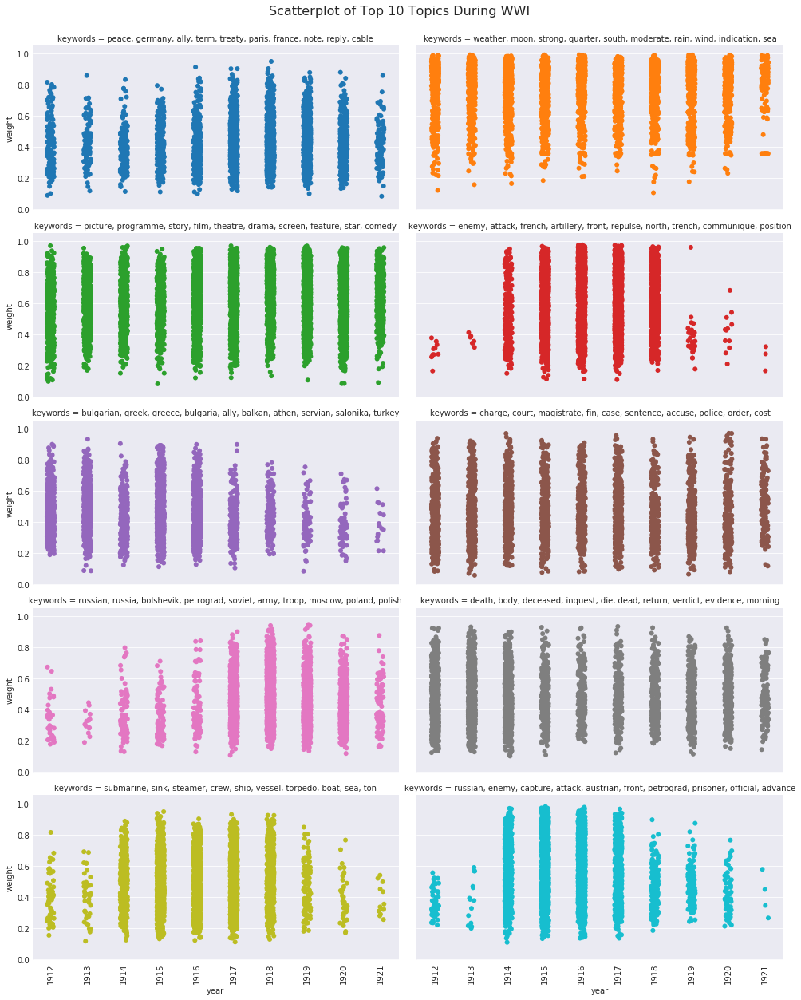

In [10]:
g = sns.catplot(x="year", y='weight', hue="topic", col='keywords', col_wrap=2, 
                kind='strip', height=3.5, aspect=2, jitter=1, dodge=False, s=6, legend=False,
                data=df_topics_10)
g.fig.subplots_adjust(top=0.94)
g.fig.suptitle("Scatterplot of Top 10 Topics During WWI", fontsize=16)
g.set_xticklabels(rotation=90)

**Bar Chart**

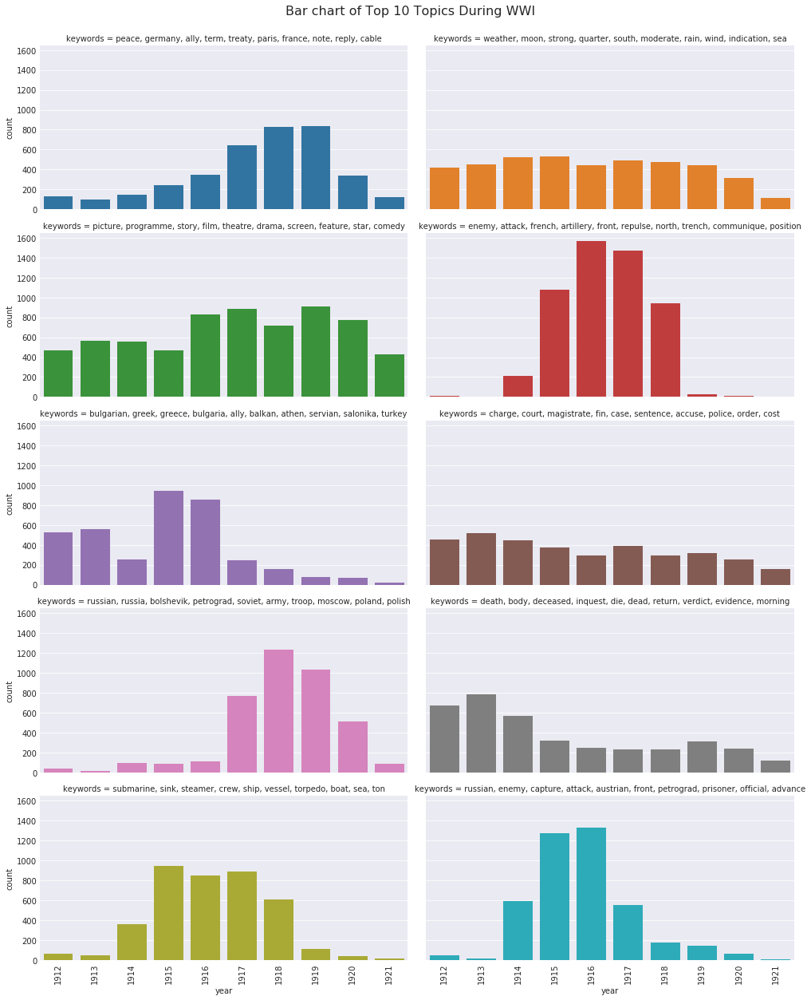

In [11]:
g = sns.catplot(x="year", hue="topic", col='keywords', col_wrap=2, 
                kind='count', height=3.5, aspect=2, dodge=False, legend=False, data=df_topics_10)
g.fig.subplots_adjust(top=0.94)
g.fig.suptitle("Bar chart of Top 10 Topics During WWI", fontsize=16)
g.set_xticklabels(rotation=90)

#### 9.4.2 By Specific Topics

**Here we select 4 typical topics which may vary with different era to visualize.**

* #1 strike
* #2 peace
* #158 enemy
* #225 death

In [14]:
topic_4 = [1, 2, 158, 225]
df_topics_4 = df_topic_meta[df_topic_meta['topic'].isin(topic_4)].sort_values(by='topic', ascending=True)
print('Shape of dataframe:', df_topics_4.shape)
df_topics_4.sample(5)

Shape of dataframe: (16176, 9)


,index,topic,weight,keywords,id,publisher,region,date,year
13562,13562,1,0.2683,"strike, union, worker, federation, labour, str...",13078571,Ashburton Guardian,Canterbury,1912-05-17,1912
58115,58115,1,0.3824,"strike, union, worker, federation, labour, str...",16231133,Ashburton Guardian,Canterbury,1919-06-03,1919
294190,294190,1,0.2681,"strike, union, worker, federation, labour, str...",32909239,Otago Daily Times,Otago,1919-04-08,1919
249438,249438,1,0.3977,"strike, union, worker, federation, labour, str...",26949198,Northern Advocate,Northland,1913-05-10,1913
28683,28683,158,0.8540,"enemy, attack, french, artillery, front, repul...",15330335,Ashburton Guardian,Canterbury,1916-03-14,1916


**Scatter Plot**

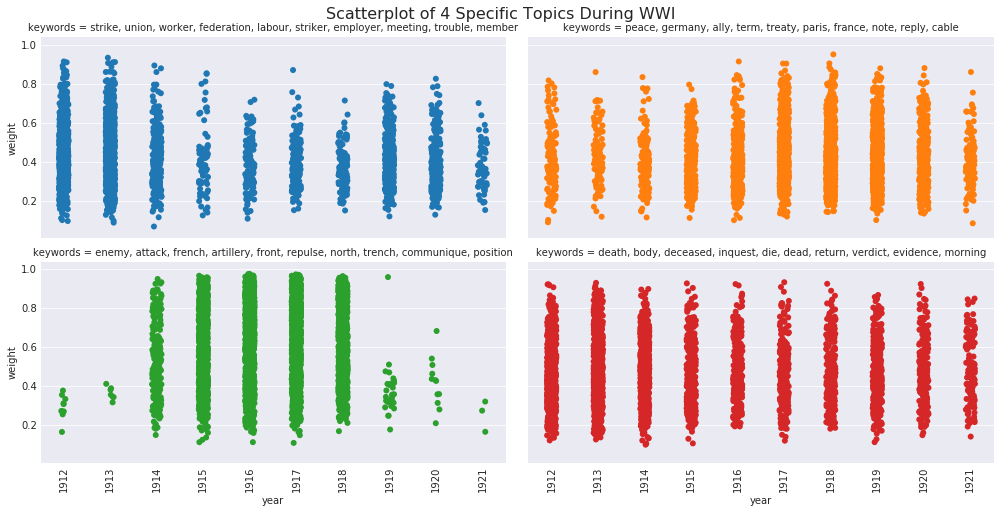

In [18]:
g = sns.catplot(x="year", y='weight', hue="topic", col='keywords', col_wrap=2, 
                kind='strip', height=3.5, aspect=2, jitter=1, dodge=False, s=6, legend=False,
                data=df_topics_4)
g.fig.subplots_adjust(top=0.92)
g.fig.suptitle("Scatterplot of 4 Specific Topics During WWI", fontsize=16)
g.set_xticklabels(rotation=90)

**Bar Chart**

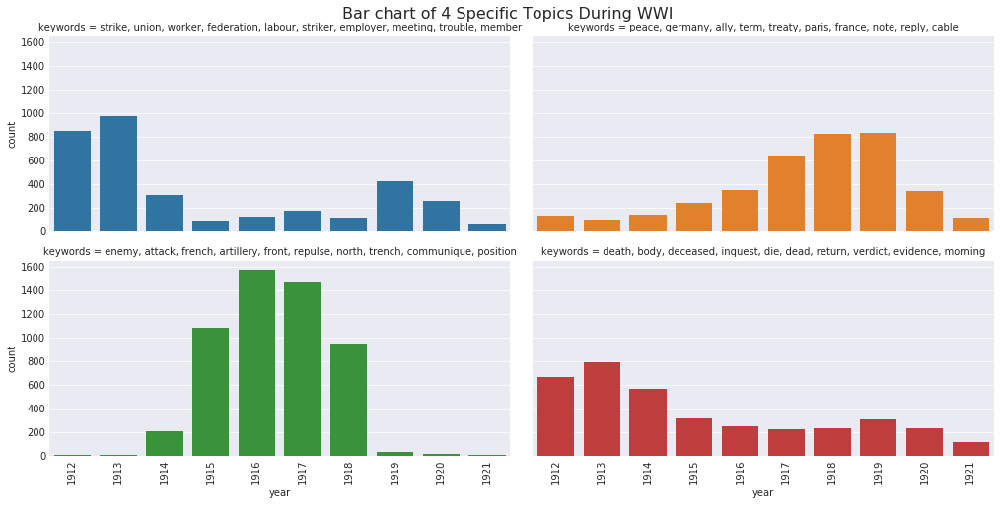

In [20]:
g = sns.catplot(x="year", hue="topic", col='keywords', col_wrap=2, 
                kind='count', height=3.5, aspect=2, dodge=False, legend=False,
                data=df_topics_4)
g.fig.subplots_adjust(top=0.92)
g.fig.suptitle("Bar chart of 4 Specific Topics During WWI", fontsize=16)
g.set_xticklabels(rotation=90)

**In this way, we see an interesting correlation that "strike" and "enemy" topics were an approximately negative relationship, as one falls, another rises. Also, the relationship between "peace" and "death" topics.**

#### 9.4.3 By Region

**Here we classify samples by region in dataframe level to visualize topics.**


**We focus on the 4 bigest city region and top 4 topics.**

In [23]:
big4 = ['Auckland', 'Wellington', 'Canterbury', 'Otago']

df_topics_4 = (df_topic_meta[(df_topic_meta['topic'].isin(top10[:4])) 
                            & (df_topic_meta['region'].isin(big4))]
               .sort_values(by=['region', 'topic'], ascending=True))

topic4 = df_topics_4.keywords.unique()

print('Shape of dataframe:', df_topics_4.shape)
df_topics_4.sample(5)

Shape of dataframe: (7197, 9)


,index,topic,weight,keywords,id,publisher,region,date,year
19993,19993,50,0.5728,"weather, moon, strong, quarter, south, moderat...",14228602,Ashburton Guardian,Canterbury,1914-12-28,1914
99849,99849,115,0.8242,"picture, programme, story, film, theatre, dram...",18138737,Evening Post,Wellington,1920-03-16,1920
109082,109082,115,0.3316,"picture, programme, story, film, theatre, dram...",18485202,Evening Post,Wellington,1921-04-30,1921
546,546,115,0.6549,"picture, programme, story, film, theatre, dram...",3583698,Otautau Standard and Wallace County Chronicle,Otago,1913-05-27,1913
297667,297667,50,0.6031,"weather, moon, strong, quarter, south, moderat...",34308383,Mataura Ensign,Otago,1914-11-07,1914


**Scatter Plot**

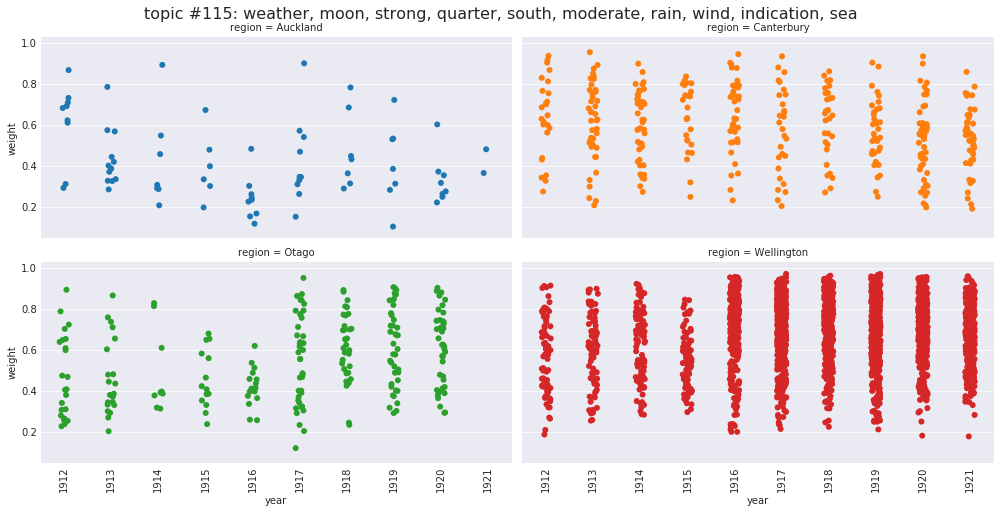

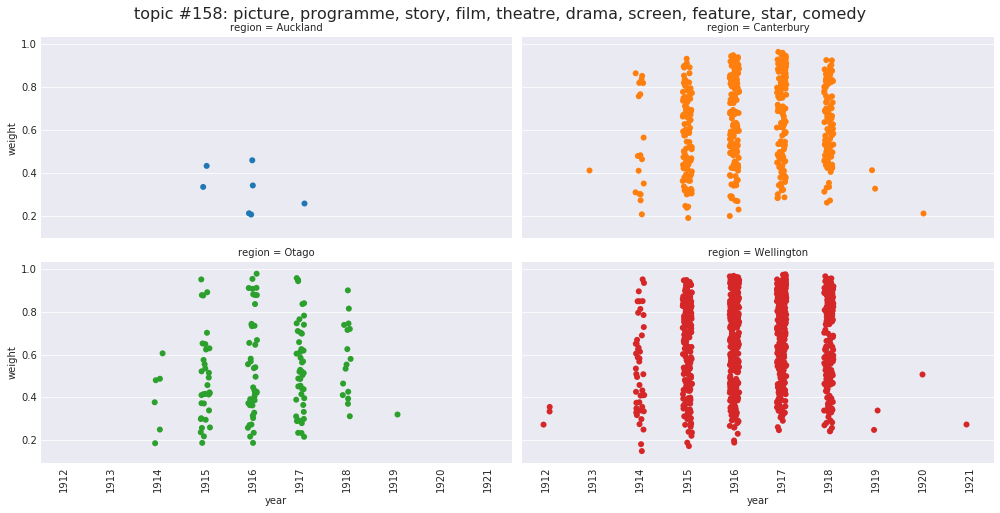

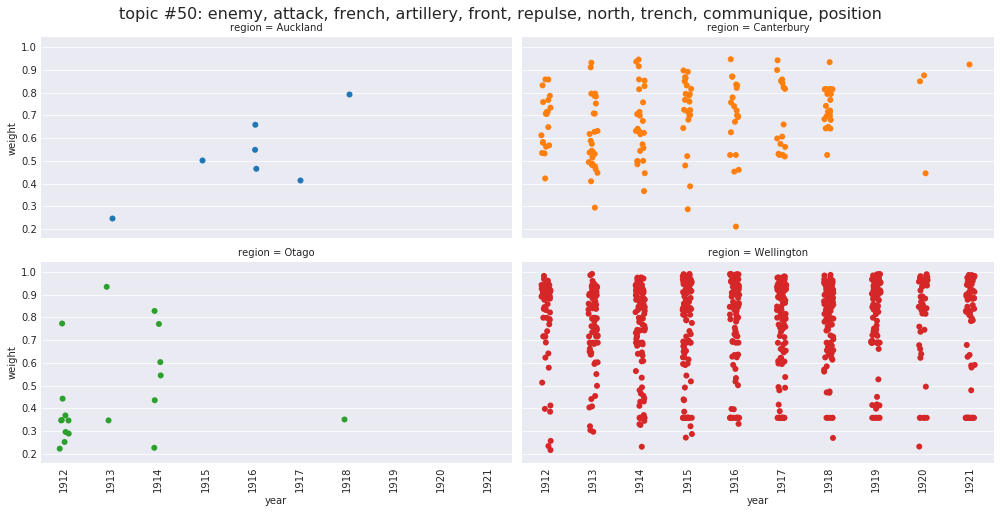

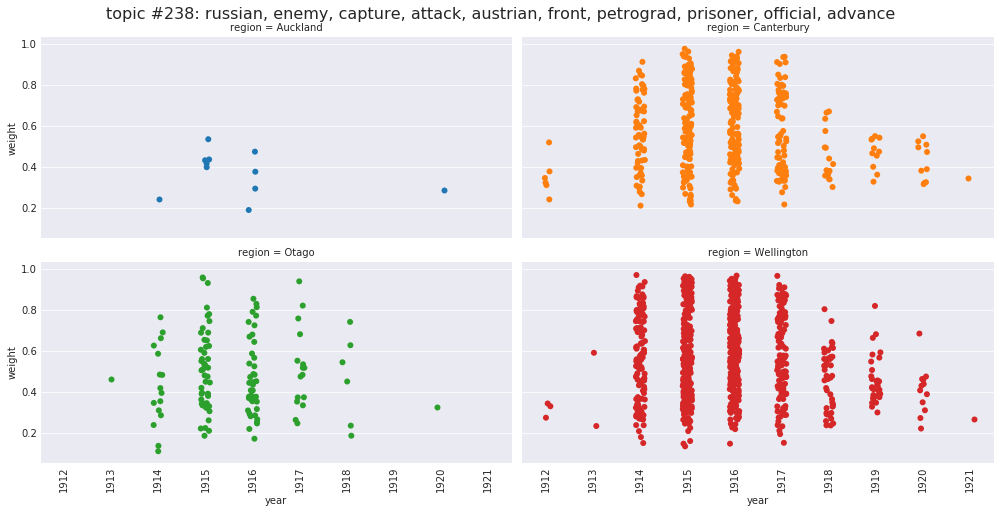

In [35]:
for i in range(4):
    g = sns.catplot(x='year', y='weight', hue='region', col='region', col_wrap=2, 
                    kind='strip', height=3.5, aspect=2, jitter=1, dodge=False, s=6,
                    data=df_topics_4[df_topics_4['topic'] == list(top10[:4])[i]])
    g.fig.subplots_adjust(top=0.92)
    g.fig.suptitle('topic #{}: {}'.format(list(top10[:4])[i], topic4[i]), fontsize=16)
    g.set_xticklabels(rotation=90)

**Bar Chart**

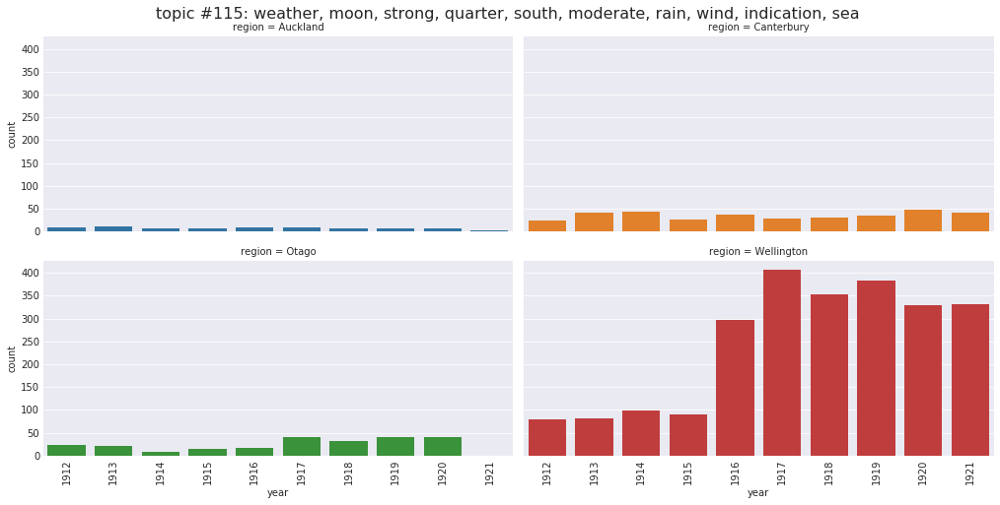

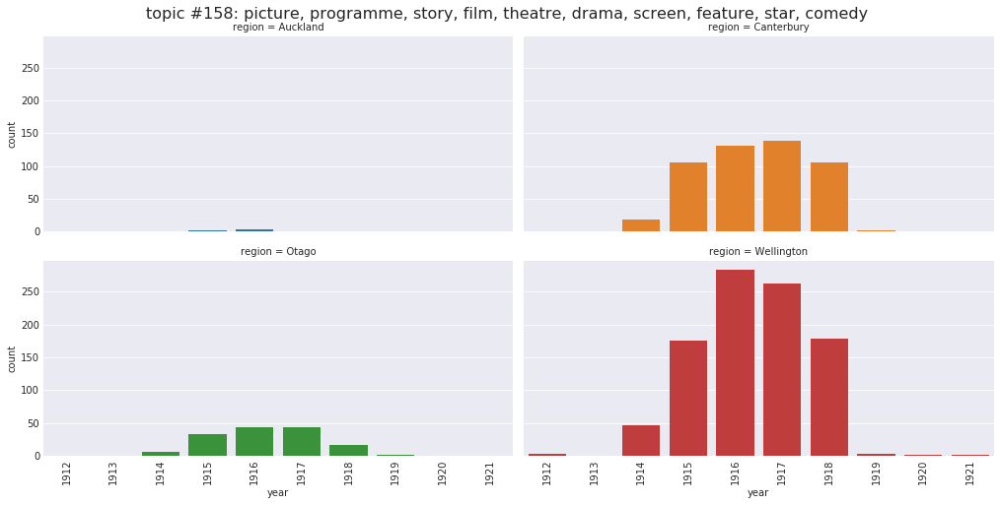

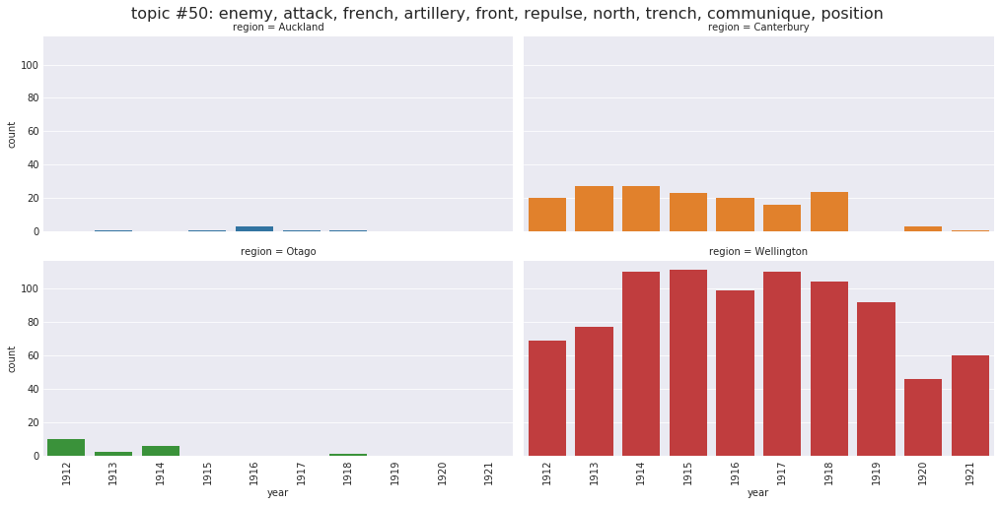

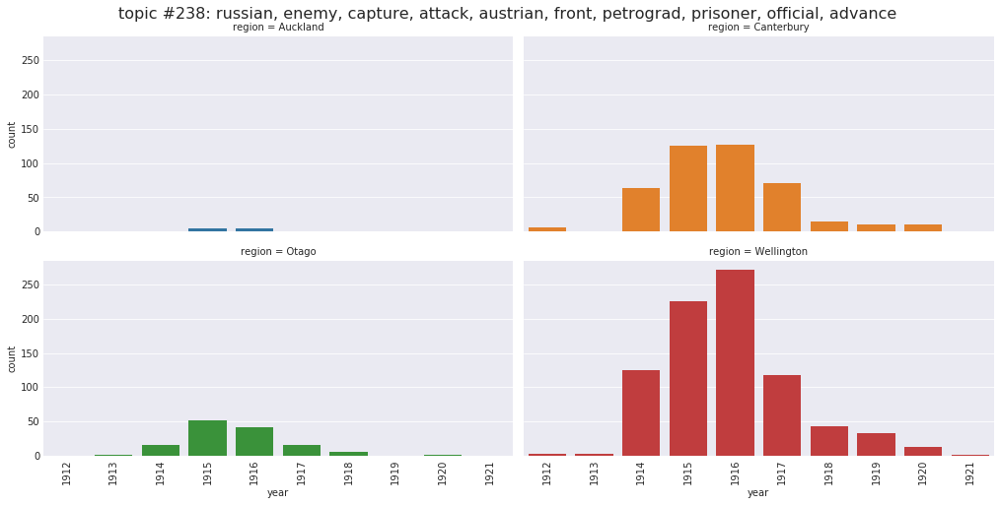

In [36]:
for i in range(4):
    g = sns.catplot(x='year', hue='region', col='region', col_wrap=2, 
                    kind='count', height=3.5, aspect=2, dodge=False, 
                    data=df_topics_4[df_topics_4['topic'] == list(top10[:4])[i]])
    g.fig.subplots_adjust(top=0.92)
    g.fig.suptitle('topic #{}: {}'.format(list(top10[:4])[i], topic4[i]), fontsize=16)
    g.set_xticklabels(rotation=90)

**We see the trend of each region were similar, but the quantity is different, press in Wellington were published more stories about the top 4 topics.**

#### 9.4.4 By Publisher

**Here we visualize top 4 topics of top 4 prolific publishers.**

In [37]:
# show 4 most prolific publishers
df_topic_meta.groupby(['publisher', 'region']).size().reset_index(name='count').sort_values('count', ascending=False).head(4)

,publisher,region,count
6,Evening Post,Wellington,41349
9,Hawera & Normanby Star,Taranaki,25747
26,Wanganui Chronicle,Manawatu-Wanganui,25496
1,Ashburton Guardian,Canterbury,24512


In [39]:
# get and show the dataframe to visualize
publisher4 = (df_topic_meta.groupby(['publisher', 'region'])
              .size().reset_index(name='count')
              .sort_values('count', ascending=False)
              .publisher.unique()[:4])

df_topics_4 = (df_topic_meta[(df_topic_meta['topic'].isin(top10[:4])) 
                            & (df_topic_meta['publisher'].isin(publisher4))]
               .sort_values(by=['region', 'topic'], ascending=True))

print('Shape of dataframe:', df_topics_4.shape)
df_topics_4.sample(5)

Shape of dataframe: (7994, 9)


,index,topic,weight,keywords,id,publisher,region,date,year
120132,120132,115,0.5795,"picture, programme, story, film, theatre, dram...",18734308,Evening Post,Wellington,1919-09-06,1919
124091,124091,115,0.8999,"picture, programme, story, film, theatre, dram...",19742915,Evening Post,Wellington,1916-06-01,1916
90496,90496,115,0.9133,"picture, programme, story, film, theatre, dram...",17086251,Evening Post,Wellington,1918-08-31,1918
39988,39988,158,0.8454,"enemy, attack, french, artillery, front, repul...",15743649,Ashburton Guardian,Canterbury,1917-05-18,1917
216550,216550,158,0.4173,"enemy, attack, french, artillery, front, repul...",26331150,Wanganui Chronicle,Manawatu-Wanganui,1918-01-08,1918


**Scatter Plot**

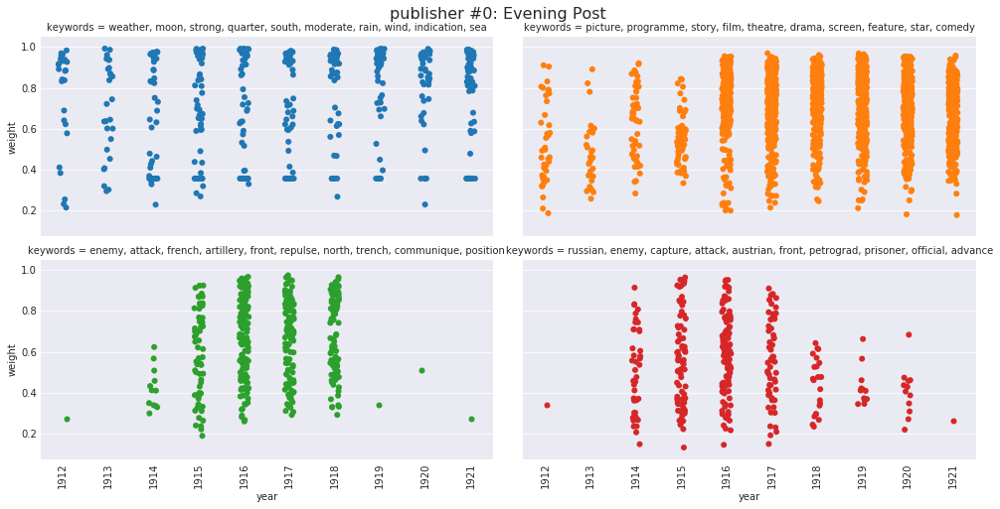

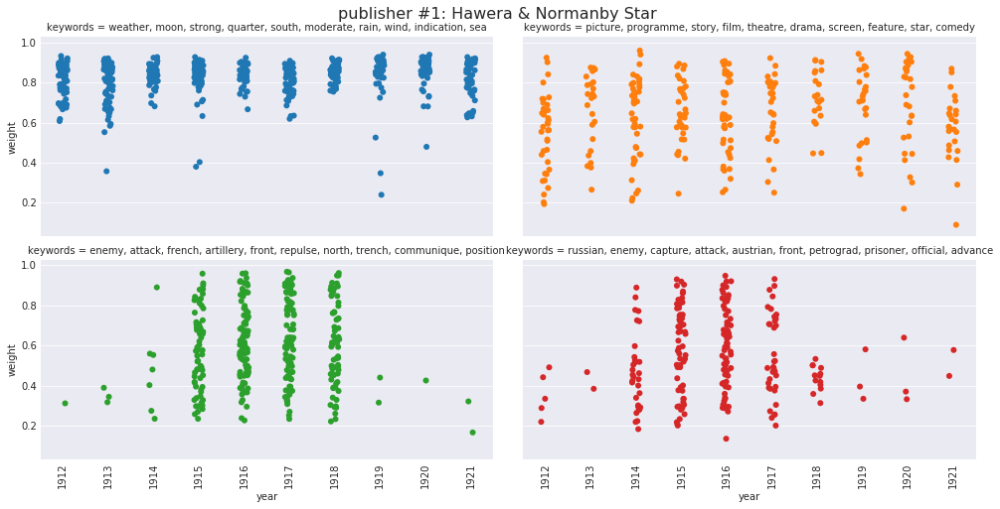

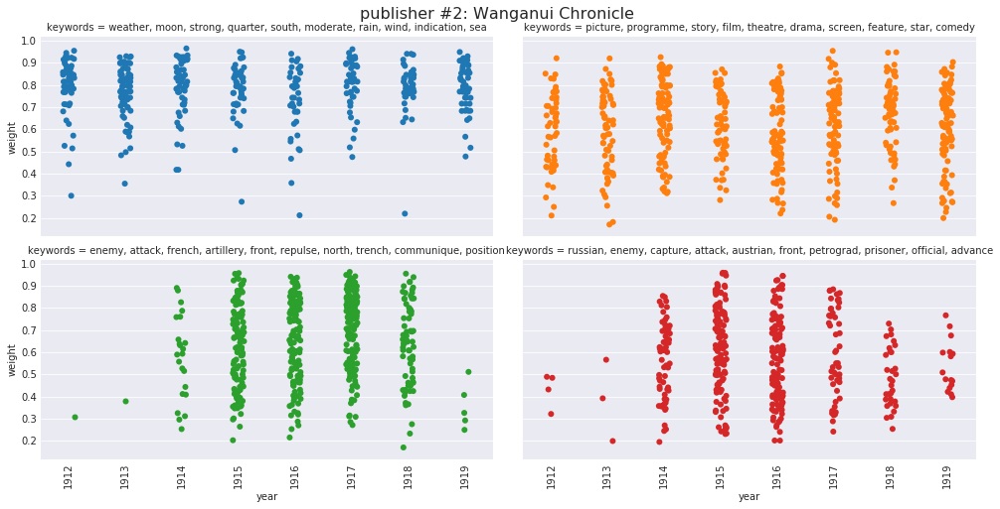

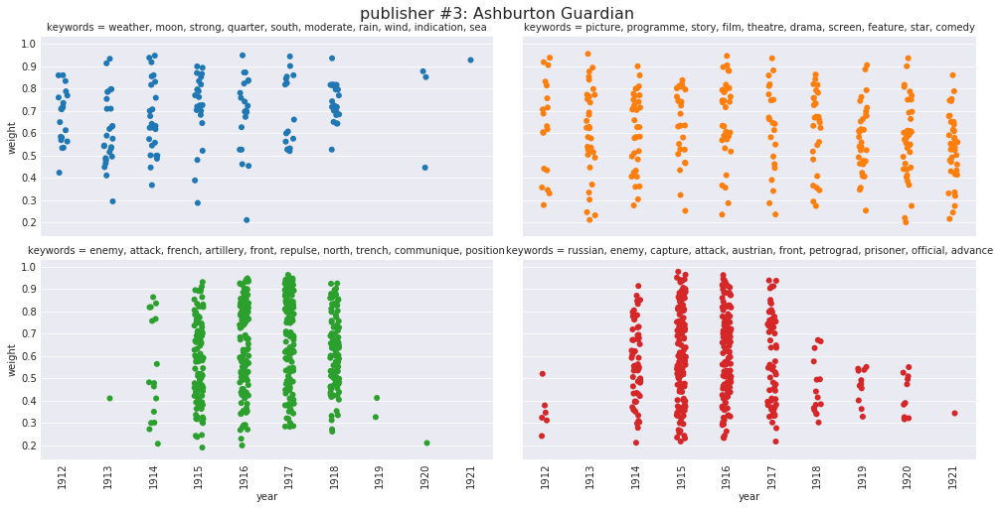

In [42]:
for i in range(4):
    g = sns.catplot(x='year', y='weight', hue='topic', col='keywords', col_wrap=2, 
                    kind='strip', height=3.5, aspect=2, jitter=1, dodge=False, s=6, legend=False,
                    data=df_topics_4[df_topics_4['publisher'] == publisher4[i]])
    g.fig.subplots_adjust(top=0.92)
    g.fig.suptitle('publisher #{}: {}'.format(i, publisher4[i]), fontsize=16)
    g.set_xticklabels(rotation=90)

**Bar Chart**

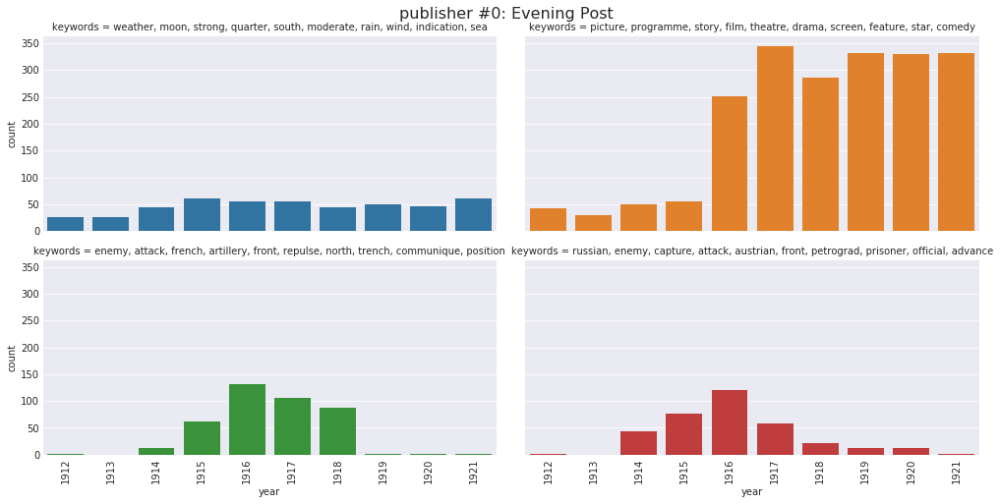

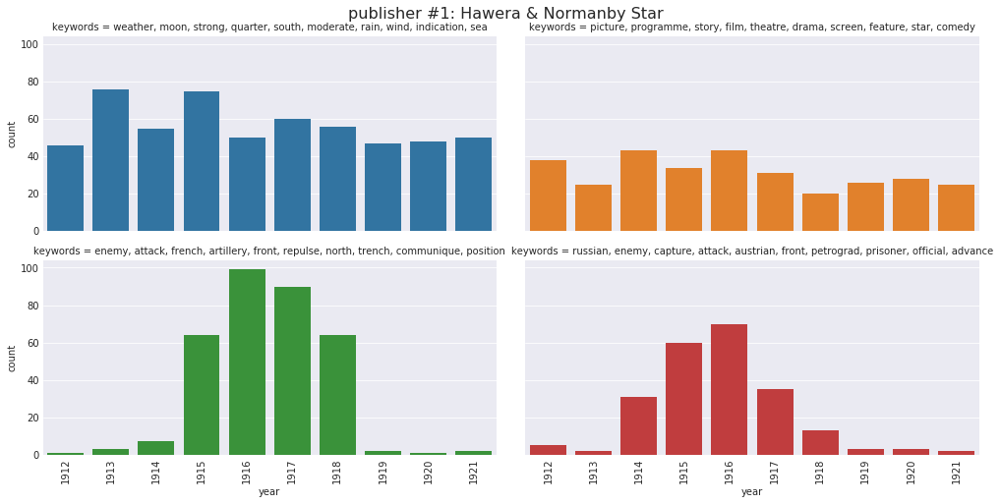

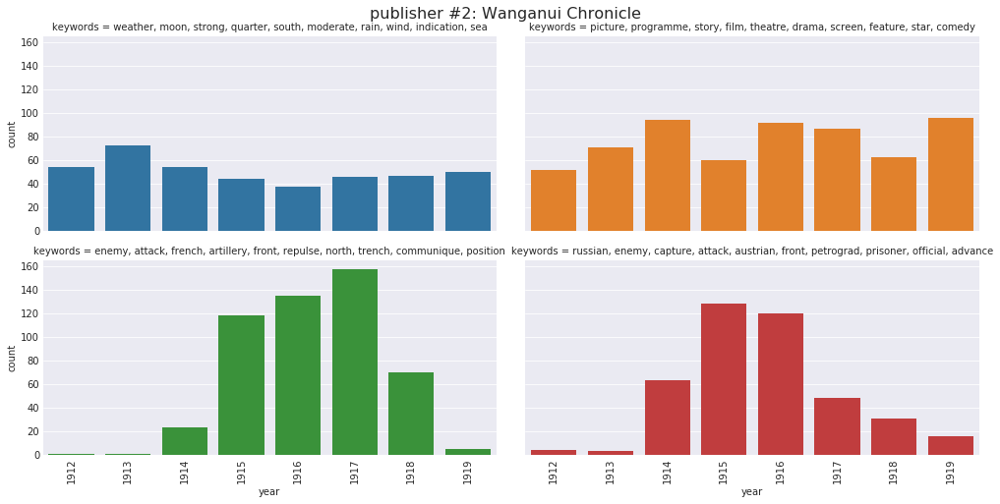

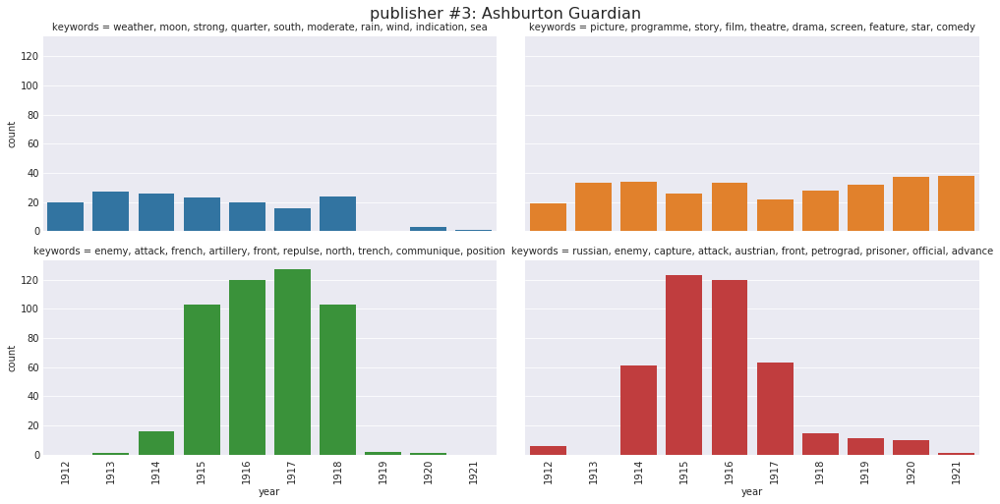

In [44]:
for i in range(4):
    g = sns.catplot(x='year', hue='topic', col='keywords', col_wrap=2, 
                    kind='count', height=3.5, aspect=2, dodge=False, legend=False,
                    data=df_topics_4[df_topics_4['publisher'] == publisher4[i]])
    g.fig.subplots_adjust(top=0.92)
    g.fig.suptitle('publisher #{}: {}'.format(i, publisher4[i]), fontsize=16)
    g.set_xticklabels(rotation=90)

**From above plots, we see that the trend of each topic published by each press is similar, but the quantity is different,  "Event Post" presented more entertainment related (topic "picture") stories, while "Hawera & Normanby Star" showed more concern about weather.**

## 10 Discussion

In this notebook, we spent 4 weeks, took ["Mining the Dispatch"](http://dsl.richmond.edu/dispatch/) as reference, employed Pandas, PySpark, MALLET, gensim, matplotlib, seaborn, bokeh, BeautifulSoup, tesseract, SymSpell and other data processing, NLP and visualization packages or tools, accomplished below work:

1. data process platform compare (python vs spark)
1. data wrangling for raw dataset on PySpark
1. analysis and visualization for dataset file, processed dataset
1. OCR qulity evaluation
1. spelling correction evaluation
1. sampling subset by random and by range of year
1. text pre-processing and topic modeling by MALLET and MALLET in gensim
1. analysis and visualization for topics over time by general, by specific topics, by region and by publisher

Limited by time and ability, there are some works could not be managed yet, including:

1. utilize MALLET result files to analyze and visualize topic models (we use topic models itself to visualize topics)
1. add line/point plots to visualize topics (generally line plots are more intuitive than bar chart to present trend, we did not use line plots for a unsolved code issue) 
1. train full dataset topic models (we use subset train topic models)
1. quantitative analysis the optimal topic number (we tried several numbers and use 250 as topic number but did not quantitative analyze why use 250)
1. find more statistical mathods to present topics in plots (we simply plot distribution of topics by scatter plot and count dominant topic number, a statistical presentation should base on weight, percentage and mean etc.)
1. find and employ interactive visualization tools for topics over time (none of the plots for topics over time is interactive)
1. do more interpretation work to make topic modeling more meaningfull (we did not interpretate the plots much)
1. improve code efficiency and readability (some code are low efficiency and some code did not comment well)
1. reorganize and split this notebook which is lengthy, make it easy to open and read